In [3]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '/home/jw3514/Work/ASD_Circuits/src')
from ASD_Circuits import *
os.chdir("/home/jw3514/Work/ASD_Circuits/notebooks/")
print(f"Current working directory: {os.getcwd()}")

HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()
gnomad_cons = pd.read_csv("../dat/genes/gnomad.v2.1.1.lof_metrics.by_gene.txt",
                          delimiter="\t", index_col="gene")
str2reg = STR2Region()
ExpZ2Mat = pd.read_csv("../dat/allen-mouse-exp/AllenMouseBrain_Z2bias.csv", index_col=0)
ExpZ2Mat_NN = pd.read_csv("../dat/allen-mouse-exp/AllenMouseBrain_Z2bias.neuronorm.csv", index_col=0)
ExpLMat = pd.read_csv("../dat/allen-mouse-exp/ExpLevel.csv", index_col=0)



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working directory: /home/jw3514/Work/ASD_Circuits/notebooks


In [55]:
def CountMut(DF):
    N_LGD, N_mis, N_Dmis, N_syn = 0,0,0,0
    for i, row in DF.iterrows():
        GeneEff = row["GeneEff"].split(";")[0]
        if GeneEff in ["frameshift", "splice_acceptor", "splice_donor", "start_lost", "stop_gained", "stop_lost"]:
            N_LGD += 1
        elif GeneEff == "missense":
            N_mis += 1
            row["REVEL"] = row["REVEL"].split(";")[0]
            if row["REVEL"] != ".":
                if float(row["REVEL"]) > 0.5:
                    N_Dmis += 1
        elif GeneEff == "synonymous":
            N_syn += 1
    return N_LGD, N_mis, N_Dmis, N_syn
def Mut2GeneDF(MutDF, PPVs = [0.554, 0.333, 0.138, 0.130], LGD=True, Dmis=True):
    genes = np.array(list(set(MutDF["HGNC"].values)))
    dat = []
    gene2MutN = {}
    for g in genes:
        try:
            Entrez = int(GeneSymbol2Entrez[g])
        except:
            Entrez = -1
            continue
        Muts = MutDF[MutDF["HGNC"]==g]
        try:
            pLI = float(Muts["ExACpLI"].values[0])
        except:
            pLI = 0
        N_LGD, N_Mis, N_Dmis, N_Syn = CountMut(Muts)
        if not LGD:
            N_LGD = 0
        if not Dmis:
            N_Dmis = 0
        if pLI > 0.5:
            gene2MutN[Entrez] = N_LGD * PPVs[0] + N_Dmis * PPVs[1]
        else:
            gene2MutN[Entrez] = N_LGD * PPVs[2] + N_Dmis * PPVs[3]
    return gene2MutN
def GetBiasDat(DF, STRs):
    biases = DF.loc[STRs, "EFFECT"].values
    return np.mean(biases)
def GetBootsDist(DFs, STRs):
    dat = []
    for df in DFs:
        tmp = []
        biases = df.loc[STRs, "EFFECT"].values
        dat.append(np.mean(biases))
    return np.array(dat)
def GetBootErr(DFs1, DFs2, STRs):
    dat = []
    for df1, df2 in zip(DFs1, DFs2):
        tmp = []
        biases1 = df1.loc[STRs, "EFFECT"].values
        biases2 = df2.loc[STRs, "EFFECT"].values
        bias_diff = biases1 - biases2
        dat.append(np.mean(bias_diff))
    return np.array(dat)


# Create Master Table for Phenotype

In [5]:
ASD_Discov_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Discov_DNVs.txt", delimiter="\t")
ASD_Discov_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Discov_Trios.txt", delimiter="\t")

ASD_Rep_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Rep_DNVs.txt", delimiter="\t")
ASD_Rep_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Rep_Trios.txt", delimiter="\t")

ASD_Muts = pd.concat([ASD_Discov_Muts, ASD_Rep_Muts])
ASD_Trios = pd.concat([ASD_Discov_Trios, ASD_Rep_Trios])

Spark_Meta_2stage = pd.read_excel("../dat/genes/asd/TabS_DenovoWEST_Stage1+2.xlsx",
                           skiprows=2, sheet_name="TopDnEnrich")
Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1.3e-6]
#Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1e-3]
HighConfGenes = Spark_Meta_HC["HGNC"].values
HighConfMuts = ASD_Muts[ASD_Muts["HGNC"].isin(HighConfGenes)]
HighConfMuts = Filt_LGD_Mis(HighConfMuts, Dmis=True)

In [6]:
Mut_n_IQ = HighConfMuts[["IID", "Sex", "Pheno", "VarID", "GeneID", "HGNC", "GeneEff", 
                        "REVEL", "ExACpLI"]]
ASC_IQ_search = ASC_IQ_dat.set_index("Phenotype_ID")
Spark_IQ_search = Spark_IQ_dat.set_index("subject_sp_id")

NameError: name 'ASC_IQ_dat' is not defined

In [11]:
for i, row in Mut_n_IQ.iterrows():
    Mut_n_IQ.loc[i, "Entrez"] = int(GeneSymbol2Entrez[row["HGNC"]])
    IID = row["IID"]
    if IID in ASC_IQ_search.index.values:
        Mut_n_IQ.loc[i, "IQ"] = ASC_IQ_search.loc[IID, "IQ"]
    elif IID in Spark_IQ_search.index.values:
        Mut_n_IQ.loc[i, "IQ"] = Spark_IQ_search.loc[IID, "fsiq"]
    else:
        Mut_n_IQ.loc[i, "IQ"] = -1
Mut_n_IQ = Mut_n_IQ[Mut_n_IQ["IQ"]!=-1]
Mut_n_IQ["Entrez"] = [int(x) for x in Mut_n_IQ["Entrez"].values]

/tmp/ipykernel_466908/418189742.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Mut_n_IQ.loc[i, "Entrez"] = int(GeneSymbol2Entrez[row["HGNC"]])
/tmp/ipykernel_466908/418189742.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Mut_n_IQ.loc[i, "IQ"] = -1


In [12]:
Mut_n_IQ.to_csv("../dat/Other/IQ_Mutation.Mar17.2023.csv", index=False)

# IQ and MutType

In [7]:
ASC_IQ_dat = pd.read_excel("../doc/1-s2.0-S0092867419313984-mmc4.xlsx", sheet_name="Phenotype")
ASC_IQ_dat = ASC_IQ_dat[ASC_IQ_dat["Role"]=="Proband"]
ASC_IQ_dat = ASC_IQ_dat.dropna(subset=['IQ'])

ASC_HIQ = ASC_IQ_dat[ASC_IQ_dat["IQ"]>70]["Phenotype_ID"].values
ASC_LIQ = ASC_IQ_dat[ASC_IQ_dat["IQ"]<=70]["Phenotype_ID"].values

Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")
Spark_IQ_dat = Spark_IQ_dat[Spark_IQ_dat["asd"]==True]
Spark_IQ_dat = Spark_IQ_dat.dropna(subset=['fsiq'])

Spark_HIQ = Spark_IQ_dat[Spark_IQ_dat["fsiq"]>70]["subject_sp_id"].values
Spark_LIQ = Spark_IQ_dat[Spark_IQ_dat["fsiq"]<=70]["subject_sp_id"].values

HighIQ = np.concatenate([ASC_HIQ, Spark_HIQ])
LowIQ = np.concatenate([ASC_LIQ, Spark_LIQ])

ASD_Discov_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Discov_DNVs.txt", delimiter="\t")
ASD_Discov_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Discov_Trios.txt", delimiter="\t")

ASD_Rep_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Rep_DNVs.txt", delimiter="\t")
ASD_Rep_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Rep_Trios.txt", delimiter="\t")

ASD_Muts = pd.concat([ASD_Discov_Muts, ASD_Rep_Muts])
ASD_Trios = pd.concat([ASD_Discov_Trios, ASD_Rep_Trios])

Spark_Meta_2stage = pd.read_excel("../dat/genes/asd/TabS_DenovoWEST_Stage1+2.xlsx",
                           skiprows=2, sheet_name="TopDnEnrich")
Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1.3e-6]
#Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1e-3]
HighConfGenes = Spark_Meta_HC["HGNC"].values
HighConfMuts = ASD_Muts[ASD_Muts["HGNC"].isin(HighConfGenes)]
HighConfMuts = Filt_LGD_Mis(HighConfMuts, Dmis=True)


HIQ_Muts = HighConfMuts[HighConfMuts["IID"].isin(HighIQ)]
LIQ_Muts = HighConfMuts[HighConfMuts["IID"].isin(LowIQ)]

/home/jw3514/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_1012268/2412101173.py:8: DtypeWarning: Columns (19,21) have mixed types. Specify dtype option on import or set low_memory=False.
  Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")


In [8]:
print(HIQ_Muts.shape, LIQ_Muts.shape)

(102, 44) (119, 44)


###### IQ Distribution

81.32026550508193
78.9237621540763


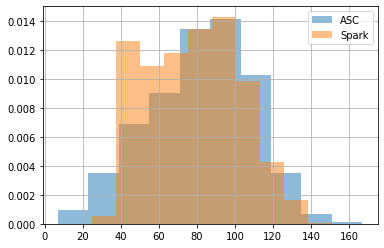

In [9]:
ASC_IQ_dat["IQ"].hist(label="ASC", density=1, alpha=0.5)
print(ASC_IQ_dat["IQ"].mean())

Spark_IQ_dat["fsiq"].hist(label="Spark", density=1, alpha=0.5)
print(Spark_IQ_dat["fsiq"].mean())

plt.legend()

Text(0.5, 0, 'FSIQ')

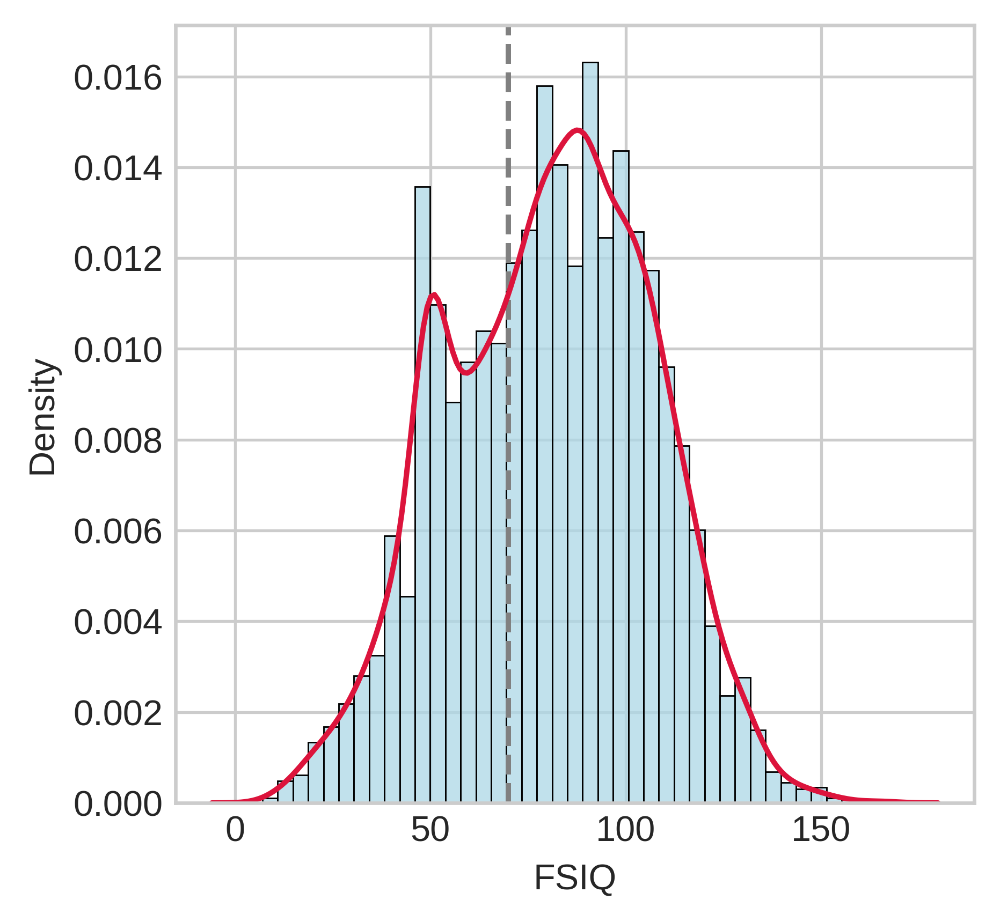

In [92]:
IQs = list(ASC_IQ_dat["IQ"].values) + list(Spark_IQ_dat["fsiq"].values)
fig, ax = plt.subplots(dpi=480, figsize=(4,4))
ax.axvline(x=70, color="grey", ls="dashed")
sns.kdeplot(IQs, color="crimson")
sns.histplot(IQs, stat="density", color="lightblue")
plt.xlabel("FSIQ")

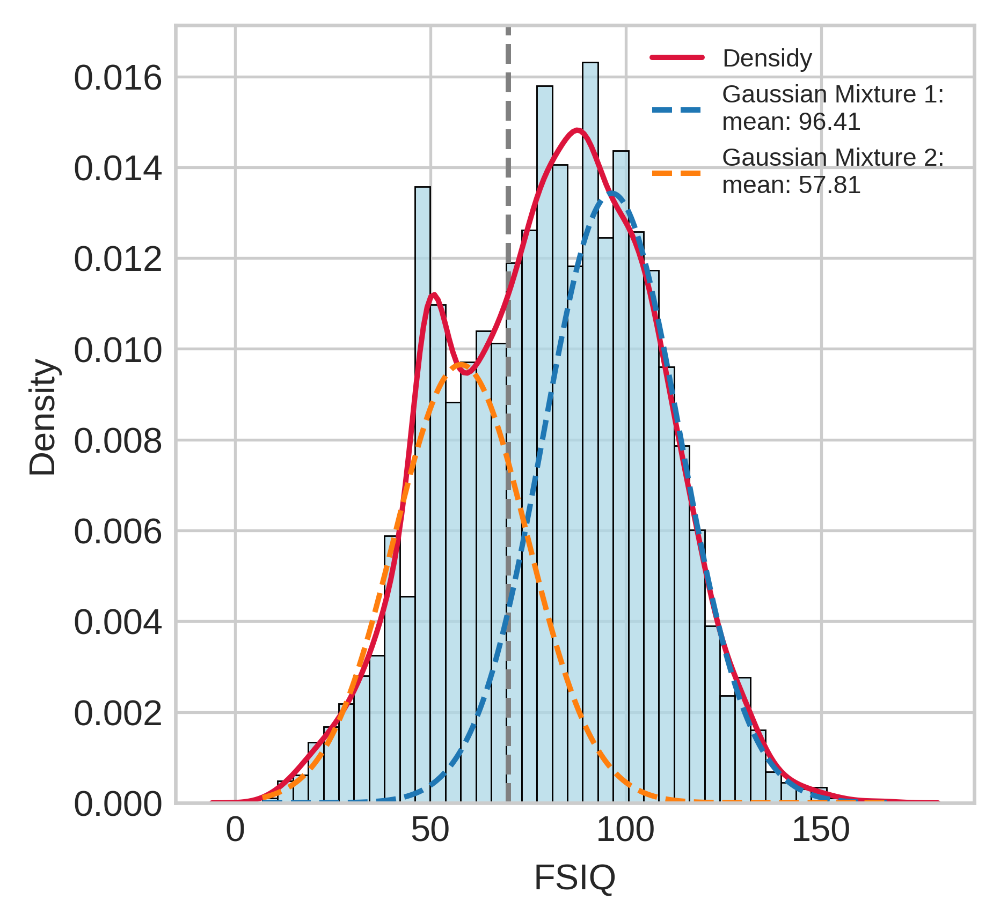

In [102]:
from sklearn.mixture import GaussianMixture
import numpy as np

IQs = list(ASC_IQ_dat["IQ"].values) + list(Spark_IQ_dat["fsiq"].values)
IQs = np.array(IQs).reshape(-1, 1)

gmm = GaussianMixture(n_components=2)
gmm.fit(IQs)
means = gmm.means_.flatten()
covariances = gmm.covariances_.flatten()
weights = gmm.weights_.flatten()

fig, ax = plt.subplots(dpi=480, figsize=(4,4))
ax.axvline(x=70, color="grey", ls="dashed")
sns.kdeplot(IQs.flatten(), color="crimson", label="Densidy")
sns.histplot(IQs.flatten(), stat="density", color="lightblue")

#x = np.linspace(min(IQs), max(IQs), 1000).reshape(-1, 1)
#logprob = gmm.score_samples(x)
#pdf = np.exp(logprob)
#ax.plot(x, pdf, '-k', label='Gaussian Mixture Model')

# Plot density of each Gaussian component separately
i = 1
for mean, covar, weight in zip(means, covariances, weights):
    component_pdf = weight * (1/np.sqrt(2 * np.pi * covar)) * np.exp(-0.5 * ((x - mean) ** 2) / covar)
    ax.plot(x, component_pdf, '--', label=f'Gaussian Mixture {i}: \nmean: {mean:.2f}')
    i += 1

plt.xlabel("FSIQ")
plt.legend(fontsize=7)

96.45090797168359
94.46167178856793


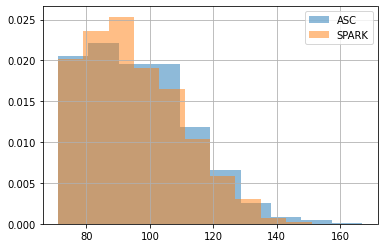

In [11]:
tmp1 = ASC_IQ_dat[ASC_IQ_dat["IQ"]>70]
tmp1["IQ"].hist(label="ASC", density=1, alpha=0.5)
print(tmp1["IQ"].mean())

tmp2 = Spark_IQ_dat[Spark_IQ_dat["fsiq"]>70]
tmp2["fsiq"].hist(label="SPARK", density=1, alpha=0.5)
print(tmp2["fsiq"].mean())
plt.legend()

49.487246566383256
54.063


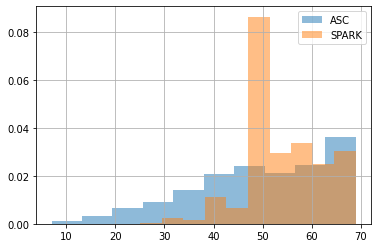

In [12]:
tmp1 = ASC_IQ_dat[ASC_IQ_dat["IQ"]<70]
tmp1["IQ"].hist(label="ASC", density=1, alpha=0.5)
print(tmp1["IQ"].mean())

tmp2 = Spark_IQ_dat[Spark_IQ_dat["fsiq"]<70]
tmp2["fsiq"].hist(label="SPARK", density=1, alpha=0.5)
print(tmp2["fsiq"].mean())
plt.legend()

##### IQ Stratified Enrichment

In [13]:
#Proband_Muts["ExACpLI"] = Proband_Muts["ExACpLI"].astype(float, errors='ignore')
for i, row in ASD_Muts.iterrows():
    try:
        ASD_Muts.loc[i, "ExACpLI"] = float(ASD_Muts.loc[i, "ExACpLI"] )
    except:
        ASD_Muts.loc[i, "ExACpLI"] = 0
    try:
        ASD_Muts.loc[i, "REVEL"] = float(ASD_Muts.loc[i, "REVEL"] )
    except:
        ASD_Muts.loc[i, "REVEL"] = -1

In [14]:
N_ASD = ASD_Trios.tail(3)

In [15]:
ASD_Muts.head(3)

,Cohort,FamID,IID,Sex,Pheno,DNASource,VarID,Chrom,Position,Ref,...,pExt_HBDR,HGNCv24,DS_AG,DS_AL,DS_DG,DS_DL,DP_AG,DP_AL,DP_DG,DP_DL
0,MSSNG,FAM_D4S2Z,D4S2Z-01,Male,Affected,.,10:102239623:C:T,10,102239623,C,...,1,WNT8B,0.0038,0,0,0,28,-21,28,-43
1,MSSNG,FAM_2-1540-003,2-1540-003,Male,Affected,Blood,10:102689078:G:C,10,102689078,G,...,0.73,SLF2,0,0,0.0001,0,-4,1,34,1
2,MSSNG,FAM_1-0337-003,1-0337-003,Male,Affected,White_blood_cell,10:102750651:G:A,10,102750651,G,...,1,TWNK,0.0032,0,0.0001,0,2,15,2,13


In [16]:
N_ASD = ASD_Trios[ASD_Trios["Pheno"]=="Affected"]
N_SIB = ASD_Trios[ASD_Trios["Pheno"]=="Unaffected"]
print(N_ASD.shape[0], N_SIB.shape[0])

23425 8267


In [17]:
ASD_Discov_Trios

,Cohort,FamID,FamHist,IID,Sex,Pheno,CognitImpair
0,ASC,UCD_11791,Simplex,002-09-110644,Male,Affected,No
1,ASC,UCD_10455,Multiplex,003-05-102508,Female,Affected,No
2,ASC,UCD_10455,Multiplex,004-05-102519,Female,Affected,No
3,ASC,UCD_10153,Simplex,005-05-102523,Male,Affected,Yes
4,ASC,UCD_10219,Multiplex,005-06-105450,Female,Affected,No
...,...,...,...,...,...,...,...
23032,SSC,22315,Simplex,22315.s1,Male,Unaffected,.
23033,SSC,22349,Simplex,22349.p1,Male,Affected,.
23034,SSC,22349,Simplex,22349.s1,Male,Unaffected,.
23035,SSC,22364,Simplex,22364.p1,Female,Affected,.


In [18]:
ASD_Discov_Trios[ASD_Discov_Trios["Pheno"]=="Affected"].shape

(17180, 7)

In [19]:
Proband_Muts = ASD_Muts[ASD_Muts["IID"].isin(N_ASD["IID"].values)]
Sibling_Muts = ASD_Muts[ASD_Muts["IID"].isin(N_SIB["IID"].values)]
print(Proband_Muts.shape[0], Sibling_Muts.shape[0])

24038 7601


In [20]:
print(Proband_Muts.columns)
print(Proband_Muts["GeneEff"].unique())
LGD = ['splice_region', 'frameshift', 'splice_donor', \
 'stop_gained', 'splice_acceptor', \
 'start_lost', 'stop_lost', \
 'stop_gained;stop_gained;stop_gained', \
 'splice_donor;splice_donor', \
 'stop_gained;stop_gained' ]
Proband_Muts_con = Proband_Muts[Proband_Muts["ExACpLI"]>=0.9]
Proband_Muts_uncon = Proband_Muts[Proband_Muts["ExACpLI"]<0.9]
Sib_Muts_con = Sibling_Muts[Sibling_Muts["ExACpLI"]>=0.9]
Sib_Muts_uncon = Sibling_Muts[Sibling_Muts["ExACpLI"]<0.9]

Index(['Cohort', 'FamID', 'IID', 'Sex', 'Pheno', 'DNASource', 'VarID', 'Chrom',
       'Position', 'Ref', 'Alt', 'Context', 'GeneID', 'HGNC', 'ExACpLI',
       'LOEUFbin', 'Arisk', 'GeneEff', 'TransCount', 'TransIDs', 'TransEffs',
       'cDNAChg', 'CodonChg', 'AAChg', 'REVEL', 'MPC', 'PrimateAI', 'CADD13',
       'ExAC_ALL', 'gnomADexome_ALL', 'LoF', 'LoF_filter', 'LoF_flags',
       'pExt_GTExBrain', 'pExt_HBDR', 'HGNCv24', 'DS_AG', 'DS_AL', 'DS_DG',
       'DS_DL', 'DP_AG', 'DP_AL', 'DP_DG', 'DP_DL'],
      dtype='object')
['splice_region' 'missense' 'synonymous' 'frameshift' 'splice_donor'
 'stop_gained' 'splice_acceptor' 'missense;missense' 'inframe_deletion'
 'start_lost' 'protein_altering' 'stop_lost' 'inframe_insertion'
 'synonymous;synonymous' 'stop_retained' 'splice_region;splice_region'
 'synonymous;missense' 'missense;missense;missense'
 'splice_acceptor;synonymous' 'stop_gained;stop_gained;stop_gained'
 'splice_donor;splice_donor'
 'missense;missense;missense;missense;miss

In [21]:
ASD_syn = Proband_Muts[Proband_Muts["GeneEff"]=="synonymous"]
ASD_LGD_con = Proband_Muts_con[Proband_Muts_con["GeneEff"].isin(LGD)]
ASD_LGD_uncon = Proband_Muts_uncon[Proband_Muts_uncon["GeneEff"].isin(LGD)]
ASD_DMis_con = Proband_Muts_con[Proband_Muts_con["REVEL"]>=0.5]
ASD_DMis_uncon = Proband_Muts_con[Proband_Muts_con["REVEL"]>=0.5]

Sib_syn = Sibling_Muts[Sibling_Muts["GeneEff"]=="synonymous"]
Sib_LGD_con = Sib_Muts_con[Sib_Muts_con["GeneEff"].isin(LGD)]
Sib_LGD_uncon = Sib_Muts_uncon[Sib_Muts_uncon["GeneEff"].isin(LGD)]
Sib_DMis_con = Sib_Muts_con[Sib_Muts_con["REVEL"]>=0.5]
Sib_DMis_uncon = Sib_Muts_uncon[Sib_Muts_uncon["REVEL"]>=0.5]
print(ASD_LGD_con.shape[0], ASD_LGD_uncon.shape[0])
print(ASD_DMis_con.shape[0], ASD_DMis_uncon.shape[0])
print(Sib_LGD_con.shape[0], Sib_LGD_uncon.shape[0])
print(Sib_DMis_con.shape[0], Sib_DMis_uncon.shape[0])

1524 2497
1325 1325
235 754
266 604


In [22]:
1524/23425 /0.0374

1.7395373789372155

In [23]:
print((ASD_syn.shape[0]/N_ASD.shape[0]) / (Sib_syn.shape[0]/N_SIB.shape[0]))

print((ASD_LGD_con.shape[0]/N_ASD.shape[0]) / (Sib_LGD_con.shape[0]/N_SIB.shape[0]))
print((ASD_DMis_con.shape[0]/N_ASD.shape[0]) / (Sib_DMis_con.shape[0]/N_SIB.shape[0]))

print((ASD_LGD_uncon.shape[0]/N_ASD.shape[0]) / (Sib_LGD_uncon.shape[0]/N_SIB.shape[0]))
print((ASD_DMis_uncon.shape[0]/N_ASD.shape[0]) / (Sib_DMis_uncon.shape[0]/N_SIB.shape[0]))

1.058159255501891
2.2886819410068346
1.757934056057968
1.1687336128340067
0.7741895015089726


In [24]:
#HighIQ
HighIQ_Proband = N_ASD[N_ASD["IID"].isin(HighIQ)]
HighIQ_Muts = ASD_Muts[ASD_Muts["IID"].isin(HighIQ_Proband["IID"].values)]
HighIQ_Muts_con = HighIQ_Muts[HighIQ_Muts["ExACpLI"]>=0.9]
HighIQ_Muts_uncon = HighIQ_Muts[HighIQ_Muts["ExACpLI"]<0.9]

HighIQ_syn = HighIQ_Muts[HighIQ_Muts["GeneEff"]=="synonymous"]
HighIQ_LGD_con = HighIQ_Muts_con[HighIQ_Muts_con["GeneEff"].isin(LGD)]
HighIQ_LGD_uncon = HighIQ_Muts_uncon[HighIQ_Muts_uncon["GeneEff"].isin(LGD)]
HighIQ_DMis_con = HighIQ_Muts_con[HighIQ_Muts_con["REVEL"]>=0.5]
HighIQ_DMis_uncon = HighIQ_Muts_uncon[HighIQ_Muts_uncon["REVEL"]>=0.5]

In [25]:
print((HighIQ_syn.shape[0]/HighIQ_Proband.shape[0]) / (Sib_syn.shape[0]/N_SIB.shape[0]))
rate_hiq = (HighIQ_syn.shape[0]/HighIQ_Proband.shape[0]) / (Sib_syn.shape[0]/N_SIB.shape[0])
print((HighIQ_LGD_con.shape[0]/HighIQ_Proband.shape[0]) / (Sib_LGD_con.shape[0]/N_SIB.shape[0]) /rate_hiq)
print((HighIQ_DMis_con.shape[0]/HighIQ_Proband.shape[0]) / (Sib_DMis_con.shape[0]/N_SIB.shape[0]) /rate_hiq)

print((HighIQ_LGD_uncon.shape[0]/HighIQ_Proband.shape[0]) / (Sib_LGD_uncon.shape[0]/N_SIB.shape[0]) /rate_hiq)
print((HighIQ_DMis_uncon.shape[0]/HighIQ_Proband.shape[0]) / (Sib_DMis_uncon.shape[0]/N_SIB.shape[0]) /rate_hiq)

1.317218035848535
2.2661265738208085
1.484726290702222
1.0570591129286269
1.1390939695455224


In [26]:
#LowIQ
LowIQ_Proband = N_ASD[N_ASD["IID"].isin(LowIQ)]
LowIQ_Muts = ASD_Muts[ASD_Muts["IID"].isin(LowIQ_Proband["IID"].values)]
LowIQ_Muts_con = LowIQ_Muts[LowIQ_Muts["ExACpLI"]>=0.9]
LowIQ_Muts_uncon = LowIQ_Muts[LowIQ_Muts["ExACpLI"]<0.9]

LowIQ_syn = LowIQ_Muts[LowIQ_Muts["GeneEff"]=="synonymous"]
LowIQ_LGD_con = LowIQ_Muts_con[LowIQ_Muts_con["GeneEff"].isin(LGD)]
LowIQ_LGD_uncon = LowIQ_Muts_uncon[LowIQ_Muts_uncon["GeneEff"].isin(LGD)]
LowIQ_DMis_con = LowIQ_Muts_con[LowIQ_Muts_con["REVEL"]>=0.5]
LowIQ_DMis_uncon = LowIQ_Muts_uncon[LowIQ_Muts_uncon["REVEL"]>=0.5]

In [27]:
print((LowIQ_syn.shape[0]/LowIQ_Proband.shape[0]) / (Sib_syn.shape[0]/N_SIB.shape[0]))
rate_liq = (LowIQ_syn.shape[0]/LowIQ_Proband.shape[0]) / (Sib_syn.shape[0]/N_SIB.shape[0])

print((LowIQ_LGD_con.shape[0]/LowIQ_Proband.shape[0]) / (Sib_LGD_con.shape[0]/N_SIB.shape[0]) /rate_liq)
print((LowIQ_DMis_con.shape[0]/LowIQ_Proband.shape[0]) / (Sib_DMis_con.shape[0]/N_SIB.shape[0]) /rate_liq)

print((LowIQ_LGD_uncon.shape[0]/LowIQ_Proband.shape[0]) / (Sib_LGD_uncon.shape[0]/N_SIB.shape[0]) /rate_liq)
print((LowIQ_DMis_uncon.shape[0]/LowIQ_Proband.shape[0]) / (Sib_DMis_uncon.shape[0]/N_SIB.shape[0]) /rate_liq)

1.484655291528387
2.7411202778983927
1.8628203160963632
0.9898703513235533
1.128024057305041


In [28]:
def en2ppv(rate):
    return max(0, round((rate-1)/rate,3))
en2ppv(2.241)
en2ppv(0.9)

0

In [29]:
HIQ_Rate = [en2ppv((HighIQ_LGD_con.shape[0]/HighIQ_Proband.shape[0]) / 
             (Sib_LGD_con.shape[0]/N_SIB.shape[0]) /rate_hiq), 
            en2ppv((HighIQ_DMis_con.shape[0]/HighIQ_Proband.shape[0]) / 
                   (Sib_DMis_con.shape[0]/N_SIB.shape[0]) /rate_hiq), 
            en2ppv((HighIQ_LGD_uncon.shape[0]/HighIQ_Proband.shape[0]) / 
             (Sib_LGD_uncon.shape[0]/N_SIB.shape[0]) /rate_hiq), 
            en2ppv((HighIQ_DMis_uncon.shape[0]/HighIQ_Proband.shape[0]) / 
                   (Sib_DMis_uncon.shape[0]/N_SIB.shape[0]) /rate_hiq), 
           ]
print(HIQ_Rate)

[0.559, 0.326, 0.054, 0.122]


In [30]:
LIQ_Rate = [en2ppv((LowIQ_LGD_con.shape[0]/LowIQ_Proband.shape[0]) / 
             (Sib_LGD_con.shape[0]/N_SIB.shape[0]) /rate_liq), 
            en2ppv((LowIQ_DMis_con.shape[0]/LowIQ_Proband.shape[0]) / 
                   (Sib_DMis_con.shape[0]/N_SIB.shape[0]) /rate_liq), 
            en2ppv((LowIQ_LGD_uncon.shape[0]/LowIQ_Proband.shape[0]) / 
             (Sib_LGD_uncon.shape[0]/N_SIB.shape[0]) /rate_liq), 
            en2ppv((LowIQ_DMis_uncon.shape[0]/LowIQ_Proband.shape[0]) / 
                   (Sib_DMis_uncon.shape[0]/N_SIB.shape[0]) /rate_liq), 
           ]
print(LIQ_Rate)

[0.635, 0.463, 0, 0.113]


# Structural IQ Stratified Bias

In [31]:
HIQ_Muts.to_csv("../dat/Unionize_bias/Pheno.HighIQ.Highconf.Muts.csv", index=False)
LIQ_Muts.to_csv("../dat/Unionize_bias/Pheno.LowIQ.Highconf.Muts.csv", index=False)

In [32]:
#HIQ_GW = Mut2GeneDF(HIQ_Muts, PPVs=HIQ_Rate) # Not use weights input
HIQ_GW = Mut2GeneDF(HIQ_Muts, LGD=True, Dmis=True) 
HIQ_GW_LGD = Mut2GeneDF(HIQ_Muts, LGD=True, Dmis=False) 
HIQ_GW_Dmis = Mut2GeneDF(HIQ_Muts, LGD=False, Dmis=True) 

Dict2Fil(HIQ_GW, "../dat/Unionize_bias/ASD.HIQ.gw.csv")
Dict2Fil(HIQ_GW_LGD, "../dat/Unionize_bias/ASD.HIQ.gw.lgd.csv")
Dict2Fil(HIQ_GW_Dmis, "../dat/Unionize_bias/ASD.HIQ.gw.dmis.csv")


HIQ_DF = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_spec.bias.csv")
HIQ_LGD = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_GW_LGD, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_spec.LGD.bias.csv")
HIQ_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_GW_Dmis, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_spec.Dmis.bias.csv")

#LIQ_GW = Mut2GeneDF(LIQ_Muts, PPVs=LIQ_Rate)
LIQ_GW = Mut2GeneDF(LIQ_Muts, LGD=True, Dmis=True)
LIQ_GW_LGD = Mut2GeneDF(LIQ_Muts, LGD=True, Dmis=False)
LIQ_GW_Dmis = Mut2GeneDF(LIQ_Muts, LGD=False, Dmis=True)


Dict2Fil(LIQ_GW, "../dat/Unionize_bias/ASD.LIQ.gw.csv")
Dict2Fil(LIQ_GW_LGD, "../dat/Unionize_bias/ASD.LIQ.gw.lgd.csv")
Dict2Fil(LIQ_GW_Dmis, "../dat/Unionize_bias/ASD.LIQ.gw.dmis.csv")

LIQ_DF = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_spec.bias.csv")
LIQ_LGD = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_GW_LGD, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_spec.LGD.bias.csv")
LIQ_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_GW_Dmis, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_spec.Dmis.bias.csv")
##HIQ_DF = HIQ_DF.set_index("STR")
#HIQ_LGD = HIQ_LGD.set_index("STR")
#HIQ_Dmis = HIQ_Dmis.set_index("STR")
#LIQ_DF = LIQ_DF.set_index("STR")
#LIQ_LGD = LIQ_LGD.set_index("STR")
#LIQ_Dmis = LIQ_Dmis.set_index("STR")

In [33]:
ASD_CircuitsSet = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/notebooks/ASD.SA.Circuits.Size46.csv",
    index_col="idx")
ASD_Circuits = ASD_CircuitsSet.loc[3, "STRs"].split(";")
#ASD_Circuits.append("Field_CA3")

#CIR_REGIONS = ['Isocortex', 'Hippocampus', 
#     'Cortical_subplate', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']
CIR_REGIONS = ['Isocortex', 'Hippocampus', 
     'Amygdala', 'Striatum', 'Thalamus', 'Olfactory_areas']
#CIR_REGIONS = ['Isocortex', 'Hippocampus', 
#     'Amygdala', 'Striatum', 'Thalamus']

CIR_REGIONS_Dict = {}
for i in range(len(CIR_REGIONS)):
    CIR_REGIONS_Dict[CIR_REGIONS[i]] = []
for _str in ASD_Circuits:
    for i in range(len(CIR_REGIONS)):
        if str2reg[_str] == CIR_REGIONS[i]:
            CIR_REGIONS_Dict[CIR_REGIONS[i]].append(_str)
            break
CIR_REGIONS_Dict["Amygdala"].append("Bed_nuclei_of_the_stria_terminalis")

In [34]:
ASD_CircuitsSet

,Bias,SI_score,Conn_score,gain STRs,lost STRs,STRs
idx,,,,,,
0,0.382480,0.504659,0.120983,NaN,NaN,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
1,0.380007,0.559579,0.137996,Orbital_area_medial_part;Subiculum_dorsal_part...,Subparafascicular_nucleus_magnocellular_part;E...,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
2,0.375025,0.648956,0.157372,Basolateral_amygdalar_nucleus;Entorhinal_area_...,Parasubiculum;Supplemental_somatosensory_area;...,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
3,0.370075,0.700738,0.169660,Anterior_cingulate_area_ventral_part;Anteromed...,Field_CA3;Visceral_area;Lateral_septal_nucleus...,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
4,0.365139,0.729025,0.177221,Field_CA3;Taenia_tecta,Dentate_gyrus;Field_CA1,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
5,0.360054,0.762260,0.185728,Primary_somatosensory_area_barrel_field;Supple...,Field_CA3;Taenia_tecta;Field_CA2,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
6,0.355188,0.791042,0.192817,Taenia_tecta;Frontal_pole_cerebral_cortex,Agranular_insular_area_posterior_part;Basomedi...,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
7,0.350317,0.809086,0.196597,Posterior_complex_of_the_thalamus,Lateral_amygdalar_nucleus,Nucleus_accumbens;Orbital_area_lateral_part;Pr...
8,0.345115,0.820765,0.201323,Central_lateral_nucleus_of_the_thalamus;Antero...,Lateral_septal_nucleus_rostral_rostroventral_p...,Nucleus_accumbens;Orbital_area_lateral_part;Pr...


In [36]:
SensoryCor = ['Primary_somatosensory_area_lower_limb',
 'Anteromedial_visual_area',
 'Retrosplenial_area_lateral_agranular_part',
 'Primary_visual_area',
 'Primary_motor_area',
 'Secondary_motor_area',
 'Anterior_cingulate_area_dorsal_part',
 'Posterior_parietal_association_areas',
 'Lateral_visual_area',
 'Agranular_insular_area_posterior_part',
 'Primary_somatosensory_area_trunk',
 'Gustatory_areas',
 'Agranular_insular_area_ventral_part',
 'Orbital_area_medial_part',
 'Anterior_cingulate_area_ventral_part']

CognitiveCor = []
MoterCor = []

In [37]:
print(RegionDistributionsList(ASD_Circuits))

Amygdala	3	Lateral_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Basolateral_amygdalar_nucleus
Hippocampus	6	Dentate_gyrus; Field_CA2; Subiculum_ventral_part; Field_CA1; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Midbrain	1	Anterior_pretectal_nucleus
Cortical_subplate	2	Claustrum; Endopiriform_nucleus_dorsal_part
Pallidum	1	Bed_nuclei_of_the_stria_terminalis
Olfactory_areas	3	Anterior_olfactory_nucleus; Dorsal_peduncular_area; Piriform_area
Isocortex	19	Orbital_area_lateral_part; Prelimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Infralimbic_area; Anteromedial_visual_area; Retrosplenial_area_lateral_agranular_part; Primary_visual_area; Primary_motor_area; Secondary_motor_area; Anterior_cingulate_area_dorsal_part; Posterior_parietal_association_areas; Lateral_visual_area; Agranular_insular_area_posterior_part; Primary_somatosensory_area_trunk; Gustatory_areas; Agranular_insular_area_ventral_part; Orbital_area_medial_part; Anterior_cingula

In [38]:
HIQ_Cir = HIQ_DF.loc[ASD_Circuits,:]
HIQ_LGD_Cir = HIQ_LGD.loc[ASD_Circuits,:]
HIQ_Dmis_Cir = HIQ_Dmis.loc[ASD_Circuits,:]
LIQ_Cir = LIQ_DF.loc[ASD_Circuits,:]
LIQ_LGD_Cir = LIQ_LGD.loc[ASD_Circuits,:]
LIQ_Dmis_Cir = LIQ_Dmis.loc[ASD_Circuits,:]

HIQ_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"
HIQ_LGD_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"
HIQ_Dmis_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"
LIQ_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"
LIQ_LGD_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"
LIQ_Dmis_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdala"

### Bar plot with Error Bar

In [39]:
HIQ_BootDFs = []
HIQ_BootDFs_LGD = []
HIQ_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    HIQ_BootDFs.append(df1)
    HIQ_BootDFs_LGD.append(df2)
    HIQ_BootDFs_Dmis.append(df3)

LIQ_BootDFs = []
LIQ_BootDFs_LGD = []
LIQ_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    LIQ_BootDFs.append(df1)
    LIQ_BootDFs_LGD.append(df2)
    LIQ_BootDFs_Dmis.append(df3)

In [56]:
HIQ_dat = []
HIQ_LGD_dat = []
HIQ_Dmis_dat = []

LIQ_dat = []
LIQ_LGD_dat = []
LIQ_Dmis_dat = []

HIQ_err = []
HIQ_LGD_err = []
HIQ_Dmis_err = []

LIQ_err = []
LIQ_LGD_err = []
LIQ_Dmis_err = []
LIQ_HIQ_Diff_Err = []
LIQ_HIQ_Diff_Err2 = []
for REG in CIR_REGIONS:
    HIQ_dat.append(HIQ_Cir[HIQ_Cir["REGION"]==REG]["EFFECT"].mean())
    HIQ_LGD_dat.append(HIQ_LGD_Cir[HIQ_LGD_Cir["REGION"]==REG]["EFFECT"].mean())
    HIQ_Dmis_dat.append(HIQ_Dmis_Cir[HIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].mean())
    
    LIQ_dat.append(LIQ_Cir[LIQ_Cir["REGION"]==REG]["EFFECT"].mean())
    LIQ_LGD_dat.append(LIQ_LGD_Cir[LIQ_LGD_Cir["REGION"]==REG]["EFFECT"].mean())
    LIQ_Dmis_dat.append(LIQ_Dmis_Cir[LIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].mean())
    
    HIQ_err.append(np.std(GetBootsDist(HIQ_BootDFs, CIR_REGIONS_Dict[REG])))
    HIQ_LGD_err.append(np.std(GetBootsDist(HIQ_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    HIQ_Dmis_err.append(np.std(GetBootsDist(HIQ_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))
    
    LIQ_err.append(np.std(GetBootsDist(LIQ_BootDFs, CIR_REGIONS_Dict[REG])))
    LIQ_LGD_err.append(np.std(GetBootsDist(LIQ_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    LIQ_Dmis_err.append(np.std(GetBootsDist(LIQ_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))

    LIQ_HIQ_Diff_Err.append(np.std(GetBootDiffErr(LIQ_BootDFs, HIQ_BootDFs, CIR_REGIONS_Dict[REG])))
    LIQ_HIQ_Diff_Err2.append(np.std(GetBootDiff(LIQ_BootDFs, HIQ_BootDFs, CIR_REGIONS_Dict[REG]))

HIQ_dat = np.array(HIQ_dat)
HIQ_LGD_dat = np.array(HIQ_LGD_dat)
HIQ_Dmis_dat = np.array(HIQ_Dmis_dat)    

LIQ_dat = np.array(LIQ_dat)
LIQ_LGD_dat = np.array(LIQ_LGD_dat)
LIQ_Dmis_dat = np.array(LIQ_Dmis_dat)     

HIQ_err = np.array(HIQ_err)    
HIQ_LGD_err = np.array(HIQ_LGD_err)     
HIQ_Dmis_err = np.array(HIQ_Dmis_err)    

LIQ_err = np.array(LIQ_err)   
LIQ_LGD_err = np.array(LIQ_LGD_err)     
LIQ_Dmis_err = np.array(LIQ_Dmis_err)     

LIQ_HIQ_Diff_Err = np.array(LIQ_HIQ_Diff_Err)


In [41]:
CIR_REGIONS

['Isocortex',
 'Hippocampus',
 'Amygdala',
 'Striatum',
 'Thalamus',
 'Olfactory_areas']

In [60]:
#BootStrapped Diff
REG = "Isocortex"
boot_diffs = []
for i, (df1, df2) in enumerate(zip(HIQ_BootDFs, LIQ_BootDFs)):
    boot_hiq_reg_mean_b = df1.loc[CIR_REGIONS_Dict[REG], "EFFECT"].mean()
    boot_liq_reg_mean_b = df2.loc[CIR_REGIONS_Dict[REG], "EFFECT"].mean()
    diff = (boot_hiq_reg_mean_b - boot_liq_reg_mean_b)
    boot_diffs.append(diff)
    if i > 100:
        break

In [63]:
# Calculate 95% CI of bootstrapped differences
boot_diffs_sorted = sorted(boot_diffs)
lower_ci = boot_diffs_sorted[int(0.025 * len(boot_diffs_sorted))]
upper_ci = boot_diffs_sorted[int(0.975 * len(boot_diffs_sorted))]
print(f"95% CI of bootstrapped differences: ({lower_ci:.4f}, {upper_ci:.4f})")
print(np.std(boot_diffs))

95% CI of bootstrapped differences: (-0.4752, -0.1698)
0.0811935832085089


/home/jw3514/Work/ASD_Circuits/src/ASD_Circuits.py:1757: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


<Axes: >

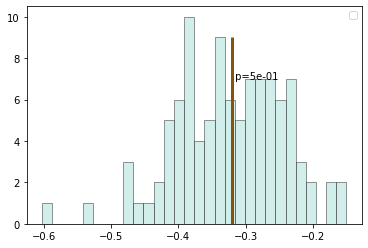

In [43]:
obs = HIQ_dat[0] - LIQ_dat[0]
fig, ax = plt.subplots()
PlotPermutationP(boot_diffs, obs, ax)

In [44]:
def drop_fromList(_list):
    return [" ".join(x.split("_")) for x in _list]

##### pair of bar plot 

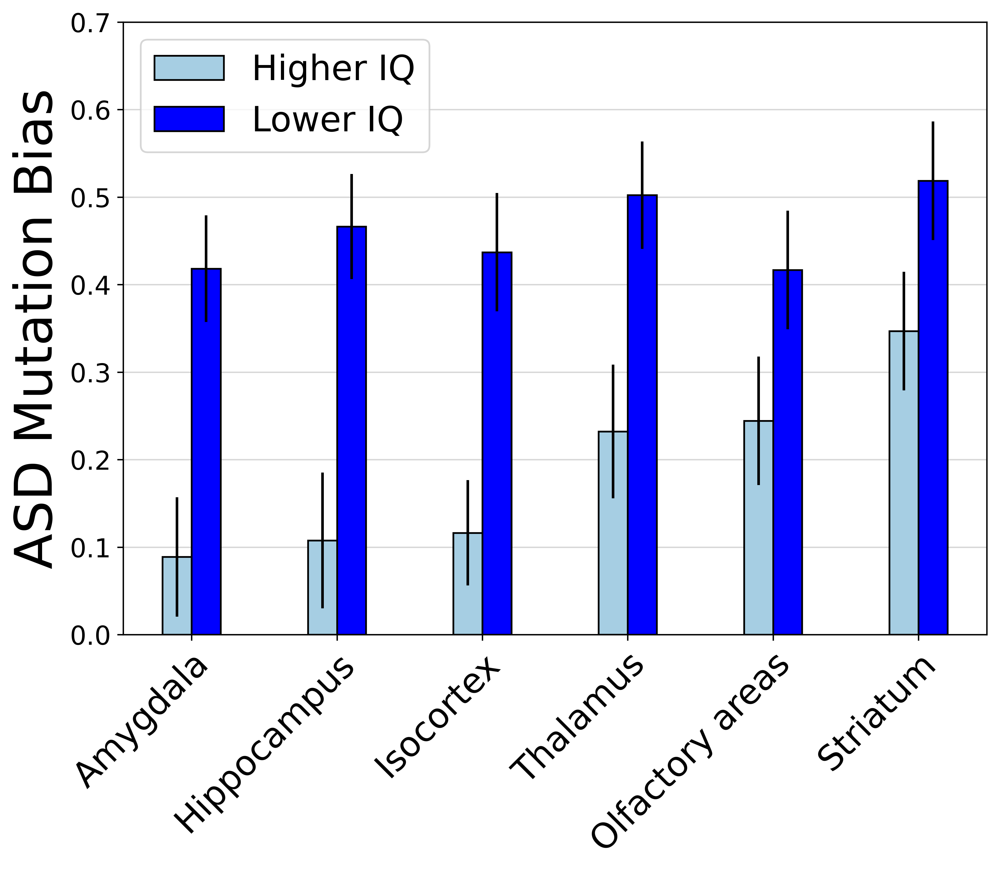

In [57]:
#sort_idx = np.argsort(HIQ_LGD_dat)
#sort_idx = np.arange(7)
sort_idx = np.argsort(HIQ_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480, figsize=(8,7))

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, HIQ_dat[sort_idx], yerr=HIQ_err[sort_idx], color="#a6cee3", width=0.2, label="Higher IQ", 
       edgecolor ='black')
ax.bar(X + 0.1, LIQ_dat[sort_idx], yerr=LIQ_err[sort_idx], color="#0000FF", width=0.2, label="Lower IQ", 
       edgecolor ='black')

#ax.barh(X - 0.1, HIQ_dat[sort_idx], xerr=HIQ_err[sort_idx], height=0.2, color="#a6cee3", label="Higher IQ", 
#       edgecolor ='black')
#ax.barh(X + 0.1, LIQ_dat[sort_idx], xerr=LIQ_err[sort_idx], height=0.2, color="#0000FF", label="Lower IQ", 
#       edgecolor ='black')

ax.set_xlabel('', fontweight ='bold', fontsize = 30)
ax.set_ylabel('ASD Mutation Bias', fontsize = 30)
#plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
#ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", fontsize=20)   

    
plt.tight_layout()
ax.set_ylim(0, 0.7)
plt.yticks(fontsize=15)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

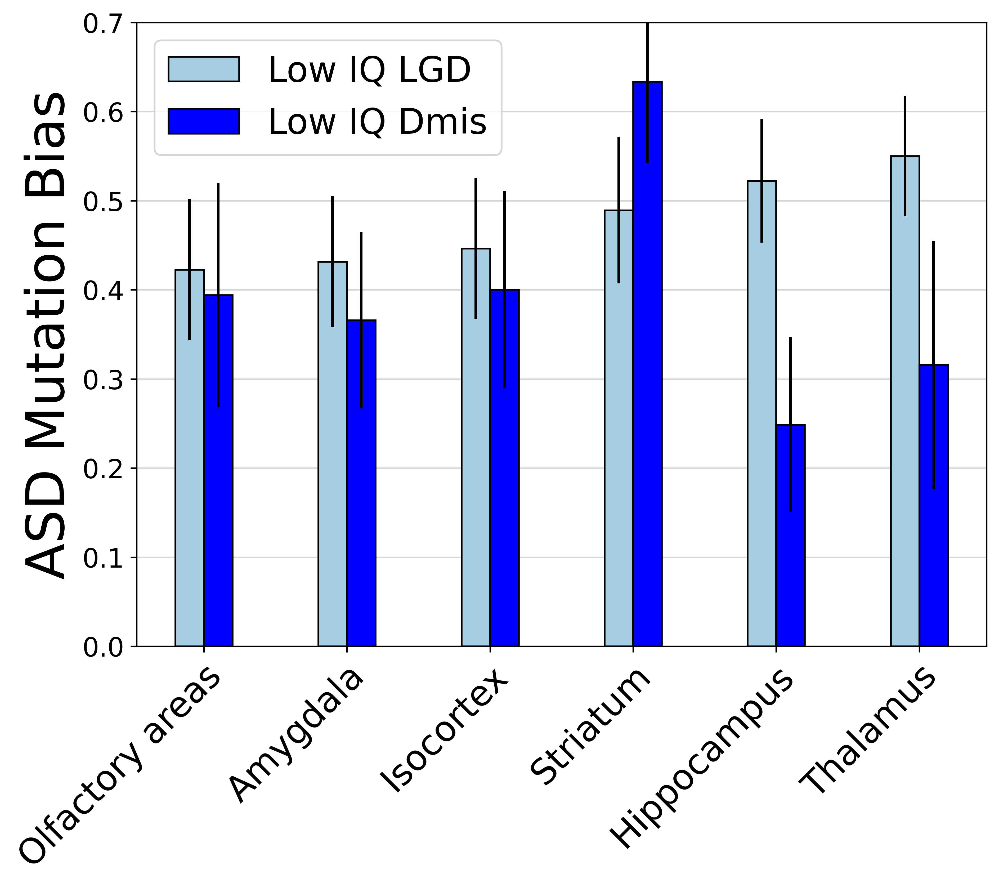

In [64]:
sort_idx = np.argsort(LIQ_LGD_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480, figsize=(8,7))

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, LIQ_LGD_dat[sort_idx], yerr=LIQ_LGD_err[sort_idx], color="#a6cee3", width=0.2, label="Low IQ LGD", 
       edgecolor ='black')
ax.bar(X + 0.1, LIQ_Dmis_dat[sort_idx], yerr=LIQ_Dmis_err[sort_idx], color="#0000FF", width=0.2, label="Low IQ Dmis", 
       edgecolor ='black')

ax.set_xlabel('', fontweight ='bold', fontsize = 30)
ax.set_ylabel('ASD Mutation Bias', fontsize = 30)
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
ax.legend(loc="upper left", fontsize=20)   

plt.tight_layout()
ax.set_ylim(0, 0.7)
plt.yticks(fontsize=15)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

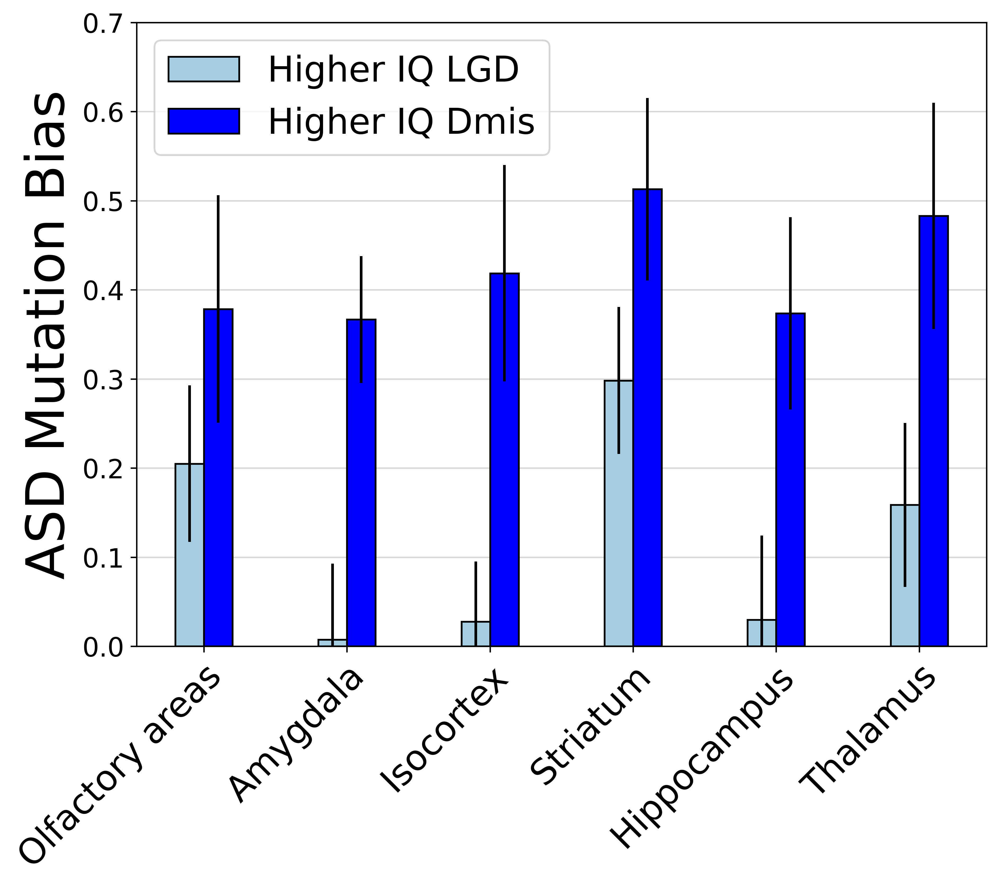

In [66]:
sort_idx = np.argsort(LIQ_LGD_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480, figsize=(8,7))

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, HIQ_LGD_dat[sort_idx], yerr=HIQ_LGD_err[sort_idx], color="#a6cee3", width=0.2, label="Higher IQ LGD", 
       edgecolor ='black')
ax.bar(X + 0.1, HIQ_Dmis_dat[sort_idx], yerr=HIQ_Dmis_err[sort_idx], color="#0000FF", width=0.2, label="Higher IQ Dmis", 
       edgecolor ='black')

ax.set_xlabel('', fontweight ='bold', fontsize = 30)
ax.set_ylabel('ASD Mutation Bias', fontsize = 30)
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
ax.legend(loc="upper left", fontsize=20)   

plt.tight_layout()
ax.set_ylim(0, 0.7)
plt.yticks(fontsize=15)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

##### Plot Difference

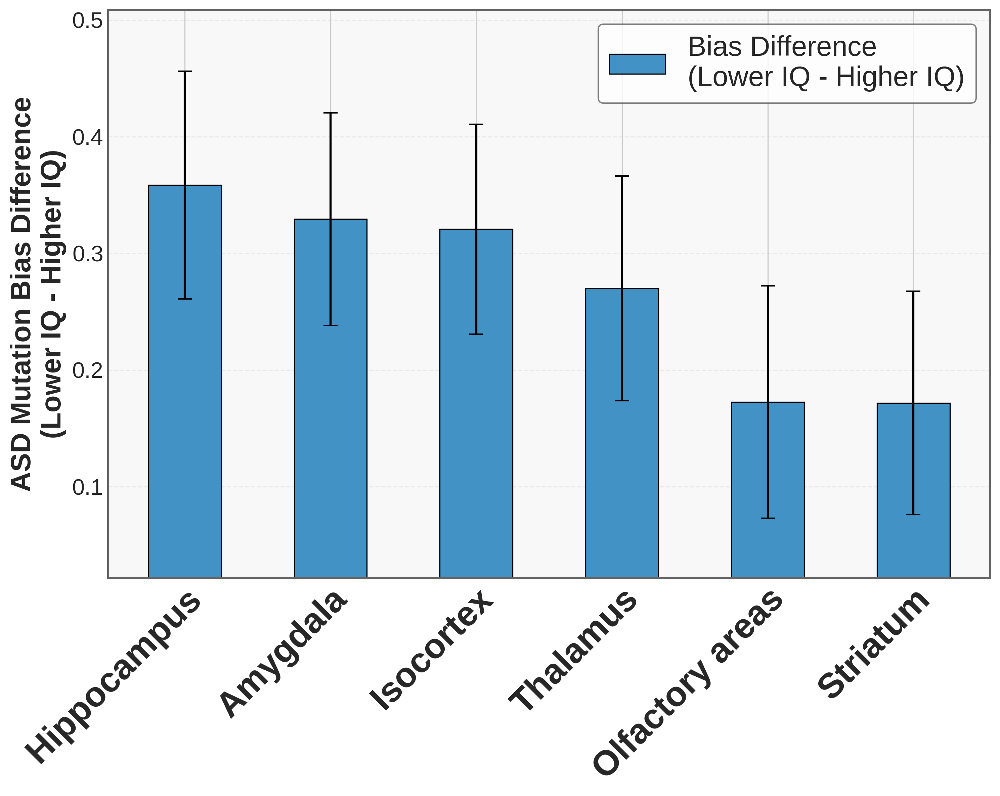

In [85]:
# Calculate bias difference
bias_diff = LIQ_dat - HIQ_dat

# Sort regions by bias difference
sort_idx = np.argsort(bias_diff)[::-1] # sort reversely   
CIR_REGIONS__ = np.array(CIR_REGIONS)

# Set up the figure with a specific style for publication quality
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(dpi=300, figsize=(10, 8))

X = np.arange(len(CIR_REGIONS))

# Plot bias difference with enhanced aesthetics
bars = ax.bar(X, bias_diff[sort_idx], yerr=LIQ_HIQ_Diff_Err[sort_idx],
              color='#4292c6', width=0.5, label="Bias Difference\n(Lower IQ - Higher IQ)",
              edgecolor='black', linewidth=0.8, error_kw=dict(ecolor='black', capsize=5, capthick=1))

# Customize the plot
#ax.set_xlabel('Brain Regions', fontweight='bold', fontsize=16)
ax.set_ylabel('ASD Mutation Bias Difference\n(Lower IQ - Higher IQ)', fontsize=20, fontweight='bold')
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=25, fontweight='bold',ha='right', rotation_mode="anchor")

# Enhance the legend
ax.legend(loc="upper right", fontsize=20, frameon=True, fancybox=True, framealpha=0.8, edgecolor='#636363')

# Adjust layout and aesthetics
plt.tight_layout()
ax.set_ylim(min(bias_diff) - 0.15, max(bias_diff) + 0.15)
plt.yticks(fontsize=16)
ax.grid(True, axis="y", alpha=0.3, linestyle='--')
ax.axhline(y=0, color='#d62728', linestyle='--', linewidth=1.5, alpha=0.8)
ax.set_axisbelow(True)

# Add subtle background color
ax.set_facecolor('#f8f8f8')

# Enhance the spines
for spine in ax.spines.values():
    spine.set_edgecolor('#636363')
    spine.set_linewidth(1.5)

# Save the figure in high resolution
#plt.savefig('ASD_Mutation_Bias_Difference.png', dpi=300, bbox_inches='tight')
#plt.savefig('ASD_Mutation_Bias_Difference.svg', format='svg', bbox_inches='tight')

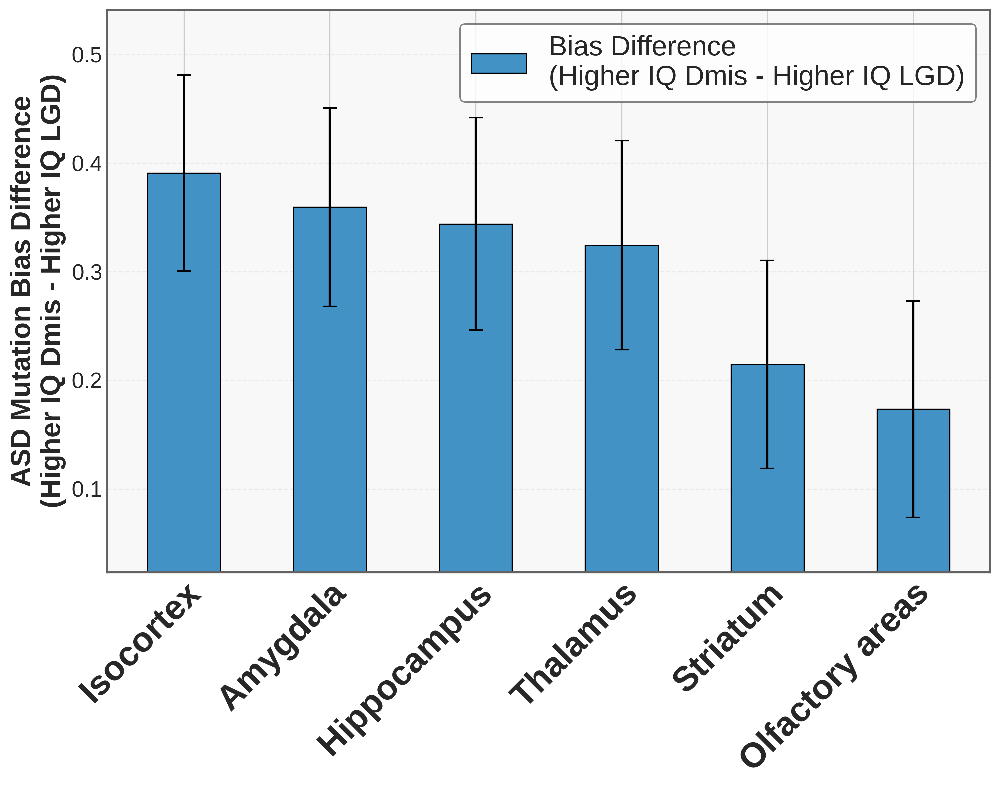

In [86]:
# Calculate bias difference
bias_diff = HIQ_Dmis_dat - HIQ_LGD_dat

# Sort regions by bias difference
sort_idx = np.argsort(bias_diff)[::-1] # sort reversely   
CIR_REGIONS__ = np.array(CIR_REGIONS)

# Set up the figure with a specific style for publication quality
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(dpi=300, figsize=(10, 8))

X = np.arange(len(CIR_REGIONS))

# Plot bias difference with enhanced aesthetics
bars = ax.bar(X, bias_diff[sort_idx], yerr=LIQ_HIQ_Diff_Err[sort_idx],
              color='#4292c6', width=0.5, label="Bias Difference\n(Higher IQ Dmis - Higher IQ LGD)",
              edgecolor='black', linewidth=0.8, error_kw=dict(ecolor='black', capsize=5, capthick=1))

# Customize the plot
#ax.set_xlabel('Brain Regions', fontweight='bold', fontsize=16)
ax.set_ylabel('ASD Mutation Bias Difference\n(Higher IQ Dmis - Higher IQ LGD)', fontsize=20, fontweight='bold')
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=25, fontweight='bold',ha='right', rotation_mode="anchor")

# Enhance the legend
ax.legend(loc="upper right", fontsize=20, frameon=True, fancybox=True, framealpha=0.8, edgecolor='#636363')

# Adjust layout and aesthetics
plt.tight_layout()
ax.set_ylim(min(bias_diff) - 0.15, max(bias_diff) + 0.15)
plt.yticks(fontsize=16)
ax.grid(True, axis="y", alpha=0.3, linestyle='--')
ax.axhline(y=0, color='#d62728', linestyle='--', linewidth=1.5, alpha=0.8)
ax.set_axisbelow(True)

# Add subtle background color
ax.set_facecolor('#f8f8f8')

# Enhance the spines
for spine in ax.spines.values():
    spine.set_edgecolor('#636363')
    spine.set_linewidth(1.5)

# Save the figure in high resolution
#plt.savefig('ASD_Mutation_Bias_Difference.png', dpi=300, bbox_inches='tight')
#plt.savefig('ASD_Mutation_Bias_Difference.svg', format='svg', bbox_inches='tight')

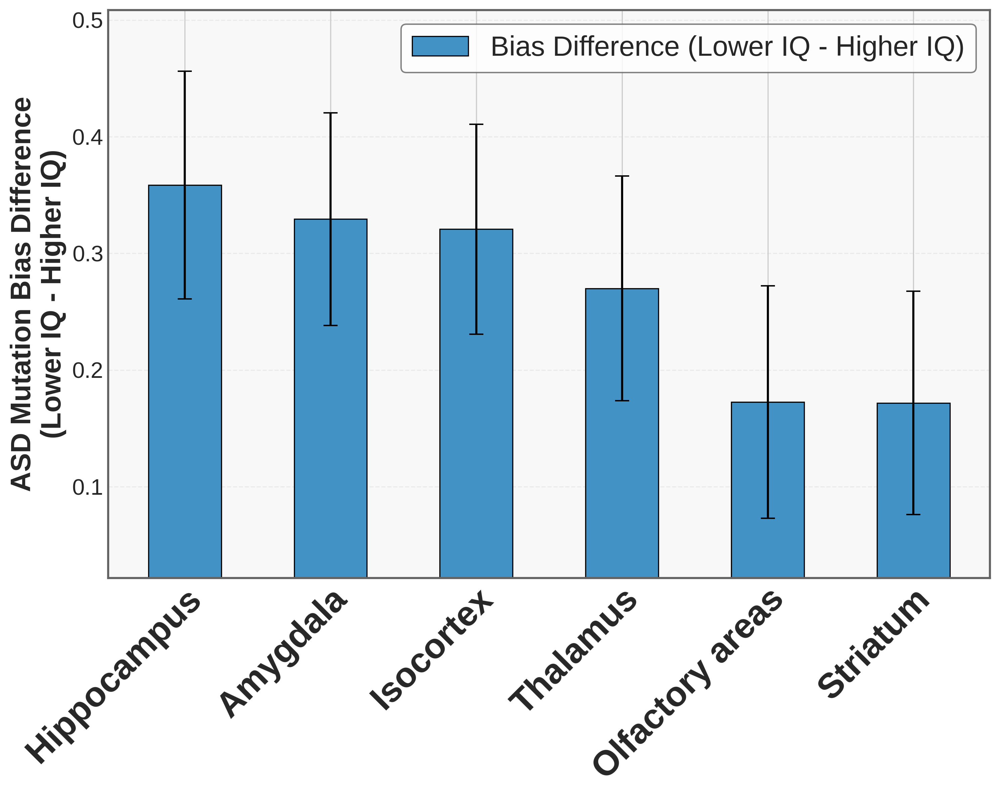

In [87]:
# Calculate bias difference
bias_diff = LIQ_dat - HIQ_dat

# Sort regions by bias difference
sort_idx = np.argsort(bias_diff)[::-1] # sort reversely   
CIR_REGIONS__ = np.array(CIR_REGIONS)

# Set up the figure with a specific style for publication quality
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(dpi=300, figsize=(10, 8))

X = np.arange(len(CIR_REGIONS))

# Plot bias difference with enhanced aesthetics
bars = ax.bar(X, bias_diff[sort_idx], yerr=LIQ_HIQ_Diff_Err[sort_idx],
              color='#4292c6', width=0.5, label="Bias Difference (Lower IQ - Higher IQ)",
              edgecolor='black', linewidth=0.8, error_kw=dict(ecolor='black', capsize=5, capthick=1))

# Customize the plot
#ax.set_xlabel('Brain Regions', fontweight='bold', fontsize=16)
ax.set_ylabel('ASD Mutation Bias Difference\n(Lower IQ - Higher IQ)', fontsize=20, fontweight='bold')
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=25, fontweight='bold',ha='right', rotation_mode="anchor")

# Enhance the legend
ax.legend(loc="upper right", fontsize=20, frameon=True, fancybox=True, framealpha=0.8, edgecolor='#636363')

# Adjust layout and aesthetics
plt.tight_layout()
ax.set_ylim(min(bias_diff) - 0.15, max(bias_diff) + 0.15)
plt.yticks(fontsize=16)
ax.grid(True, axis="y", alpha=0.3, linestyle='--')
ax.axhline(y=0, color='#d62728', linestyle='--', linewidth=1.5, alpha=0.8)
ax.set_axisbelow(True)

# Add subtle background color
ax.set_facecolor('#f8f8f8')

# Enhance the spines
for spine in ax.spines.values():
    spine.set_edgecolor('#636363')
    spine.set_linewidth(1.5)

# Save the figure in high resolution
#plt.savefig('ASD_Mutation_Bias_Difference.png', dpi=300, bbox_inches='tight')
#plt.savefig('ASD_Mutation_Bias_Difference.svg', format='svg', bbox_inches='tight')

In [89]:
CIR_REGIONS

['Isocortex',
 'Hippocampus',
 'Amygdala',
 'Striatum',
 'Thalamus',
 'Olfactory_areas']

In [88]:
print("hello")

hello


##### ANNOVAR Test

In [55]:
HIQ_dat_anova = []
for REG in CIR_REGIONS:
    HIQ_dat_anova.append(HIQ_Cir[HIQ_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway, kruskal
print(f_oneway(HIQ_dat_anova[0], HIQ_dat_anova[1], HIQ_dat_anova[2], 
        HIQ_dat_anova[3], HIQ_dat_anova[4], HIQ_dat_anova[5]))
print(kruskal(HIQ_dat_anova[0], HIQ_dat_anova[1], HIQ_dat_anova[2], 
        HIQ_dat_anova[3], HIQ_dat_anova[4], HIQ_dat_anova[5]))

F_onewayResult(statistic=2.8573978323352307, pvalue=0.0279783185495005)
KruskalResult(statistic=11.247162568153982, pvalue=0.04669381982485061)


In [56]:
LIQ_dat_anova = []
for REG in CIR_REGIONS:
    LIQ_dat_anova.append(LIQ_Cir[LIQ_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway
print(f_oneway(LIQ_dat_anova[0], LIQ_dat_anova[1], LIQ_dat_anova[2], 
        LIQ_dat_anova[3], LIQ_dat_anova[4], LIQ_dat_anova[5]))
print(kruskal(LIQ_dat_anova[0], LIQ_dat_anova[1], LIQ_dat_anova[2], 
        LIQ_dat_anova[3], LIQ_dat_anova[4], LIQ_dat_anova[5]))

F_onewayResult(statistic=1.0197486211024747, pvalue=0.42012587519636907)
KruskalResult(statistic=5.894041393123388, pvalue=0.3166660952151609)


In [23]:
HIQ_dat_anova

[array([ 0.24782304,  0.15865051,  0.26991403,  0.18516601,  0.08732398,
         0.06725286,  0.19846351,  0.17402976,  0.10921931,  0.06919921,
         0.06575802,  0.13434821,  0.00052096,  0.17184373,  0.15047531,
         0.04691949,  0.11717702, -0.09856191,  0.05567412]),
 array([ 0.3758251 ,  0.2194565 , -0.03236716,  0.01427378, -0.0140952 ,
         0.08341388]),
 array([-0.04442759,  0.33894567,  0.19855728, -0.13758978]),
 array([0.3507654 , 0.21509768, 0.47493207]),
 array([0.32123845, 0.16876855, 0.23485422, 0.11758508, 0.19533041,
        0.30782785, 0.32665317, 0.18558415]),
 array([0.5287406 , 0.01619799, 0.18792775])]

#### MWU Test

In [24]:
HIQ_Muts.head(3)

,Cohort,FamID,IID,Sex,Pheno,DNASource,VarID,Chrom,Position,Ref,...,pExt_HBDR,HGNCv24,DS_AG,DS_AL,DS_DG,DS_DL,DP_AG,DP_AL,DP_DG,DP_DL
117,ASC,214-17040,08C77167,Male,Affected,CL,17:60650729:G:GT,17,60650729,G,...,1,TLK2,.,.,.,.,.,.,.,.
118,ASC,211-5221,08C74145,Male,Affected,CL,14:21865980:A:T,14,21865980,A,...,1,CHD8,0.0001,0,0.1121,0.9986,-8,41,-8,2
122,ASC,215-13132,08C77155,Male,Affected,CL,16:30727385:A:G,16,30727385,A,...,1,SRCAP,0.542,0.9822,0.0001,0.0001,10,2,34,2


In [25]:
CIR_REGIONS_Dict["Isocortex"] + CIR_REGIONS_Dict["Hippocampus"] + CIR_REGIONS_Dict["Amygdalar"]
CIR_REGIONS_Dict["Striatum"] + CIR_REGIONS_Dict["Thalamus"] + CIR_REGIONS_Dict["Olfactory_areas"]

['Nucleus_accumbens',
 'Caudoputamen',
 'Lateral_septal_nucleus_rostral_rostroventral_part',
 'Parafascicular_nucleus',
 'Nucleus_of_reuniens',
 'Lateral_posterior_nucleus_of_the_thalamus',
 'Rhomboid_nucleus',
 'Submedial_nucleus_of_the_thalamus',
 'Parataenial_nucleus',
 'Mediodorsal_nucleus_of_thalamus',
 'Anteromedial_nucleus_dorsal_part',
 'Anterior_olfactory_nucleus',
 'Dorsal_peduncular_area',
 'Piriform_area']

In [26]:
Group1 = CIR_REGIONS_Dict["Isocortex"] + CIR_REGIONS_Dict["Hippocampus"] + CIR_REGIONS_Dict["Amygdalar"]
Group2 = CIR_REGIONS_Dict["Striatum"] + CIR_REGIONS_Dict["Thalamus"] + CIR_REGIONS_Dict["Olfactory_areas"]
dat1, dat2 = [], []
for i, row in HIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)


Statistics=1789.000, p=0.008


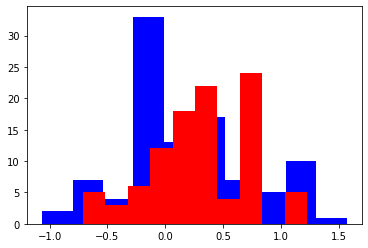

In [27]:
plt.hist(dat1, color="blue")
plt.hist(dat2, color="red")
stat, p = wilcoxon(dat1, dat2, alternative="less")
print('Statistics=%.3f, p=%.3f' % (stat, p))

Statistics=3942.000, p=0.009


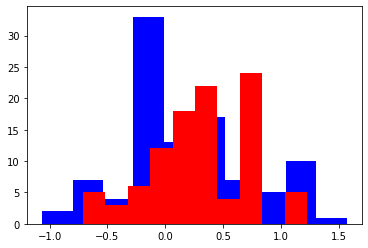

In [28]:
plt.hist(dat1, color="blue")
plt.hist(dat2, color="red")
stat, p = mannwhitneyu(dat1, dat2, alternative="less")
print('Statistics=%.3f, p=%.3f' % (stat, p))

In [84]:
print(CIR_REGIONS)

['Isocortex', 'Hippocampus', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']


In [119]:
# Test per mutation bias
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
dat1 = np.array(dat1)
dat2 = np.array(dat2)

/tmp/ipykernel_18288/3467758559.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  dat1 = np.array(dat1)


In [120]:
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))

KruskalResult(statistic=21.03294946438137, pvalue=0.0007985301038106124)
KruskalResult(statistic=7.706599495456001, pvalue=0.17316404525017376)


In [123]:
"%.3e"%(0.0007985301038106124)

'7.985e-04'

In [94]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG)
    print(mannwhitneyu(dat1[i], np.concatenate(dat1)))

Isocortex
MannwhitneyuResult(statistic=3923621.5, pvalue=0.21083161684765384)
Hippocampus
MannwhitneyuResult(statistic=1224769.0, pvalue=0.21601670601520706)
Amygdalar
MannwhitneyuResult(statistic=815606.0, pvalue=0.2860270096557328)
Striatum
MannwhitneyuResult(statistic=705898.5, pvalue=0.0007633664472451315)
Thalamus
MannwhitneyuResult(statistic=1750596.0, pvalue=0.08526346775141226)
Olfactory_areas
MannwhitneyuResult(statistic=640533.5, pvalue=0.7024607801260149)


In [93]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG)
    print(mannwhitneyu(dat2[i], np.concatenate(dat2)))

Isocortex
MannwhitneyuResult(statistic=27349.5, pvalue=0.26558874072810357)
Hippocampus
MannwhitneyuResult(statistic=28647.5, pvalue=0.6822364050196335)
Amygdalar
MannwhitneyuResult(statistic=27835.5, pvalue=0.3954719453402451)
Striatum
MannwhitneyuResult(statistic=33236.5, pvalue=0.03766167930225369)
Thalamus
MannwhitneyuResult(statistic=30111.5, pvalue=0.7010328405322561)
Olfactory_areas
MannwhitneyuResult(statistic=29237.5, pvalue=0.9287048798367032)


In [115]:
# HIQ LGD
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        if row["GeneEff"] != "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
dat1 = np.array(dat1)
dat2 = np.array(dat2)

/tmp/ipykernel_18288/772485795.py:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  dat1 = np.array(dat1)


In [116]:
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))

KruskalResult(statistic=5.0881986719883985, pvalue=0.4052114863537256)
KruskalResult(statistic=1.4921237613159268, pvalue=0.9139769368317682)


In [96]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG)
    print(mannwhitneyu(dat1[i], np.concatenate(dat1)))

Isocortex
MannwhitneyuResult(statistic=478613.0, pvalue=0.6201004577373355)
Hippocampus
MannwhitneyuResult(statistic=142071.0, pvalue=0.2732254936167958)
Amygdalar
MannwhitneyuResult(statistic=94046.0, pvalue=0.2968667534067547)
Striatum
MannwhitneyuResult(statistic=80196.0, pvalue=0.20144906769307624)
Thalamus
MannwhitneyuResult(statistic=201503.0, pvalue=0.7246964483287293)
Olfactory_areas
MannwhitneyuResult(statistic=72293.0, pvalue=0.6069740184108448)


In [117]:
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        if row["GeneEff"] == "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
dat1 = np.array(dat1)
dat2 = np.array(dat2)

/tmp/ipykernel_18288/1659348752.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  dat1 = np.array(dat1)


In [118]:
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))

KruskalResult(statistic=21.117311043980035, pvalue=0.000769742482905869)
KruskalResult(statistic=7.159263794864997, pvalue=0.20906256994510472)


In [101]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG)
    print(mannwhitneyu(dat1[i], np.concatenate(dat1), alternative="less"))

Isocortex
MannwhitneyuResult(statistic=1666785.5, pvalue=0.04124913502113916)
Hippocampus
MannwhitneyuResult(statistic=531177.0, pvalue=0.20782678566204527)
Amygdalar
MannwhitneyuResult(statistic=352290.0, pvalue=0.20811881639922036)
Striatum
MannwhitneyuResult(statistic=308666.5, pvalue=0.9990387988604434)
Thalamus
MannwhitneyuResult(statistic=764180.0, pvalue=0.9692745456359034)
Olfactory_areas
MannwhitneyuResult(statistic=282913.5, pvalue=0.8139167941405296)


In [104]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG)
    print(mannwhitneyu(dat2[i], np.concatenate(dat2), alternative="greater"))

Isocortex
MannwhitneyuResult(statistic=11548.5, pvalue=0.8745845953324727)
Hippocampus
MannwhitneyuResult(statistic=12197.5, pvalue=0.6868879802553773)
Amygdalar
MannwhitneyuResult(statistic=11826.5, pvalue=0.8065001727825402)
Striatum
MannwhitneyuResult(statistic=14553.5, pvalue=0.027838842757735557)
Thalamus
MannwhitneyuResult(statistic=12926.5, pvalue=0.3990714205159501)
Olfactory_areas
MannwhitneyuResult(statistic=12997.5, pvalue=0.3714197815989681)


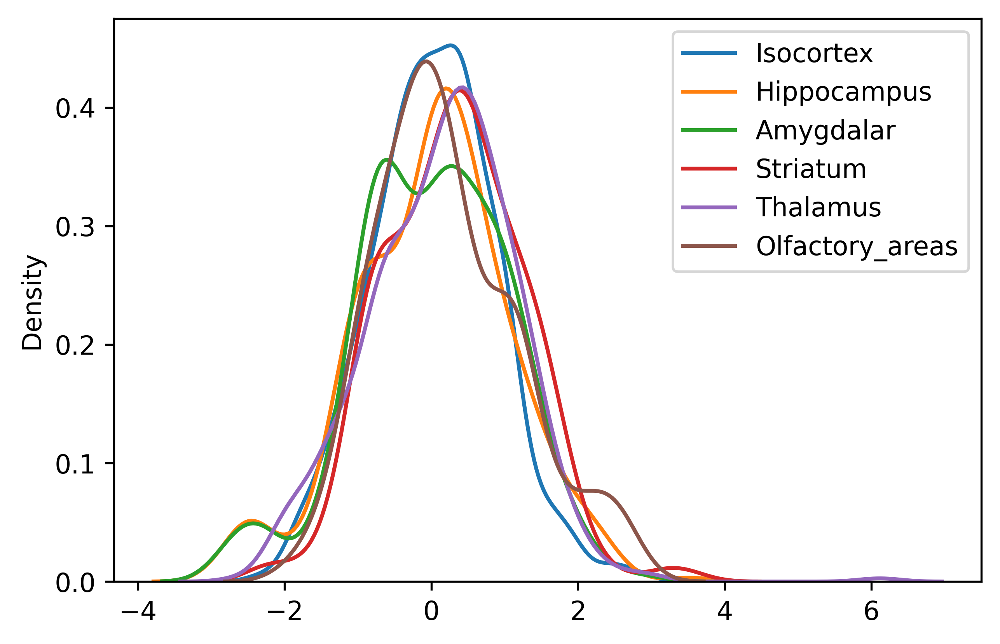

In [109]:
plt.figure(dpi=480)
for i, REG in enumerate(CIR_REGIONS):
    sns.kdeplot(dat1[i], label=REG)
plt.legend()

In [ ]:
plt.figure(dpi=120)
for g in Drd.index.values:
    #plt.hist(ExpL.loc[g, :], bins=20, alpha=0.5, label=Drd.loc[g, "Symbol"])
    #sns.distplot(ExpL.loc[g, :], hist=False, kde=True, label=Drd.loc[g, "Symbol"])
    sns.kdeplot(ExpL.loc[g, :], label=Drd.loc[g, "Symbol"])
    print(Drd.loc[g, "Symbol"], round(ExpL.loc[g, :].mean(), 3), )
plt.legend()

In [99]:
0.05/6

0.008333333333333333

In [29]:
Group1 = CIR_REGIONS_Dict["Isocortex"] + CIR_REGIONS_Dict["Hippocampus"] + CIR_REGIONS_Dict["Amygdalar"]
Group2 = CIR_REGIONS_Dict["Striatum"] + CIR_REGIONS_Dict["Thalamus"] + CIR_REGIONS_Dict["Olfactory_areas"]
dat1, dat2 = [], []
for i, row in LIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)

Statistics=3217.000, p=0.175


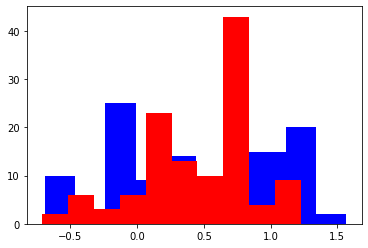

In [30]:
plt.hist(dat1, color="blue")
plt.hist(dat2, color="red")
stat, p = wilcoxon(dat1, dat2, alternative="less")
print('Statistics=%.3f, p=%.3f' % (stat, p))

In [31]:
CIR_REGIONS_Dict["Amygdalar"]

['Lateral_amygdalar_nucleus',
 'Basomedial_amygdalar_nucleus',
 'Basolateral_amygdalar_nucleus',
 'Bed_nuclei_of_the_stria_terminalis']

Statistics=3786.000, p=0.283


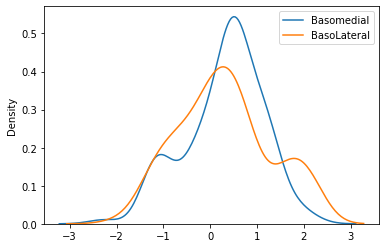

In [32]:
Group1 = "Basomedial_amygdalar_nucleus"
Group2 = "Basolateral_amygdalar_nucleus"
dat1, dat2 = [], []
for i, row in LIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)
#plt.hist(dat1, color="blue")
#plt.hist(dat2, color="red")
sns.kdeplot(dat1, label="Basomedial")
sns.kdeplot(dat2, label="BasoLateral")
plt.legend()
stat, p = wilcoxon(dat1, dat2, alternative="greater")
print('Statistics=%.3f, p=%.3f' % (stat, p))

Statistics=3279.000, p=0.003


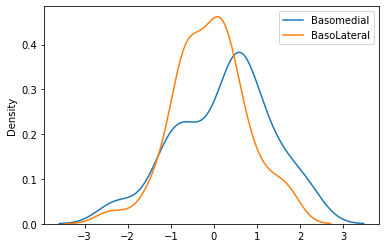

In [33]:
Group1 = "Basomedial_amygdalar_nucleus"
Group2 = "Basolateral_amygdalar_nucleus"
dat1, dat2 = [], []
for i, row in HIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)
sns.kdeplot(dat1, label="Basomedial")
sns.kdeplot(dat2, label="BasoLateral")
plt.legend()
stat, p = wilcoxon(dat1, dat2, alternative="greater")
print('Statistics=%.3f, p=%.3f' % (stat, p))

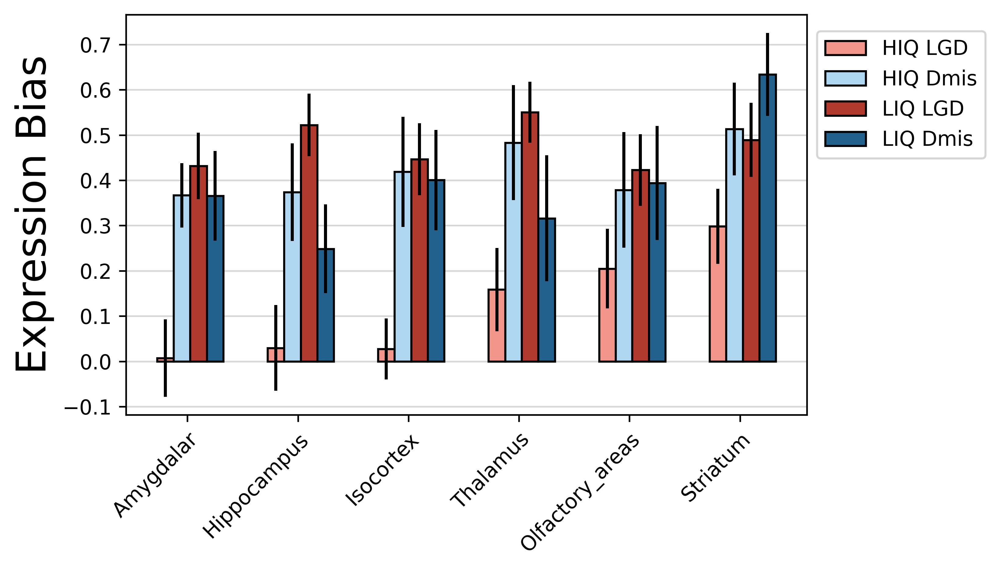

In [34]:
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_LGD_dat[sort_idx], yerr=HIQ_LGD_err[sort_idx], color="#F1948A", width=0.15, label="HIQ LGD", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Dmis_dat[sort_idx], yerr=HIQ_Dmis_err[sort_idx], color="#AED6F1", width=0.15, label="HIQ Dmis", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_LGD_dat[sort_idx], yerr=LIQ_LGD_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ LGD", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Dmis_dat[sort_idx], yerr=LIQ_Dmis_err[sort_idx], color="#21618C", width=0.15, label="LIQ Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

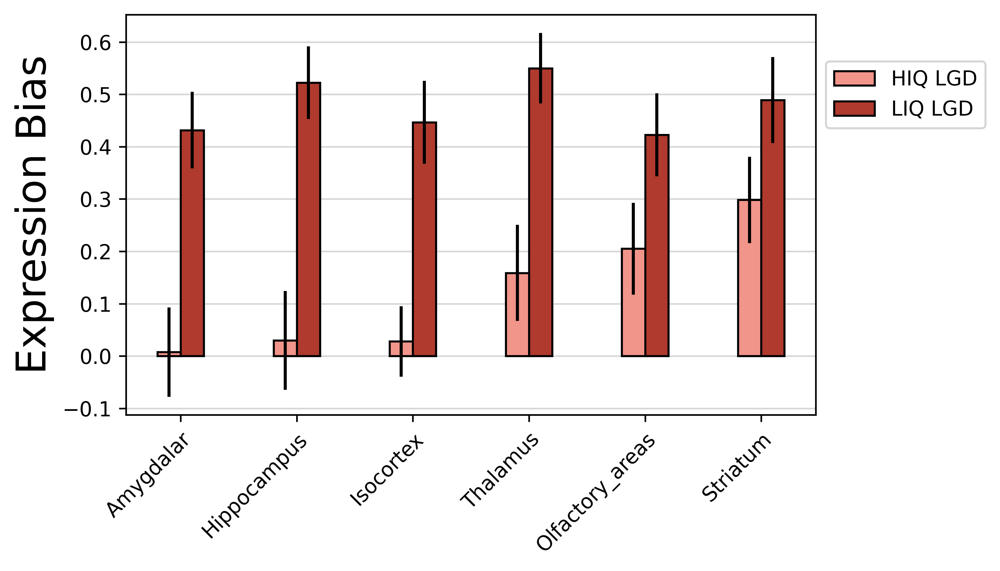

In [35]:

CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, HIQ_LGD_dat[sort_idx], yerr=HIQ_LGD_err[sort_idx], color="#F1948A", width=0.2, label="HIQ LGD", 
       edgecolor ='black')
#ax.bar(X - 0.05, HIQ_Dmis_dat[sort_idx], yerr=HIQ_Dmis_err[sort_idx], color="#AED6F1", width=0.15, label="HIQ Dmis", 
#   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_LGD_dat[sort_idx], yerr=LIQ_LGD_err[sort_idx], color="#B03A2E", width=0.2, label="LIQ LGD", 
       edgecolor ='black')
#ax.bar(X + 0.25, LIQ_Dmis_dat[sort_idx], yerr=LIQ_Dmis_err[sort_idx], color="#21618C", width=0.15, label="LIQ Dmis", 
#   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

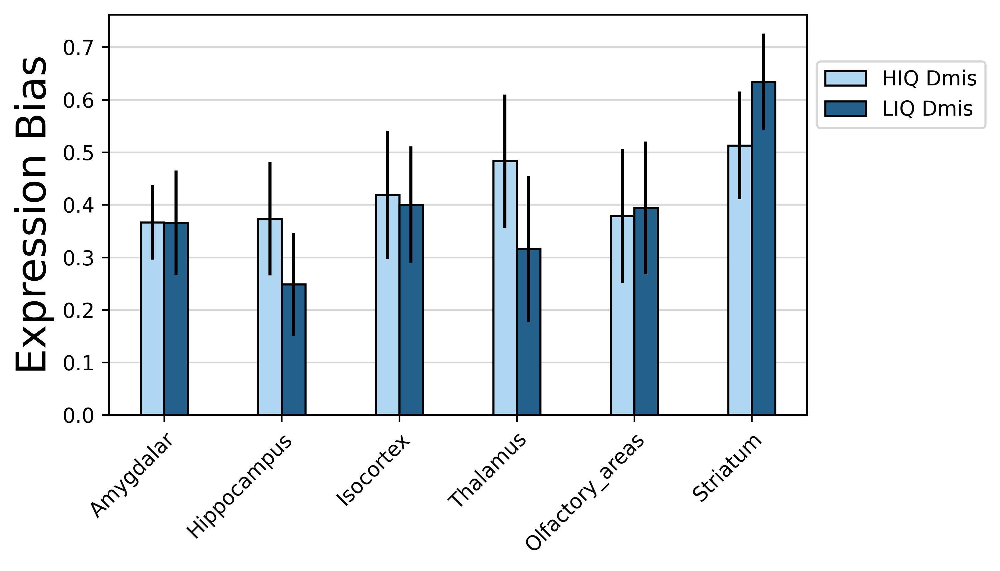

In [36]:
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

#ax.bar(X - 0.2, HIQ_LGD_dat[sort_idx], yerr=HIQ_LGD_err[sort_idx], color="#F1948A", width=0.15, label="HIQ LGD", 
#       edgecolor ='black')
ax.bar(X - 0.1, HIQ_Dmis_dat[sort_idx], yerr=HIQ_Dmis_err[sort_idx], color="#AED6F1", width=0.2, label="HigherIQ Dmis", 
   edgecolor ='black', hatch="")

#ax.bar(X + 0.1, LIQ_LGD_dat[sort_idx], yerr=LIQ_LGD_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ LGD", 
#       edgecolor ='black')
ax.bar(X + 0.1, LIQ_Dmis_dat[sort_idx], yerr=LIQ_Dmis_err[sort_idx], color="#21618C", width=0.2, label="LIQ Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

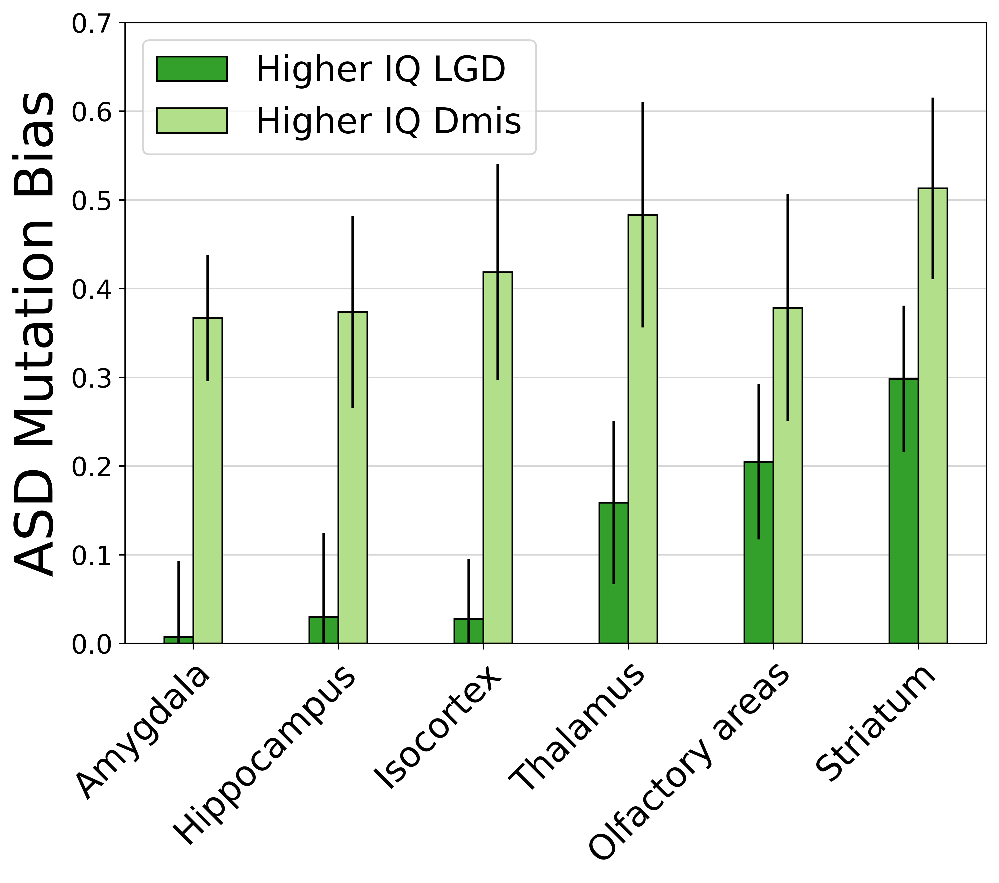

In [109]:
# Plot Only High IQ

CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480, figsize=(8,7))

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, HIQ_LGD_dat[sort_idx], yerr=HIQ_LGD_err[sort_idx], color="#33a02c", width=0.2, label="Higher IQ LGD ", 
       edgecolor ='black')
ax.bar(X + 0.1, HIQ_Dmis_dat[sort_idx], yerr=HIQ_Dmis_err[sort_idx], color="#b2df8a", width=0.2, label="Higher IQ Dmis", 
   edgecolor ='black', hatch="")

#ax.barh(X - 0.1, HIQ_LGD_dat[sort_idx], xerr=HIQ_LGD_err[sort_idx], height=0.2, color="#33a02c", label="LGD", 
#       edgecolor ='black')
#ax.barh(X + 0.1, HIQ_Dmis_dat[sort_idx], xerr=HIQ_Dmis_err[sort_idx], height=0.2, color="#b2df8a", label="Dmis", 
#       edgecolor ='black')


ax.set_xlabel('', fontweight ='bold', fontsize = 30)
ax.set_ylabel('ASD Mutation Bias', fontsize = 30)
plt.xticks(X, drop_fromList(CIR_REGIONS__[sort_idx]), rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
  
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
#ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", fontsize=20)   
    
plt.tight_layout()
ax.set_ylim(0, 0.7)
plt.yticks(fontsize=15)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

In [74]:
print(CIR_REGIONS)

['Isocortex', 'Hippocampus', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']


In [ ]:
print(mannwhitneyu(HIQ_dat_anova[3], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))
print(mannwhitneyu(HIQ_LGD_dat_anova[4], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))
print(mannwhitneyu(HIQ_LGD_dat_anova[5], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))

In [81]:
print(mannwhitneyu(HIQ_LGD_dat_anova[3], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))
print(mannwhitneyu(HIQ_LGD_dat_anova[4], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))
print(mannwhitneyu(HIQ_LGD_dat_anova[5], np.concatenate(HIQ_LGD_dat_anova), alternative="greater"))

MannwhitneyuResult(statistic=105.5, pvalue=0.03577686315282752)
MannwhitneyuResult(statistic=228.0, pvalue=0.0752534605361402)
MannwhitneyuResult(statistic=81.5, pvalue=0.23143579064904657)


In [82]:
HIQ_LGD_dat_anova[5]

array([ 0.52205925, -0.06710758,  0.15990206])

In [57]:
HIQ_LGD_dat_anova = []
for REG in CIR_REGIONS:
    HIQ_LGD_dat_anova.append(HIQ_LGD_Cir[HIQ_LGD_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway, kruskal
print(f_oneway(HIQ_LGD_dat_anova[0], HIQ_LGD_dat_anova[1], HIQ_LGD_dat_anova[2], 
        HIQ_LGD_dat_anova[3], HIQ_LGD_dat_anova[4], HIQ_LGD_dat_anova[5]))
print(kruskal(HIQ_LGD_dat_anova[0], HIQ_LGD_dat_anova[1], HIQ_LGD_dat_anova[2], 
        HIQ_LGD_dat_anova[3], HIQ_LGD_dat_anova[4], HIQ_LGD_dat_anova[5]))

F_onewayResult(statistic=2.667673214576594, pvalue=0.03714353566547273)
KruskalResult(statistic=9.529987760097896, pvalue=0.08970233034145236)


In [58]:
HIQ_Dmis_dat_anova = []
for REG in CIR_REGIONS:
    HIQ_Dmis_dat_anova.append(HIQ_Dmis_Cir[HIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway
print(f_oneway(HIQ_Dmis_dat_anova[0], HIQ_Dmis_dat_anova[1], HIQ_Dmis_dat_anova[2], 
        HIQ_Dmis_dat_anova[3], HIQ_Dmis_dat_anova[4], HIQ_Dmis_dat_anova[5]))
print(kruskal(HIQ_Dmis_dat_anova[0], HIQ_Dmis_dat_anova[1], HIQ_Dmis_dat_anova[2], 
        HIQ_Dmis_dat_anova[3], HIQ_Dmis_dat_anova[4], HIQ_Dmis_dat_anova[5]))

F_onewayResult(statistic=0.9989326773058372, pvalue=0.4319300792492624)
KruskalResult(statistic=4.471542227662184, pvalue=0.48369999610110226)


In [40]:
HIQ_Muts.columns.values

array(['Cohort', 'FamID', 'IID', 'Sex', 'Pheno', 'DNASource', 'VarID',
       'Chrom', 'Position', 'Ref', 'Alt', 'Context', 'GeneID', 'HGNC',
       'ExACpLI', 'LOEUFbin', 'Arisk', 'GeneEff', 'TransCount',
       'TransIDs', 'TransEffs', 'cDNAChg', 'CodonChg', 'AAChg', 'REVEL',
       'MPC', 'PrimateAI', 'CADD13', 'ExAC_ALL', 'gnomADexome_ALL', 'LoF',
       'LoF_filter', 'LoF_flags', 'pExt_GTExBrain', 'pExt_HBDR',
       'HGNCv24', 'DS_AG', 'DS_AL', 'DS_DG', 'DS_DL', 'DP_AG', 'DP_AL',
       'DP_DG', 'DP_DL'], dtype=object)

In [41]:
dat1, dat2 = [], []
for i, row in HIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    if row["GeneEff"] == "missense":
        continue
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)

Statistics=1445.000, p=0.993


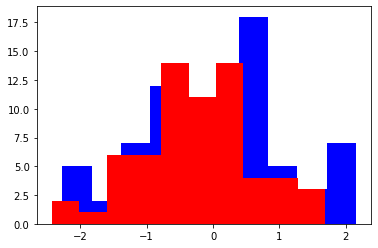

In [42]:
plt.hist(dat1, color="blue")
plt.hist(dat2, color="red")
stat, p = wilcoxon(dat1, dat2, alternative="less")
print('Statistics=%.3f, p=%.3f' % (stat, p))

In [43]:
dat1, dat2 = [], []
for i, row in HIQ_Muts.iterrows():
    Symbol = row["HGNC"]
    if row["GeneEff"] != "missense":
        continue
    Entrez = GeneSymbol2Entrez.get(Symbol, -1)
    if Entrez not in ExpZ2Mat.index.values:
        continue
    g1 = ExpZ2Mat.loc[Entrez, Group1].mean()
    g2 = ExpZ2Mat.loc[Entrez, Group2].mean()
    dat1.append(g1)
    dat2.append(g2)

Statistics=374.000, p=0.905


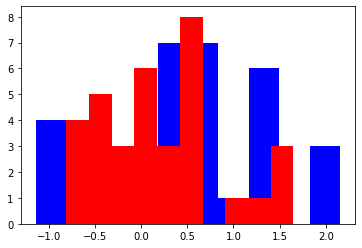

In [44]:
plt.hist(dat1, color="blue")
plt.hist(dat2, color="red")
stat, p = wilcoxon(dat1, dat2, alternative="less")
print('Statistics=%.3f, p=%.3f' % (stat, p))

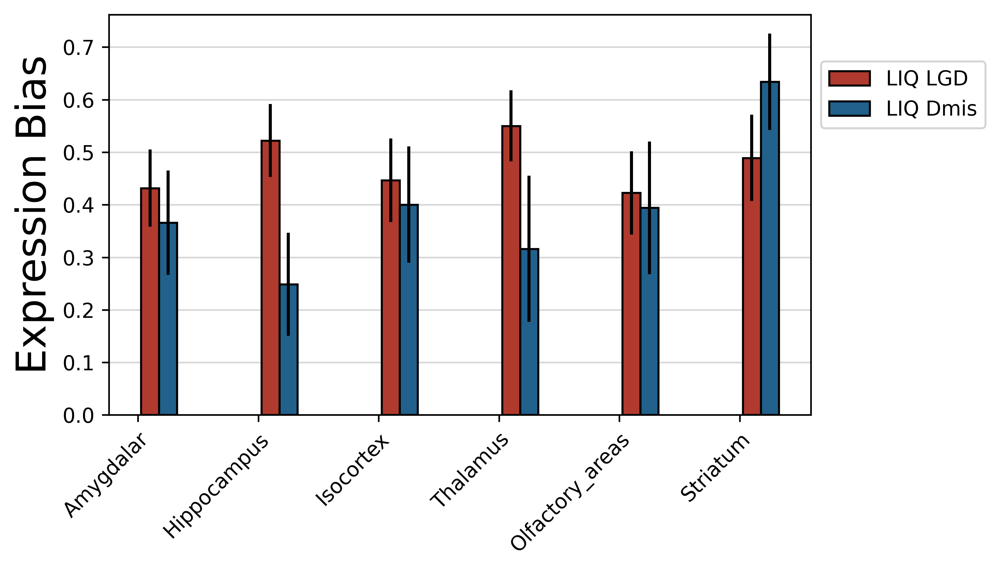

In [45]:
# Plot Only Low IQ
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))


ax.bar(X + 0.1, LIQ_LGD_dat[sort_idx], yerr=LIQ_LGD_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ LGD", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Dmis_dat[sort_idx], yerr=LIQ_Dmis_err[sort_idx], color="#21618C", width=0.15, label="LIQ Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

In [52]:
LIQ_LGD_dat_anova = []
for REG in CIR_REGIONS:
    LIQ_LGD_dat_anova.append(LIQ_LGD_Cir[LIQ_LGD_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway, kruskal
print(f_oneway(LIQ_LGD_dat_anova[0], LIQ_LGD_dat_anova[1], LIQ_LGD_dat_anova[2], 
        LIQ_LGD_dat_anova[3], LIQ_LGD_dat_anova[4], LIQ_LGD_dat_anova[5]))
print(kruskal(LIQ_LGD_dat_anova[0], LIQ_LGD_dat_anova[1], LIQ_LGD_dat_anova[2], 
        LIQ_LGD_dat_anova[3], LIQ_LGD_dat_anova[4], LIQ_LGD_dat_anova[5]))

F_onewayResult(statistic=1.3568163784498348, pvalue=0.26277072080040814)
KruskalResult(statistic=6.842578168465536, pvalue=0.23261370451844546)


In [54]:
LIQ_Dmis_dat_anova = []
for REG in CIR_REGIONS:
    LIQ_Dmis_dat_anova.append(LIQ_Dmis_Cir[LIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].values)
from scipy.stats import f_oneway
print(f_oneway(LIQ_Dmis_dat_anova[0], LIQ_Dmis_dat_anova[1], LIQ_Dmis_dat_anova[2], 
        LIQ_Dmis_dat_anova[3], LIQ_Dmis_dat_anova[4], LIQ_Dmis_dat_anova[5]))
print(kruskal(LIQ_Dmis_dat_anova[0], LIQ_Dmis_dat_anova[1], LIQ_Dmis_dat_anova[2], 
        LIQ_Dmis_dat_anova[3], LIQ_Dmis_dat_anova[4], LIQ_Dmis_dat_anova[5]))

F_onewayResult(statistic=4.4561334302726445, pvalue=0.0028126645254942964)
KruskalResult(statistic=13.751029264493155, pvalue=0.01727070268206855)


In [49]:
f_oneway(LIQ_Dmis_dat_anova[0], LIQ_Dmis_dat_anova[1], LIQ_Dmis_dat_anova[2], 
        LIQ_Dmis_dat_anova[4], LIQ_Dmis_dat_anova[5])

F_onewayResult(statistic=2.027259053630246, pvalue=0.11191518335168057)

[0.49137399 0.47308229 0.41323474 0.55947607 0.51042081 0.37429976
 0.49478908 0.1809664  0.35355931 0.38065859 0.51925124 0.30907893
 0.31083984 0.22533763 0.33176787 0.42352803 0.42060892 0.32543841
 0.51027903 0.23110643 0.23643134 0.441155   0.24261646 0.22370671
 0.11770589 0.30229072 0.58340939 0.29146966 0.28633431 0.75815812
 0.53189148 0.6113749  0.27579353 0.5623945  0.0404887  0.34455858
 0.30982661 0.56233391 0.21404976 0.21934419 0.37833478 0.3870127
 0.4169413 ]
KstestResult(statistic=0.5252913980209866, pvalue=1.3972675190930838e-11)


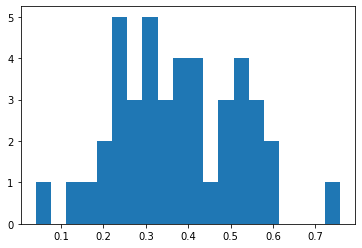

In [73]:
tmp = np.concatenate(LIQ_Dmis_dat_anova)
print(tmp)
plt.hist(tmp, bins=20)
print(scipy.stats.kstest(tmp, 'norm'))

In [83]:
print(mannwhitneyu(LIQ_Dmis_dat_anova[3], np.concatenate(LIQ_Dmis_dat_anova), alternative="greater"))
print(mannwhitneyu(LIQ_Dmis_dat_anova[4], np.concatenate(LIQ_Dmis_dat_anova), alternative="greater"))
print(mannwhitneyu(LIQ_Dmis_dat_anova[5], np.concatenate(LIQ_Dmis_dat_anova), alternative="greater"))

MannwhitneyuResult(statistic=120.5, pvalue=0.006768222627430643)
MannwhitneyuResult(statistic=132.0, pvalue=0.8529486736291094)
MannwhitneyuResult(statistic=73.5, pvalue=0.35264605207561084)


### Kruskal and Mannwhitey Test

In [133]:
from scipy.stats import f_oneway, kruskal

#### Test on STRs

In [135]:
# Kruskal Test on 
HIQ_dat_Kruskal = []
LIQ_dat_Kruskal = []
HIQ_LGD_dat_Kruskal = []
HIQ_Dmis_dat_Kruskal = []
LIQ_LGD_dat_Kruskal = []
LIQ_Dmis_dat_Kruskal = []
for REG in CIR_REGIONS:
    HIQ_dat_Kruskal.append(HIQ_Cir[HIQ_Cir["REGION"]==REG]["EFFECT"].values)
    LIQ_dat_Kruskal.append(LIQ_Cir[LIQ_Cir["REGION"]==REG]["EFFECT"].values)
    HIQ_LGD_dat_Kruskal.append(HIQ_LGD_Cir[HIQ_LGD_Cir["REGION"]==REG]["EFFECT"].values)
    HIQ_Dmis_dat_Kruskal.append(HIQ_Dmis_Cir[HIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].values)
    LIQ_LGD_dat_Kruskal.append(LIQ_LGD_Cir[LIQ_LGD_Cir["REGION"]==REG]["EFFECT"].values)
    LIQ_Dmis_dat_Kruskal.append(LIQ_Dmis_Cir[LIQ_Dmis_Cir["REGION"]==REG]["EFFECT"].values)

print("HIQ", kruskal(HIQ_dat_Kruskal[0], HIQ_dat_Kruskal[1], HIQ_dat_Kruskal[2], 
        HIQ_dat_Kruskal[3], HIQ_dat_Kruskal[4], HIQ_dat_Kruskal[5]))
print("LIQ", kruskal(LIQ_dat_Kruskal[0], LIQ_dat_Kruskal[1], LIQ_dat_Kruskal[2], 
        LIQ_dat_Kruskal[3], LIQ_dat_Kruskal[4], LIQ_dat_Kruskal[5]))
print("HIQ LGD", kruskal(HIQ_LGD_dat_Kruskal[0], HIQ_LGD_dat_Kruskal[1], HIQ_LGD_dat_Kruskal[2], 
        HIQ_LGD_dat_Kruskal[3], HIQ_LGD_dat_Kruskal[4], HIQ_LGD_dat_Kruskal[5]))
print("HIQ Dmis", kruskal(HIQ_Dmis_dat_Kruskal[0], HIQ_Dmis_dat_Kruskal[1], HIQ_Dmis_dat_Kruskal[2], 
        HIQ_Dmis_dat_Kruskal[3], HIQ_Dmis_dat_Kruskal[4], HIQ_Dmis_dat_Kruskal[5]))
print("LIQ LGD", kruskal(LIQ_LGD_dat_Kruskal[0], LIQ_LGD_dat_Kruskal[1], LIQ_LGD_dat_Kruskal[2], 
        LIQ_LGD_dat_Kruskal[3], LIQ_LGD_dat_Kruskal[4], LIQ_LGD_dat_Kruskal[5]))
print("LIQ Dmis", kruskal(LIQ_Dmis_dat_Kruskal[0], LIQ_Dmis_dat_Kruskal[1], LIQ_Dmis_dat_Kruskal[2], 
        LIQ_Dmis_dat_Kruskal[3], LIQ_Dmis_dat_Kruskal[4], LIQ_Dmis_dat_Kruskal[5]))

HIQ KruskalResult(statistic=11.247162568153982, pvalue=0.04669381982485061)
LIQ KruskalResult(statistic=5.894041393123388, pvalue=0.3166660952151609)
HIQ LGD KruskalResult(statistic=9.529987760097896, pvalue=0.08970233034145236)
HIQ Dmis KruskalResult(statistic=4.471542227662184, pvalue=0.48369999610110226)
LIQ LGD KruskalResult(statistic=6.842578168465536, pvalue=0.23261370451844546)
LIQ Dmis KruskalResult(statistic=13.751029264493155, pvalue=0.01727070268206855)


In [138]:
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(HIQ_dat_Kruskal[i], np.concatenate(HIQ_dat_Kruskal))[1])

print    
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(LIQ_dat_Kruskal[i], np.concatenate(LIQ_dat_Kruskal))[1])

Isocortex 2.43e-01
Hippocampus 3.85e-01
Amygdalar 5.80e-01
Striatum 3.86e-02
Thalamus 1.11e-01
Olfactory_areas 6.09e-01
Isocortex 4.05e-01
Hippocampus 5.73e-01
Amygdalar 4.81e-01
Striatum 3.39e-01
Thalamus 1.82e-01
Olfactory_areas 4.10e-01


#### Test on STRs and Mutations

In [148]:
# Test per mutation bias
# High IQ
dat1, dat2 = [], []
for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))

for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=21.03294946438137, pvalue=0.0007985301038106124)
KruskalResult(statistic=7.706599495456001, pvalue=0.17316404525017376)
Isocortex 2.11e-01
Hippocampus 2.16e-01
Amygdalar 2.86e-01
Striatum 7.63e-04
Thalamus 8.53e-02
Olfactory_areas 7.02e-01

Isocortex 2.66e-01
Hippocampus 6.82e-01
Amygdalar 3.95e-01
Striatum 3.77e-02
Thalamus 7.01e-01
Olfactory_areas 9.29e-01


In [149]:
# LIQ
dat1, dat2 = [], []
for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in LIQ_Muts.iterrows():
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=5.4236447796083365, pvalue=0.36639116559715096)
KruskalResult(statistic=2.340934010503662, pvalue=0.8002364798896832)
Isocortex 7.53e-01
Hippocampus 7.62e-01
Amygdalar 1.58e-01
Striatum 1.50e-01
Thalamus 7.59e-01
Olfactory_areas 4.26e-01

Isocortex 9.14e-01
Hippocampus 9.15e-01
Amygdalar 5.81e-01
Striatum 3.56e-01
Thalamus 6.66e-01
Olfactory_areas 4.23e-01


In [150]:
# HIQ LGD
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        if row["GeneEff"] == "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=21.117311043980035, pvalue=0.000769742482905869)
KruskalResult(statistic=7.159263794864997, pvalue=0.20906256994510472)
Isocortex 8.25e-02
Hippocampus 4.16e-01
Amygdalar 4.16e-01
Striatum 1.92e-03
Thalamus 6.15e-02
Olfactory_areas 3.72e-01

Isocortex 2.51e-01
Hippocampus 6.27e-01
Amygdalar 3.88e-01
Striatum 5.57e-02
Thalamus 7.98e-01
Olfactory_areas 7.43e-01


In [151]:
# HIQ Dmis
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in HIQ_Muts.iterrows():
        if row["GeneEff"] != "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=5.0881986719883985, pvalue=0.4052114863537256)
KruskalResult(statistic=1.4921237613159268, pvalue=0.9139769368317682)
Isocortex 6.20e-01
Hippocampus 2.73e-01
Amygdalar 2.97e-01
Striatum 2.01e-01
Thalamus 7.25e-01
Olfactory_areas 6.07e-01

Isocortex 8.77e-01
Hippocampus 9.24e-01
Amygdalar 5.95e-01
Striatum 4.02e-01
Thalamus 7.42e-01
Olfactory_areas 7.01e-01


In [152]:
# LIQ LGD
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in LIQ_Muts.iterrows():
        if row["GeneEff"] == "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=6.780563037262544, pvalue=0.2374783008343649)
KruskalResult(statistic=3.0172190430044856, pvalue=0.6973310199517977)
Isocortex 8.66e-01
Hippocampus 2.79e-01
Amygdalar 1.15e-01
Striatum 6.81e-01
Thalamus 2.34e-01
Olfactory_areas 3.79e-01

Isocortex 9.04e-01
Hippocampus 4.07e-01
Amygdalar 6.67e-01
Striatum 8.10e-01
Thalamus 3.75e-01
Olfactory_areas 3.56e-01


In [153]:
# LIQ Dmis
dat1, dat2 = [], []

for REG in CIR_REGIONS:
    tmpdat1 = []
    tmpdat2 = []
    for i, row in LIQ_Muts.iterrows():
        if row["GeneEff"] != "missense":
            continue
        Symbol = row["HGNC"]
        Entrez = GeneSymbol2Entrez.get(Symbol, -1)
        if Entrez not in ExpZ2Mat.index.values:
            continue
        tmpdat1.extend(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].values)
        tmpdat2.append(ExpZ2Mat.loc[Entrez, CIR_REGIONS_Dict[REG]].mean())
    dat1.append(tmpdat1)
    dat2.append(tmpdat2)
print(kruskal(dat1[0], dat1[1], dat1[2], 
        dat1[3], dat1[4], dat1[5]))
print(kruskal(dat2[0], dat2[1], dat2[2], 
        dat2[3], dat2[4], dat2[5]))
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat1[i], np.concatenate(dat1))[1])
print()
for i, REG in enumerate(CIR_REGIONS):
    print(REG, "%.2e"%mannwhitneyu(dat2[i], np.concatenate(dat2))[1])

KruskalResult(statistic=18.628553330147877, pvalue=0.0022535567426497692)
KruskalResult(statistic=6.973551640702759, pvalue=0.22261474961059077)
Isocortex 4.23e-01
Hippocampus 3.75e-02
Amygdalar 8.85e-01
Striatum 1.46e-03
Thalamus 2.07e-01
Olfactory_areas 8.82e-01

Isocortex 9.77e-01
Hippocampus 2.60e-01
Amygdalar 7.49e-01
Striatum 3.79e-02
Thalamus 6.03e-01
Olfactory_areas 8.92e-01


### Individual STRs

In [139]:
IQ_PhenotypeDF = pd.read_csv("../dat/Unionize_bias/IQ_Bias_Diff.Pvalues.csv", index_col="STR")

In [140]:
IQ_PhenotypeDF.head(2)

,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
STR,,,,,,,,
Nucleus_accumbens,Striatum,0.350765,0.640720,10,1,0.289955,-9,0.013299
Orbital_area_lateral_part,Isocortex,0.247823,0.537487,25,11,0.289664,-14,0.011799


In [284]:
import re
from matplotlib.markers import TICKDOWN
def PlotPhenotype(Dat1, Err1, Dat2, Err2, REG, IQ_PhenotypeDF, label1="", label2 = "", fig_size=0):
    #sort_idx = np.argsort(HighIQ_dat)
    Pvalues = IQ_PhenotypeDF.loc[Dat1.index.values, "Pvalue"].values
    sort_idx = np.argsort(Dat1["EFFECT"].values)
    X = np.arange(Dat1.shape[0])
    if fig_size == 0:
        fig_size = (2.5 + 0.4 * Dat1.shape[0], 6)
    print(fig_size)
    fig, ax = plt.subplots(dpi=120, figsize = fig_size)
    
    dat1 = Dat1["EFFECT"].values[sort_idx]
    err1 = Err1[sort_idx]
    dat2 = Dat2["EFFECT"].values[sort_idx]
    err2 = Err2[sort_idx]
    
    bar_width = 0.3
    ax.bar(X - 0.15, dat1, yerr = err1, color="#AED6F1", width=0.3, label=label1, 
           edgecolor ='black')
    ax.bar(X + 0.15, dat2, yerr = err2, color="#21618C", width=0.3, label=label2, 
       edgecolor ='black', hatch="")
    
    Pvalues = Pvalues[sort_idx]
    offset  = 0.05
    for i,p in enumerate(Pvalues):
        if p>=0.05:
            continue
        elif p<0.001:
            displaystring = r'***'
        elif p<0.01:
            displaystring = r'**'
        else:
            displaystring = r'*'

        height = offset +  max(dat1[i] + err1[i], dat2[i]+err2[i])
        bar_centers = X[i]-0.3 + np.array([0.5,1.5])*bar_width
        significance_bar(bar_centers[0],bar_centers[1],height,displaystring)
    
    ax.set_xlabel('', fontweight ='bold', fontsize = 15)
    ax.set_ylabel('Expression Bias', fontsize = 15)
    plt.xticks(X, drop_fromList(Dat1.index.values[sort_idx]), rotation=45, fontsize=10, ha='right', rotation_mode="anchor")

    #ax.legend(loc="best", fontsize=15)
    plt.title(" ".join(REG.split("_")), fontsize=20)
    plt.tight_layout()
    ax.set_ylim(-0.2, 0.84)
    ax.grid(True, axis="y", alpha=0.5)
    ax.set_axisbelow(True)      
    plt.show()
    
def significance_bar(start,end,height,displaystring,linewidth = 1.2,
                     markersize = 8,boxpad  =0.3,fontsize = 15,color = 'k'):
    # draw a line with downticks at the ends
    plt.plot([start,end],[height]*2,'-',color = color,lw=linewidth, marker = TICKDOWN,
             markeredgewidth=linewidth, markersize = markersize)
    
    # draw the text with a bounding box covering up the line
    plt.text(0.5*(start+end),height + 0.03, displaystring, ha = 'center',va='center',)
             #bbox=dict(facecolor='1.', edgecolor='none',boxstyle='Square,pad='+str(boxpad)),size = fontsize)
    
def PlotPhenotypeV2(HIQ_Male_dat, HIQ_Female_dat, LIQ_Male_dat, LIQ_Female_dat, REG):
    X = np.arange(HIQ_Male_dat.shape[0])
    fig, ax = plt.subplots(dpi=120, figsize = (8+ HIQ_Male_dat.shape[0]/2, 6))
    ax.bar(X - 0.2, HIQ_Male_dat["EFFECT"], color="#F1948A", width=0.15, label="HIQ LGD", 
           edgecolor ='black')
    ax.bar(X - 0.05, HIQ_Female_dat["EFFECT"], color="#AED6F1", width=0.15, label="HIQ Dmis", 
       edgecolor ='black', hatch="")

    ax.bar(X + 0.1, LIQ_Male_dat["EFFECT"], color="#B03A2E", width=0.15, label="LIQ LGD", 
           edgecolor ='black')
    ax.bar(X + 0.25, LIQ_Female_dat["EFFECT"], color="#21618C", width=0.15, label="LIQ Dmis", 
       edgecolor ='black', hatch="")

    ax.set_xlabel('', fontweight ='bold', fontsize = 20)
    ax.set_ylabel('Expression Bias', fontsize = 20)
    plt.xticks(X, HIQ_Male_dat.index.values, rotation=45, fontsize=10, ha='right', rotation_mode="anchor")

    ax.legend(loc="upper left")
    plt.tight_layout()
    #ax.set_ylim(-0.1, 0.95)
    ax.grid(True, axis="y", alpha=0.5)
    ax.set_axisbelow(True)     
    plt.title(REG)
    plt.show()  
    
def PlotPhenotypeV3(HIQ_Male_dat, HIQ_Male_err, HIQ_Female_dat, HIQ_Female_err, 
                    LIQ_Male_dat, LIQ_Male_err, LIQ_Female_dat, LIQ_Female_err, REG):
    X = np.arange(HIQ_Male_dat.shape[0])
    fig, ax = plt.subplots(dpi=120, figsize = (4+ HIQ_Male_dat.shape[0]/2, 6))
    ax.bar(X - 0.2, HIQ_Male_dat["EFFECT"], yerr = HIQ_Male_err, color="#F1948A", width=0.15, label="HIQ LGD", 
           edgecolor ='black')
    ax.bar(X - 0.05, HIQ_Female_dat["EFFECT"], yerr = HIQ_Female_err, color="#AED6F1", width=0.15, label="HIQ Dmis", 
       edgecolor ='black', hatch="")

    ax.bar(X + 0.1, LIQ_Male_dat["EFFECT"], yerr = LIQ_Male_err, color="#B03A2E", width=0.15, label="LIQ LGD", 
           edgecolor ='black')
    ax.bar(X + 0.25, LIQ_Female_dat["EFFECT"], yerr = LIQ_Female_err, color="#21618C", width=0.15, label="LIQ Dmis", 
       edgecolor ='black', hatch="")

    ax.set_xlabel('', fontweight ='bold', fontsize = 20)
    ax.set_ylabel('Expression Bias', fontsize = 20)
    plt.xticks(X, HIQ_Male_dat.index.values, rotation=45, fontsize=10, ha='right', rotation_mode="anchor")

    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    plt.tight_layout()
    #ax.set_ylim(-0.1, 0.95)
    ax.grid(True, axis="y", alpha=0.5)
    ax.set_axisbelow(True)     
    plt.title(REG)
    plt.show()  
    
def GetBootsDist_STR(DFs, STR):
    dat = []
    for df in DFs:
        tmp = []
        biases = df.loc[STR, "EFFECT"]
        dat.append(np.mean(biases))
    return np.array(dat)

(4.5, 6)


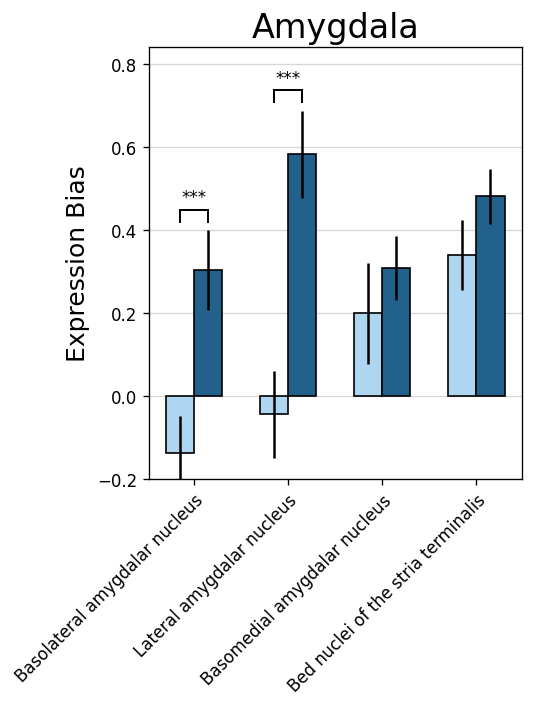

In [291]:
REG = 'Amygdala'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_STR_Errors = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_STR_Errors = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
#print(HIQ_ALL_err)
PlotPhenotype(HIQ_ALL_dat, HIQ_STR_Errors, LIQ_ALL_dat, LIQ_STR_Errors, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias", fig_size=(4.5,6))

(12, 6)


<Figure size 5760x3840 with 0 Axes>

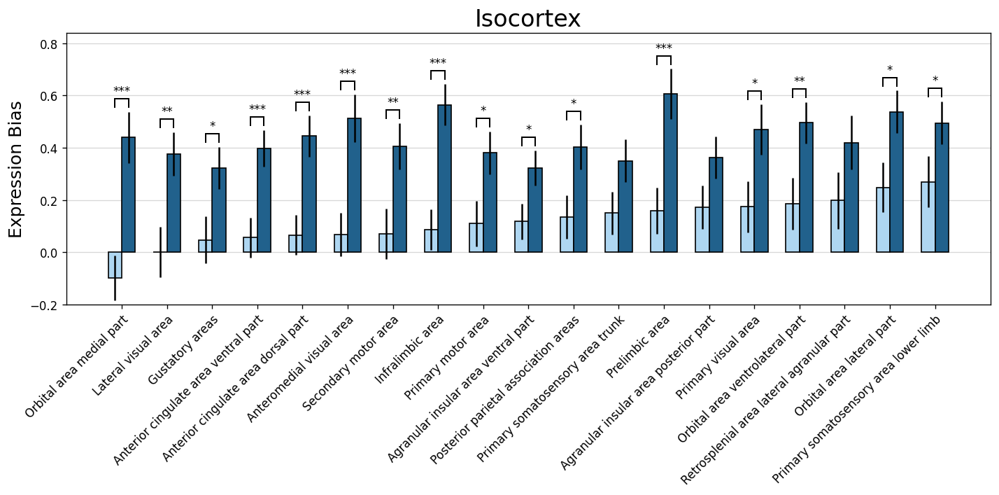

(5, 6)


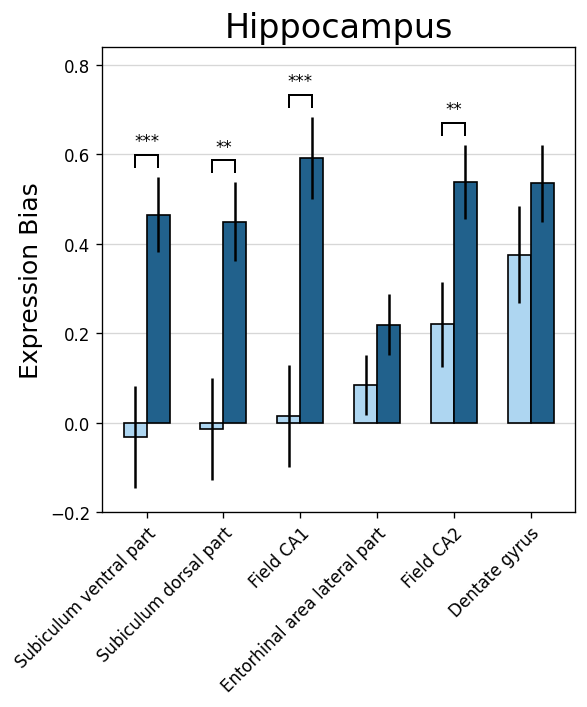

(4, 6)


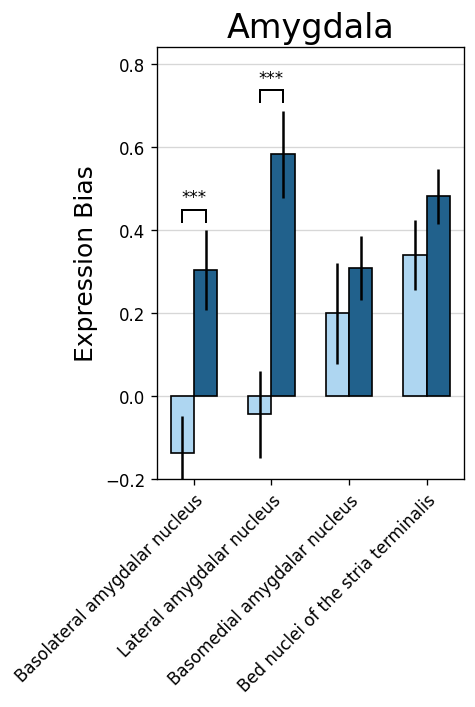

(3, 6)


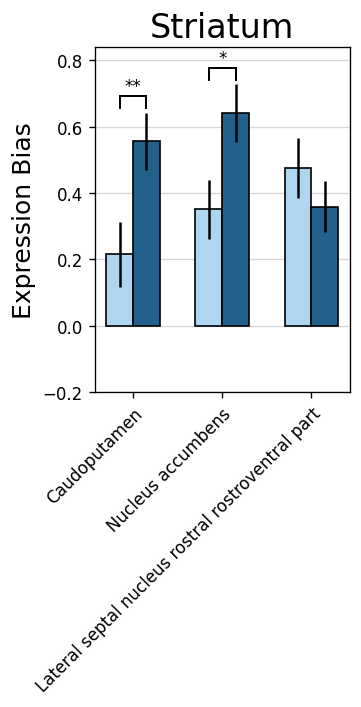

(6, 6)


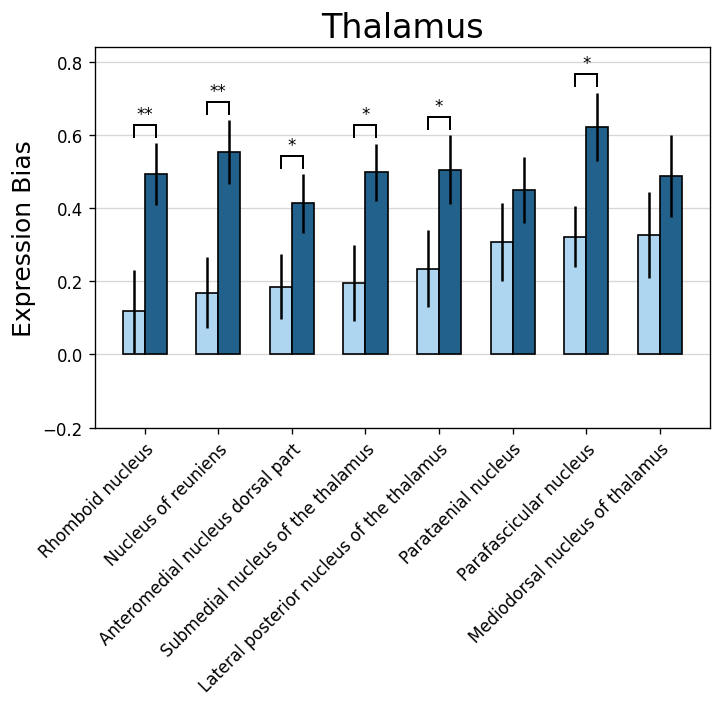

(3, 6)


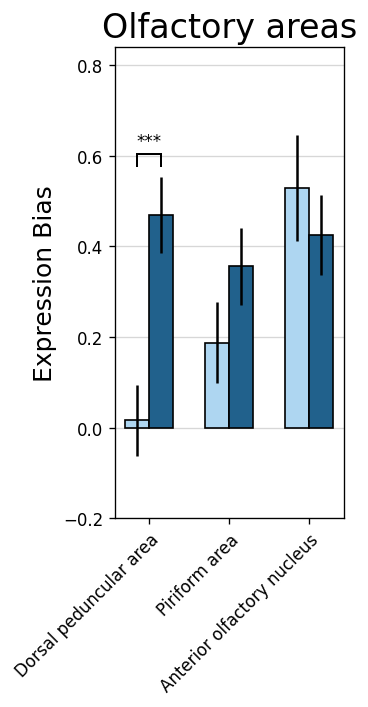

<Figure size 432x288 with 0 Axes>

In [287]:
plt.figure(dpi=480, figsize=(12, 8))

REG = 'Isocortex'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias", fig_size=(12,6))

REG = 'Hippocampus'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias",
                 fig_size=(5.5,6))

REG = 'Amygdala'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias", fig_size=(5,6))

REG = 'Striatum'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias",fig_size=(3,6))

REG = 'Thalamus'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias", fig_size=(6,6))

REG = 'Olfactory_areas'
HIQ_ALL_dat = HIQ_Cir[HIQ_Cir["REGION"]==REG]
LIQ_ALL_dat = LIQ_Cir[LIQ_Cir["REGION"]==REG]
REG_STRs = HIQ_ALL_dat.index.values
HIQ_ALL_err = np.array([np.std(GetBootsDist_STR(HIQ_BootDFs, STR)) for STR in REG_STRs])
LIQ_ALL_err = np.array([np.std(GetBootsDist_STR(LIQ_BootDFs, STR)) for STR in REG_STRs])
PlotPhenotype(HIQ_ALL_dat, HIQ_ALL_err, LIQ_ALL_dat,LIQ_ALL_err, REG, IQ_PhenotypeDF,
              "Higher IQ Bias", "Lower IQ Bias", fig_size=(3,6))

plt.tight_layout()

In [238]:
# for REG in CIR_REGIONS:
#     print(REG)
#     HIQ_LGD_dat = HIQ_LGD_Cir[HIQ_LGD_Cir["REGION"]==REG]
#     HIQ_Dmis_dat = HIQ_Dmis_Cir[HIQ_Dmis_Cir["REGION"]==REG]
#     LIQ_LGD_dat = LIQ_LGD_Cir[LIQ_LGD_Cir["REGION"]==REG]
#     LIQ_Dmis_dat = LIQ_Dmis_Cir[LIQ_Dmis_Cir["REGION"]==REG]
    
#     HIQ_LGD_err = np.std(GetBootsDist(HIQ_BootDFs_LGD, CIR_REGIONS_Dict[REG]))
#     HIQ_Dmis_err = np.std(GetBootsDist(HIQ_BootDFs_Dmis, CIR_REGIONS_Dict[REG]))
#     LIQ_LGD_err = np.std(GetBootsDist(LIQ_BootDFs_LGD, CIR_REGIONS_Dict[REG]))
#     LIQ_Dmis_err = np.std(GetBootsDist(LIQ_BootDFs_Dmis, CIR_REGIONS_Dict[REG]))
    
    
#     PlotPhenotypeV2(HIQ_LGD_dat, HIQ_Dmis_dat, LIQ_LGD_dat, LIQ_Dmis_dat, REG)

In [216]:
for REG in CIR_REGIONS:
    print(REG)
    HighIQ_dat = []
    LowIQ_dat = []
    HighIQ_err = []
    LowIQ_err = []
    HighIQ_dat = HIQ_Spec_Cir[HIQ_Spec_Cir["REGION"]==REG]
    LowIQ_dat  = LIQ_Spec_Cir[LIQ_Spec_Cir["REGION"]==REG]
    PlotPhenotype(HighIQ_dat, LowIQ_dat, REG)

Isocortex


NameError: name 'HIQ_Spec_Cir' is not defined

### Permutation Test

In [59]:
HIQ_PermDFs, LIQ_PermDFs = [], []
for i in range(1,10001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Permutations/IQ_permut/HighIQ.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Permutations/IQ_permut/LowIQ.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    HIQ_PermDFs.append(df1)
    LIQ_PermDFs.append(df2)

In [60]:
REG_Perm_Dat = {}
for REG in CIR_REGIONS:
    REG_Perm_Dat[REG] = []
    for df1, df2 in zip(HIQ_PermDFs, LIQ_PermDFs):
        hiq_perm = df1[df1["REGION"]==REG]["EFFECT"].mean()
        liq_perm = df2[df2["REGION"]==REG]["EFFECT"].mean()
        REG_Perm_Dat[REG].append(liq_perm - hiq_perm)

In [61]:
CIR_REGIONS

['Isocortex',
 'Hippocampus',
 'Amygdala',
 'Striatum',
 'Thalamus',
 'Olfactory_areas']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/home/jw3514/anaconda3/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6709: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/jw3514/anaconda3/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6710: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

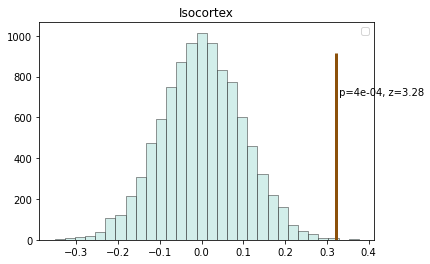

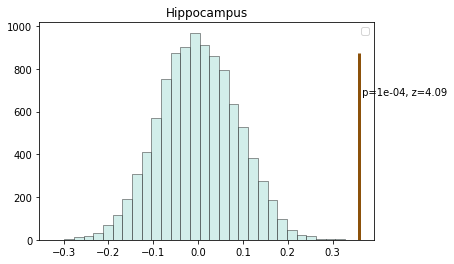

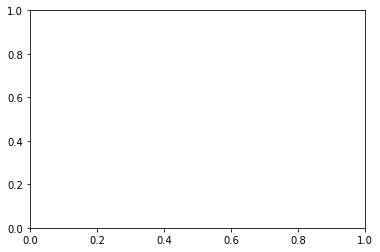

In [62]:
for i, reg in enumerate(CIR_REGIONS):
    obs = LIQ_dat[i] - HIQ_dat[i]
    null = REG_Perm_Dat[reg]
    fig, ax = plt.subplots()
    PlotPermutationP(null, obs, ax)
    plt.title(reg)

In [63]:
HighIQ_Spec = HIQ_DF
LowIQ_Spec = LIQ_DF

str2reg = STR2Region()
IQ_Phenotype_dat = []
for STR in ASD_Circuits:
    Region = str2reg[STR]
    A_effect = HighIQ_Spec.loc[STR, "EFFECT"]
    B_effect = LowIQ_Spec.loc[STR, "EFFECT"]
    A_rank = HighIQ_Spec.loc[STR, "Rank"]
    B_rank = LowIQ_Spec.loc[STR, "Rank"]
    BiasDiff = B_effect - A_effect
    RankDiff = B_rank - A_rank
    IQ_Phenotype_dat.append([STR, Region, A_effect, B_effect, 
                             A_rank, B_rank, BiasDiff, RankDiff])
IQ_PhenotypeDF = pd.DataFrame(IQ_Phenotype_dat, columns=["STR", "REG", "HighIQ Bias", 
            "LowIQ Bias", "HighIQ Rank", "LowIQ Rank", "Bias Diff (low-high)", "Rank Diff"])
IQ_PhenotypeDF.to_csv("../dat/Unionize_bias/IQ_Bias_Diff.csv", index=False)

In [64]:
writer = pd.ExcelWriter('../dat/Unionize_bias/IQ_Bias.xlsx', engine='xlsxwriter')
IQ_PhenotypeDF.to_excel(writer, sheet_name='IQ_Bias_42_Circuits')
HighIQ_Spec.to_excel(writer, sheet_name='HighIQ_Spec')
LowIQ_Spec.to_excel(writer, sheet_name='LowIQ_Spec')
writer.save()

In [65]:
XXX = {"HighIQ":[], "LowIQ":[]}
for i in range(1, 10001):
    df1 = pd.read_csv('../dat/Unionize_bias/Permutations/IQ_permut/HighIQ.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Permutations/IQ_permut/LowIQ.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    XXX["HighIQ"].append(df1)
    XXX["LowIQ"].append(df2)

In [66]:
def hahahaha(STR, XXX):
    res = []
    for i in range(0, 10000):
        #print(i, len(XXX["HighIQ"]))
        df1 = XXX["HighIQ"][i]
        df2 = XXX["LowIQ"][i]
        effect_diff = df2.loc[STR, "EFFECT"] - df1.loc[STR, "EFFECT"]
        res.append(effect_diff)
    return np.array(res)

In [67]:
IQ_PhenotypeDF.head(2)

,STR,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff
0,Nucleus_accumbens,Striatum,0.350765,0.640720,10,1,0.289955,-9
1,Orbital_area_lateral_part,Isocortex,0.247823,0.537487,25,11,0.289664,-14


In [68]:
DataDF_dat = []
for i, row in IQ_PhenotypeDF.iterrows():
    STR = row['STR']
    REG = row["REG"]
    Diff = row["Bias Diff (low-high)"]
    HighIQ = row["HighIQ Bias"]
    LowIQ = row["LowIQ Bias"]
    permut_diff = hahahaha(STR, XXX)
    Z, P = GetPermutationP(permut_diff, Diff, gt=True)
    IQ_PhenotypeDF.loc[i, "Pvalue"] = P
    print("%s %.3f %.3f %.3f %.3e" % (STR, HighIQ, LowIQ, Diff, P))

Nucleus_accumbens 0.351 0.641 0.290 1.330e-02
Orbital_area_lateral_part 0.248 0.537 0.290 1.180e-02
Prelimbic_area 0.159 0.606 0.447 8.999e-04
Primary_somatosensory_area_lower_limb 0.270 0.495 0.225 4.880e-02
Orbital_area_ventrolateral_part 0.185 0.496 0.311 6.599e-03
Parafascicular_nucleus 0.321 0.621 0.300 1.060e-02
Lateral_amygdalar_nucleus -0.044 0.581 0.626 9.999e-05
Claustrum 0.115 0.602 0.487 3.000e-04
Endopiriform_nucleus_dorsal_part 0.201 0.533 0.331 6.799e-03
Infralimbic_area 0.087 0.565 0.477 9.999e-05
Caudoputamen 0.215 0.556 0.341 6.999e-03
Dentate_gyrus 0.376 0.535 0.159 1.167e-01
Anteromedial_visual_area 0.067 0.513 0.445 2.000e-04
Nucleus_of_reuniens 0.169 0.553 0.385 1.800e-03
Anterior_olfactory_nucleus 0.529 0.425 -0.104 7.654e-01
Anterior_pretectal_nucleus 0.471 0.435 -0.036 5.910e-01
Field_CA2 0.219 0.538 0.319 6.299e-03
Subiculum_ventral_part -0.032 0.465 0.498 5.000e-04
Retrosplenial_area_lateral_agranular_part 0.198 0.420 0.221 6.889e-02
Field_CA1 0.014 0.592 0.5

In [69]:
IQ_PhenotypeDF.to_csv("../dat/Unionize_bias/IQ_Bias_Diff.Pvalues.csv", index=False)

In [70]:
IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]<0.05/42]

,STR,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
2,Prelimbic_area,Isocortex,0.158651,0.605728,57,3,0.447078,-54,0.0009
6,Lateral_amygdalar_nucleus,Amygdala,-0.044428,0.581396,136,6,0.625824,-130,0.0001
7,Claustrum,Cortical_subplate,0.114632,0.601793,75,4,0.487161,-71,0.0003
9,Infralimbic_area,Isocortex,0.087324,0.564669,81,7,0.477345,-74,0.0001
12,Anteromedial_visual_area,Isocortex,0.067253,0.512586,91,14,0.445333,-77,0.0002
17,Subiculum_ventral_part,Hippocampus,-0.032367,0.465211,127,25,0.497578,-102,0.0005
19,Field_CA1,Hippocampus,0.014274,0.591871,112,5,0.577598,-107,0.0003
25,Dorsal_peduncular_area,Olfactory_areas,0.016198,0.469850,110,24,0.453652,-86,0.0002
28,Anterior_cingulate_area_dorsal_part,Isocortex,0.065758,0.444821,92,28,0.379063,-64,0.0007
40,Orbital_area_medial_part,Isocortex,-0.098562,0.439206,147,30,0.537768,-117,0.0001


In [71]:
0.05/42

0.0011904761904761906

In [72]:
IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]>0.05]

,STR,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
11,Dentate_gyrus,Hippocampus,0.375825,0.534774,7,12,0.158949,5,0.116688
14,Anterior_olfactory_nucleus,Olfactory_areas,0.528741,0.424888,2,34,-0.103852,32,0.765423
15,Anterior_pretectal_nucleus,Midbrain,0.471422,0.435046,5,31,-0.036376,26,0.591041
18,Retrosplenial_area_lateral_agranular_part,Isocortex,0.198464,0.419944,46,35,0.221480,-11,0.068893
21,Bed_nuclei_of_the_stria_terminalis,Pallidum,0.338946,0.480122,11,22,0.141176,11,0.093691
27,Lateral_septal_nucleus_rostral_rostroventral_part,Striatum,0.474932,0.359235,4,47,-0.115697,43,0.832617
29,Basomedial_amygdalar_nucleus,Amygdala,0.198557,0.308510,45,59,0.109953,14,0.211179
32,Parataenial_nucleus,Thalamus,0.307828,0.449159,15,26,0.141332,11,0.160684
34,Agranular_insular_area_posterior_part,Isocortex,0.171844,0.363018,55,46,0.191174,-9,0.057294
35,Primary_somatosensory_area_trunk,Isocortex,0.150475,0.350079,60,49,0.199604,-11,0.052795


### Permutation with Gender

In [82]:
Male_PermDFs, Female_PermDFs = [], []
for i in range(1,10001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Male.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Female.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    Male_PermDFs.append(df1)
    Female_PermDFs.append(df2)

In [83]:
REG_Perm_Dat = {}
for REG in CIR_REGIONS:
    REG_Perm_Dat[REG] = []
    for df1, df2 in zip(Male_PermDFs, Female_PermDFs):
        male_perm = df1[df1["REGION"]==REG]["EFFECT"].mean()
        female_perm = df2[df2["REGION"]==REG]["EFFECT"].mean()
        REG_Perm_Dat[REG].append(liq_perm - hiq_perm)

In [84]:
for i, reg in enumerate(CIR_REGIONS):
    obs = Male_ALL_dat[i] - Female_ALL_dat[i]
    null = REG_Perm_Dat[reg]
    fig, ax = plt.subplots()
    PlotPermutationP(null, obs, ax)
    plt.title(reg)

NameError: name 'Male_ALL_dat' is not defined

In [ ]:
str2reg = STR2Region()
Gender_dat = []
for STR in ASD_Circuits:
    Region = str2reg[STR]
    A_effect = Male_ALL.loc[STR, "EFFECT"]
    B_effect = Female_ALL.loc[STR, "EFFECT"]
    A_rank = Male_ALL.loc[STR, "Rank"]
    B_rank = Female_ALL.loc[STR, "Rank"]
    BiasDiff = B_effect - A_effect
    RankDiff = B_rank - A_rank
    Gender_dat.append([STR, Region, A_effect, B_effect, 
                             A_rank, B_rank, BiasDiff, RankDiff])
GenderDF = pd.DataFrame(Gender_dat, columns=["STR", "REG", "Male Bias", 
            "Female Bias", "Male Rank", "Female Rank", "Bias Diff (m-f)", "Rank Diff"])
GenderDF.to_csv("../dat/Unionize_bias/IQ_Bias_Diff.csv", index=False)

In [ ]:
GenderDF.head(10)

In [ ]:
XXX = {"Male":[], "Female":[]}
for i in range(1, 10001):
    df1 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Male.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Female.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    XXX["Male"].append(df1)
    XXX["Female"].append(df2)

In [ ]:
def hahahaha(STR, XXX):
    res = []
    for i in range(0, 10000):
        #print(i, len(XXX["HighIQ"]))
        df1 = XXX["Male"][i]
        df2 = XXX["Female"][i]
        effect_diff = df2.loc[STR, "EFFECT"] - df1.loc[STR, "EFFECT"]
        res.append(effect_diff)
    return np.array(res)

In [ ]:
DataDF_dat = []
for i, row in GenderDF.iterrows():
    STR = row['STR']
    REG = row["REG"]
    Diff = row["Bias Diff (m-f)"]
    HighIQ = row["Male Bias"]
    LowIQ = row["Female Bias"]
    permut_diff = hahahaha(STR, XXX)
    Z, P = GetPermutationP(permut_diff, Diff, gt=True)
    GenderDF.loc[i, "Pvalue"] = P
    print("%s %.3f %.3f %.3f %.3e" % (STR, HighIQ, LowIQ, Diff, P))

In [ ]:
GenderDF[GenderDF["Pvalue"]<0.05]

# Sex

In [151]:
ASC_IQ_dat = pd.read_excel("../doc/1-s2.0-S0092867419313984-mmc4.xlsx", sheet_name="Phenotype")
ASC_IQ_dat = ASC_IQ_dat[ASC_IQ_dat["Role"]=="Proband"]
ASC_IQ_dat = ASC_IQ_dat.dropna(subset=['IQ'])
ASC_Male = ASC_IQ_dat[ASC_IQ_dat["Sex"]=="Male"]["Phenotype_ID"].values
ASC_Female = ASC_IQ_dat[ASC_IQ_dat["Sex"]=="Female"]["Phenotype_ID"].values

Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")
Spark_IQ_dat = Spark_IQ_dat[Spark_IQ_dat["asd"]==True]
Spark_IQ_dat = Spark_IQ_dat.dropna(subset=['fsiq'])
Spark_Male = Spark_IQ_dat[Spark_IQ_dat["sex"]=="Male"]["subject_sp_id"].values
Spark_Female = Spark_IQ_dat[Spark_IQ_dat["sex"]=="Female"]["subject_sp_id"].values

Male = np.concatenate([ASC_Male, Spark_Male])
Female = np.concatenate([ASC_Female, Spark_Female])

ASD_Discov_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Discov_DNVs.txt", delimiter="\t")
ASD_Discov_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Discov_Trios.txt", delimiter="\t")

ASD_Rep_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Rep_DNVs.txt", delimiter="\t")
ASD_Rep_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Rep_Trios.txt", delimiter="\t")

ASD_Muts = pd.concat([ASD_Discov_Muts, ASD_Rep_Muts])
ASD_Trios = pd.concat([ASD_Discov_Trios, ASD_Rep_Trios])

Spark_Meta_2stage = pd.read_excel("../dat/genes/asd/TabS_DenovoWEST_Stage1+2.xlsx",
                           skiprows=2, sheet_name="TopDnEnrich")
Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1.3e-6]
#Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1e-03]
HighConfGenes = Spark_Meta_HC["HGNC"].values
HighConfMuts = ASD_Muts[ASD_Muts["HGNC"].isin(HighConfGenes)]
HighConfMuts = Filt_LGD_Mis(HighConfMuts, Dmis=True)

Male_Muts = HighConfMuts[HighConfMuts["IID"].isin(Male)]
Female_Muts = HighConfMuts[HighConfMuts["IID"].isin(Female)]

/home/jw3514/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_9001/1434545554.py:7: DtypeWarning: Columns (19,21) have mixed types. Specify dtype option on import or set low_memory=False.
  Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")


In [152]:
Male_Muts.to_csv("../dat/Unionize_bias/Gender.Male.Highconf.Muts.csv", index=False)
Female_Muts.to_csv("../dat/Unionize_bias/Gender.Female.Highconf.Muts.csv", index=False)

In [153]:
print(Male_Muts.shape, Female_Muts.shape)

(156, 44) (65, 44)


In [154]:
Male_GW = Mut2GeneDF(Male_Muts, LGD=True, Dmis=True) 
Male_GW_LGD = Mut2GeneDF(Male_Muts, LGD=True, Dmis=False) 
Male_GW_Dmis = Mut2GeneDF(Male_Muts, LGD=False, Dmis=True) 
Male_ALL = AvgSTRZ_Weighted(ExpZ2Mat, Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Male.ALL.bias.csv")
Male_LGD = AvgSTRZ_Weighted(ExpZ2Mat, Male_GW_LGD, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Male.LGD.bias.csv")
Male_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, Male_GW_Dmis, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Male.Dmis.bias.csv")

Female_GW = Mut2GeneDF(Female_Muts, LGD=True, Dmis=True)
Female_GW_LGD = Mut2GeneDF(Female_Muts, LGD=True, Dmis=False)
Female_GW_Dmis = Mut2GeneDF(Female_Muts, LGD=False, Dmis=True)
Female_ALL = AvgSTRZ_Weighted(ExpZ2Mat, Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Female.ALL.bias.csv")
Female_LGD = AvgSTRZ_Weighted(ExpZ2Mat, Female_GW_LGD, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Female.LGD.bias.csv")
Female_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, Female_GW_Dmis, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.Female.Dmis.bias.csv")
Male_ALL = Male_ALL.set_index("STR")
Male_LGD = Male_LGD.set_index("STR")
Male_Dmis = Male_Dmis.set_index("STR")
Female_ALL = Female_ALL.set_index("STR")
Female_LGD = Female_LGD.set_index("STR")
Female_Dmis = Female_Dmis.set_index("STR")

In [183]:
Male_ALL_Cir = Male_ALL.loc[ASD_Circuits,:]
Male_LGD_Cir = Male_LGD.loc[ASD_Circuits,:]
Male_Dmis_Cir = Male_Dmis.loc[ASD_Circuits,:]
Female_ALL_Cir = Female_ALL.loc[ASD_Circuits,:]
Female_LGD_Cir = Female_LGD.loc[ASD_Circuits,:]
Female_Dmis_Cir = Female_Dmis.loc[ASD_Circuits,:]


Male_ALL_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
Male_LGD_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
Male_Dmis_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
Female_ALL_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
Female_LGD_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
Female_Dmis_Cir.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [184]:
Male_BootDFs = []
Male_BootDFs_LGD = []
Male_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Male/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Male/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Male/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    Male_BootDFs.append(df1)
    Male_BootDFs_LGD.append(df2)
    Male_BootDFs_Dmis.append(df3)

Female_BootDFs = []
Female_BootDFs_LGD = []
Female_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Female/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Female/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.Female/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    Female_BootDFs.append(df1)
    Female_BootDFs_LGD.append(df2)
    Female_BootDFs_Dmis.append(df3)

In [186]:
CIR_REGIONS = ['Isocortex', 'Hippocampus', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']
Male_ALL_dat = []
Male_LGD_dat = []
Male_Dmis_dat = []
Female_ALL_dat = []
Female_LGD_dat = []
Female_Dmis_dat = []

Male_err = []
Male_LGD_err = []
Male_Dmis_err = []
Female_err = []
Female_LGD_err = []
Female_Dmis_err = []

for REG in CIR_REGIONS:
    Male_ALL_dat.append(Male_ALL_Cir[Male_ALL_Cir["REGION"]==REG]["EFFECT"].mean())
    Male_LGD_dat.append(Male_LGD_Cir[Male_LGD_Cir["REGION"]==REG]["EFFECT"].mean())
    Male_Dmis_dat.append(Male_Dmis_Cir[Male_Dmis_Cir["REGION"]==REG]["EFFECT"].mean())
    Female_ALL_dat.append(Female_ALL_Cir[Female_ALL_Cir["REGION"]==REG]["EFFECT"].mean())
    Female_LGD_dat.append(Female_LGD_Cir[Female_LGD_Cir["REGION"]==REG]["EFFECT"].mean())
    Female_Dmis_dat.append(Female_Dmis_Cir[Female_Dmis_Cir["REGION"]==REG]["EFFECT"].mean())
    
    Male_err.append(np.std(GetBootsDist(Male_BootDFs, CIR_REGIONS_Dict[REG])))
    Male_LGD_err.append(np.std(GetBootsDist(Male_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    Male_Dmis_err.append(np.std(GetBootsDist(Male_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))
    Female_err.append(np.std(GetBootsDist(Female_BootDFs, CIR_REGIONS_Dict[REG])))
    Female_LGD_err.append(np.std(GetBootsDist(Female_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    Female_Dmis_err.append(np.std(GetBootsDist(Female_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))
    
Male_ALL_dat = np.array(Male_ALL_dat)
Male_LGD_dat = np.array(Male_LGD_dat)
Male_Dmis_dat = np.array(Male_Dmis_dat)    
Female_ALL_dat = np.array(Female_ALL_dat)
Female_LGD_dat = np.array(Female_LGD_dat)
Female_Dmis_dat = np.array(Female_Dmis_dat)  
Male_err = np.array(Male_err)
Male_LGD_err = np.array(Male_LGD_err)
Male_Dmis_err = np.array(Male_Dmis_err)
Female_err = np.array(Female_err)
Female_LGD_err = np.array(Female_LGD_err)
Female_Dmis_err = np.array(Female_Dmis_err)

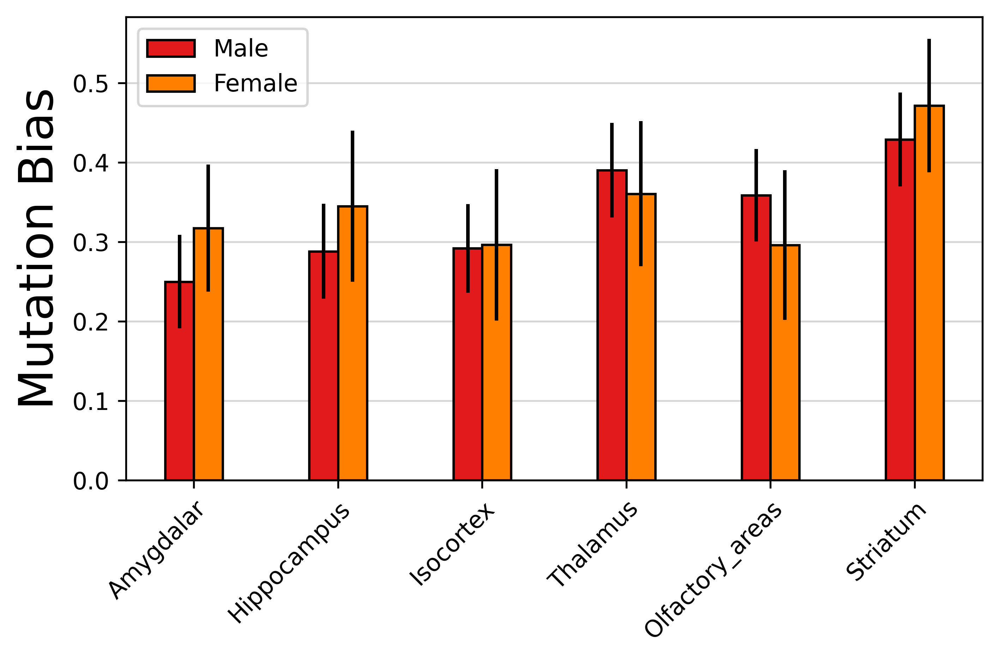

In [527]:

CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.1, Male_ALL_dat[sort_idx], yerr=Male_err[sort_idx], color="#e31a1c", width=0.2, label="Male", 
       edgecolor ='black')
ax.bar(X + 0.1, Female_ALL_dat[sort_idx], yerr=Female_err[sort_idx], color="#ff7f00", width=0.2, label="Female", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Mutation Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
ax.legend(loc="upper left")
plt.tight_layout()
#ax.set_ylim(0, 0.65)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      
#plt.title("Bias - ALL")

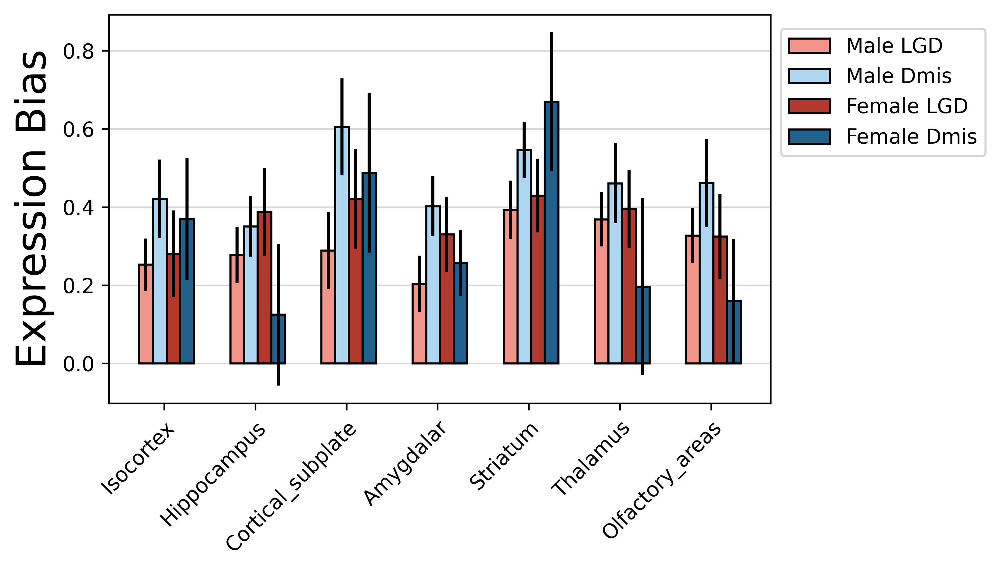

In [68]:
sort_idx = np.argsort(Male_LGD_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, Male_LGD_dat[sort_idx], yerr=Male_LGD_err[sort_idx], color="#F1948A", width=0.15, label="Male LGD", 
       edgecolor ='black')
ax.bar(X - 0.05, Male_Dmis_dat[sort_idx], yerr=Male_Dmis_err[sort_idx], color="#AED6F1", width=0.15, label="Male Dmis", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, Female_LGD_dat[sort_idx], yerr=Female_LGD_err[sort_idx], color="#B03A2E", width=0.15, label="Female LGD", 
       edgecolor ='black')
ax.bar(X + 0.25, Female_Dmis_dat[sort_idx], yerr=Female_Dmis_err[sort_idx], color="#21618C", width=0.15, label="Female Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

Text(0.5, 1.0, 'Bias - LGD')

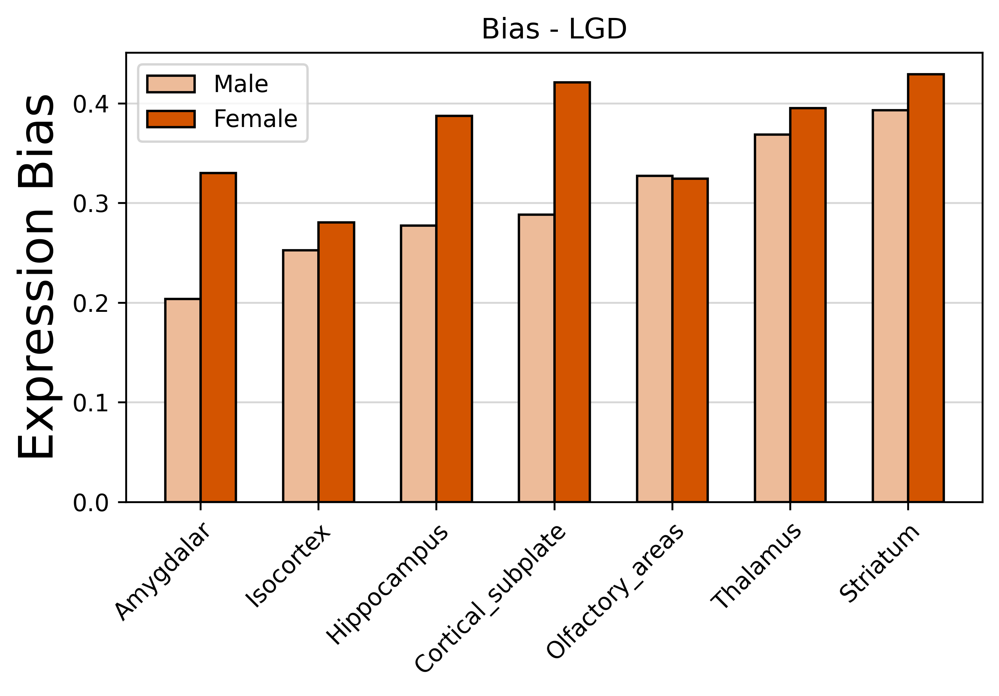

In [244]:
sort_idx = np.argsort(Male_LGD_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.15, Male_LGD_dat[sort_idx], color="#EDBB99", width=0.3, label="Male", 
       edgecolor ='black')
ax.bar(X + 0.15, Female_LGD_dat[sort_idx], color="#D35400", width=0.3, label="Female", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
ax.legend(loc="upper left")
plt.tight_layout()
#ax.set_ylim(0, 0.65)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      
plt.title("Bias - LGD")

Text(0.5, 1.0, 'Bias - Dmis')

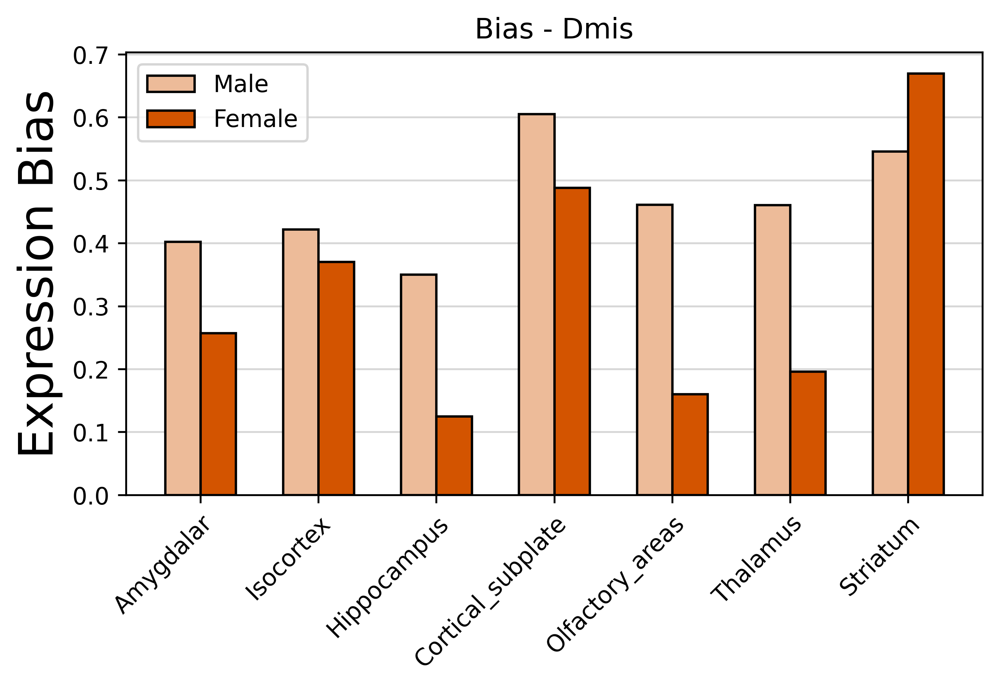

In [245]:
sort_idx = np.argsort(Male_LGD_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.15, Male_Dmis_dat[sort_idx], color="#EDBB99", width=0.3, label="Male", 
       edgecolor ='black')
ax.bar(X + 0.15, Female_Dmis_dat[sort_idx], color="#D35400", width=0.3, label="Female", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
ax.legend(loc="upper left")
plt.tight_layout()
#ax.set_ylim(0, 0.65)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      
plt.title("Bias - Dmis")

#### Individual STRs

In [174]:
def PlotPhenotype(HighIQ_dat, LowIQ_dat, REG):
    X = np.arange(LowIQ_dat.shape[0])
    fig, ax = plt.subplots(dpi=120, figsize = (4+ LowIQ_dat.shape[0]/2, 6))
    ax.bar(X - 0.15, HighIQ_dat["EFFECT"], color="#EDBB99", width=0.3, label="Male", 
           edgecolor ='black')
    ax.bar(X + 0.15, LowIQ_dat["EFFECT"], color="#D35400", width=0.3, label="Female", 
       edgecolor ='black', hatch="")

    ax.set_xlabel('', fontweight ='bold', fontsize = 15)
    ax.set_ylabel('Expression Bias', fontsize = 15)
    plt.xticks(X, LowIQ_dat.index.values, rotation=45, fontsize=10, ha='right', rotation_mode="anchor")

    ax.legend(loc="upper left")
    plt.title(REG)
    plt.tight_layout()
    #ax.set_ylim(0, 0.65)
    ax.grid(True, axis="y", alpha=0.5)
    ax.set_axisbelow(True)      
    plt.show()

Isocortex


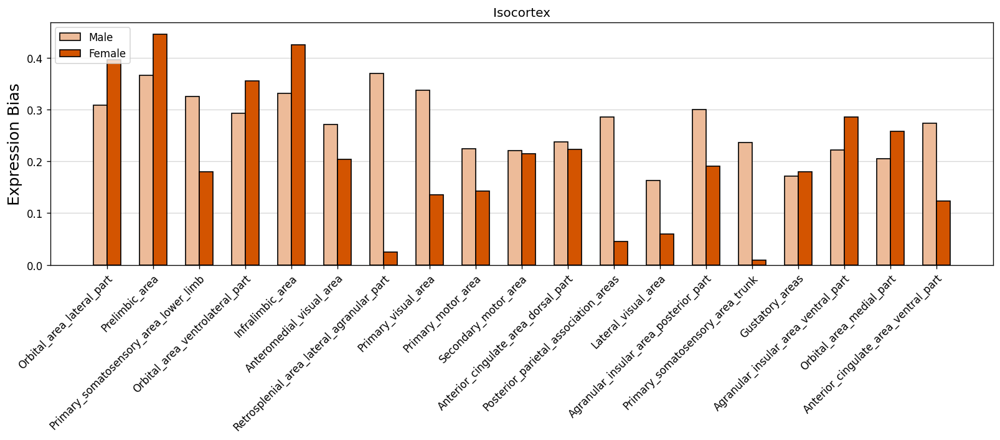

Hippocampus


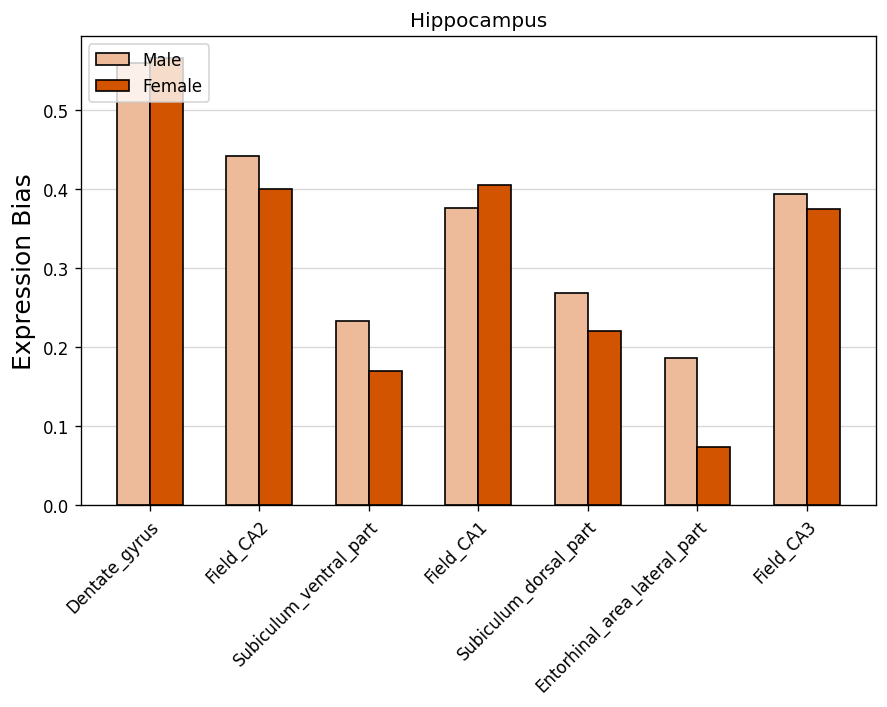

Cortical_subplate


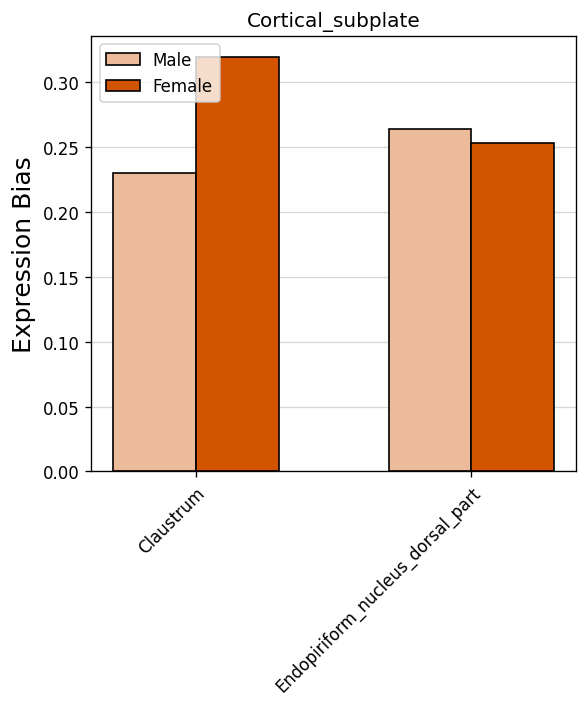

Amygdalar


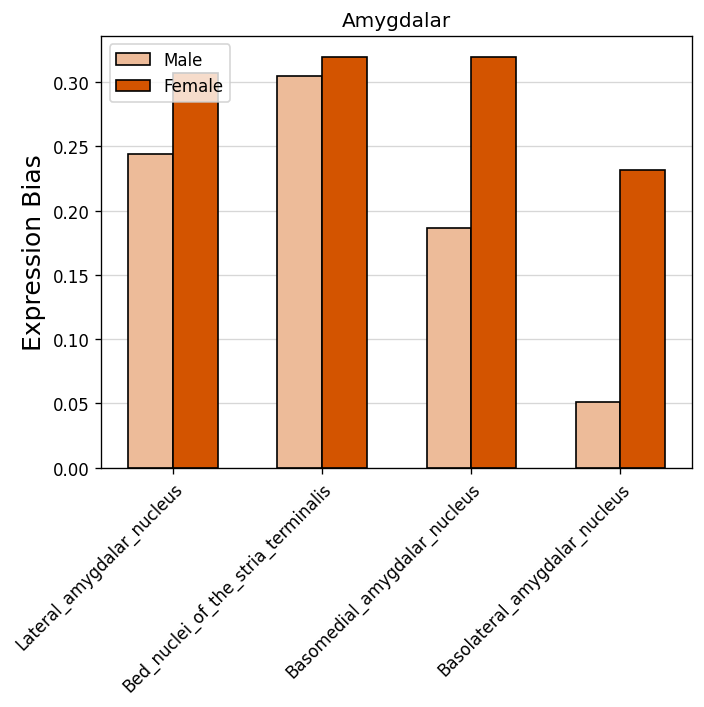

Striatum


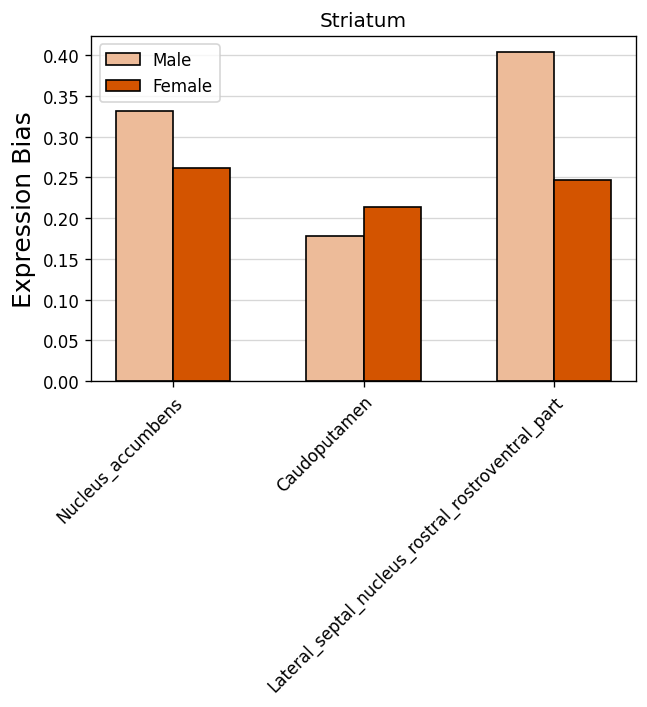

Thalamus


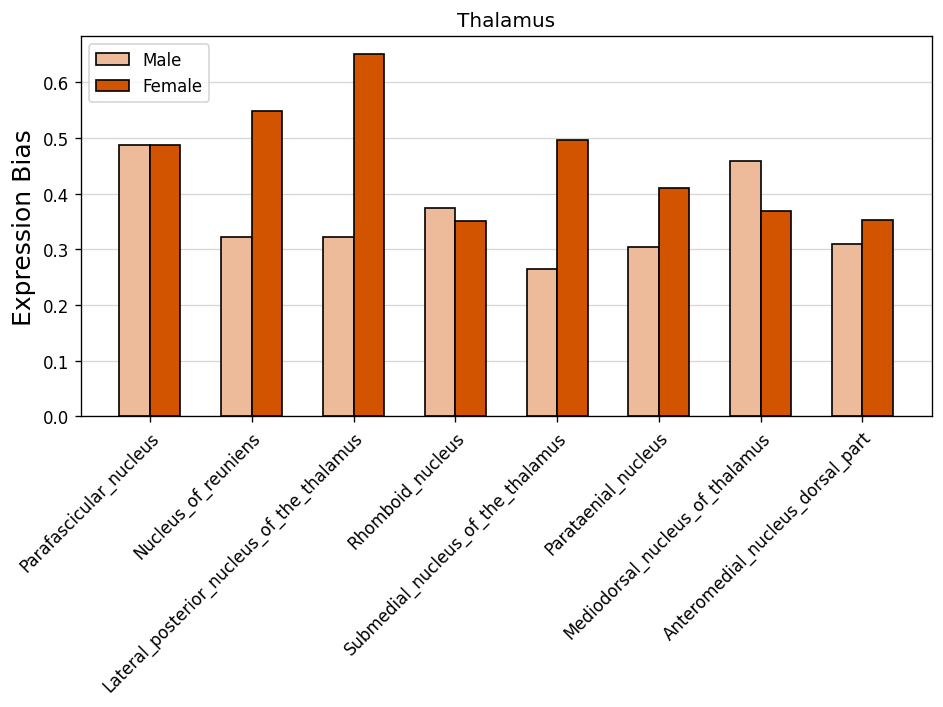

Olfactory_areas


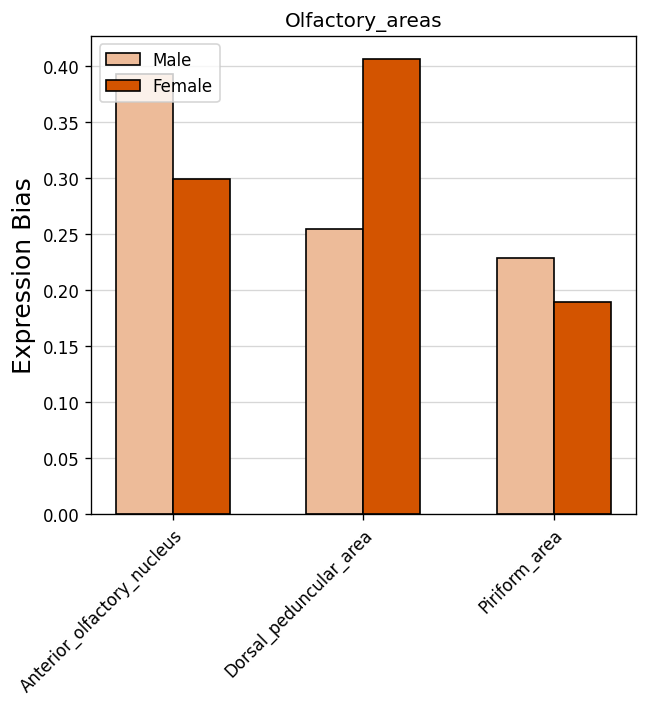

In [175]:
for REG in CIR_REGIONS:
    print(REG)
    HighIQ_dat = []
    LowIQ_dat = []
    HighIQ_dat = Male_LGD_Cir[Male_LGD_Cir["REGION"]==REG]
    LowIQ_dat  = Female_LGD_Cir[Female_LGD_Cir["REGION"]==REG]
    PlotPhenotype(HighIQ_dat, LowIQ_dat, REG)

Isocortex


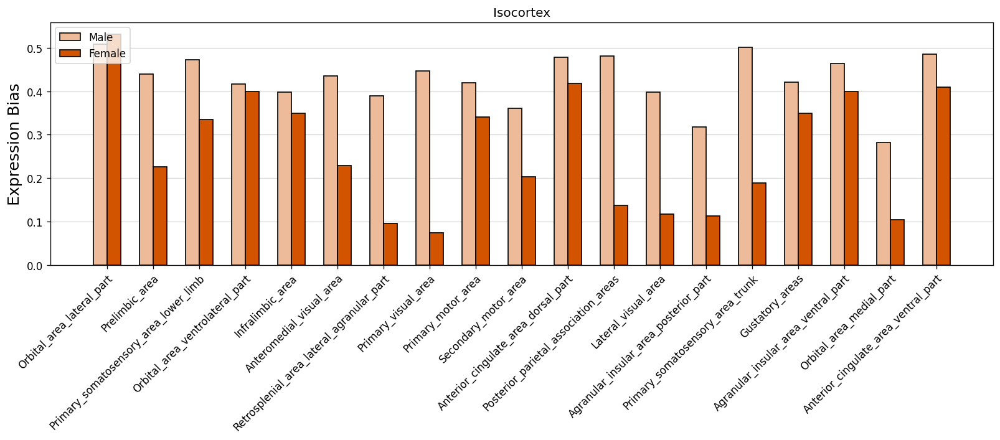

Hippocampus


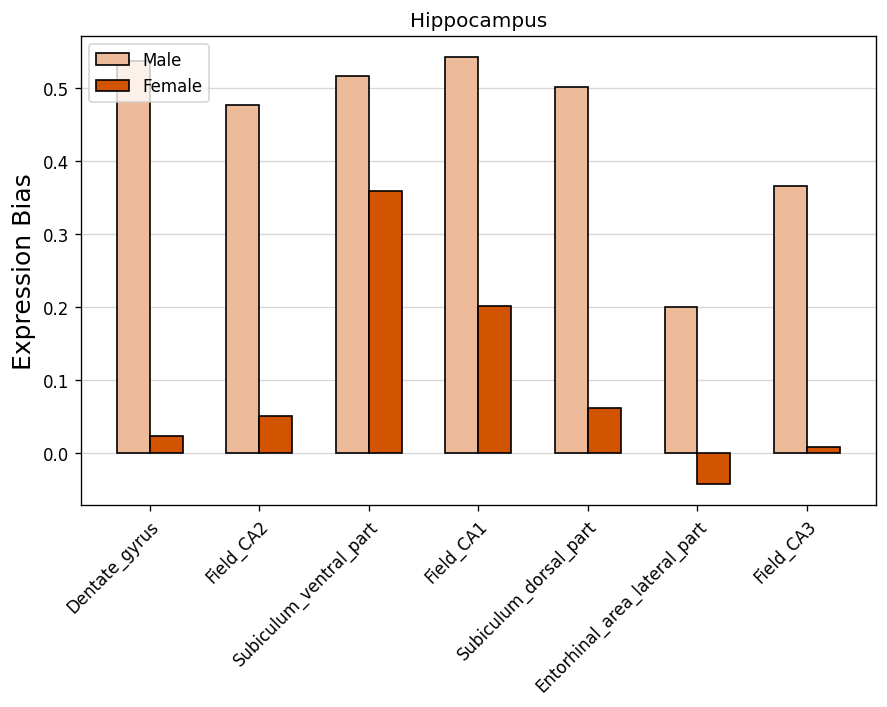

Cortical_subplate


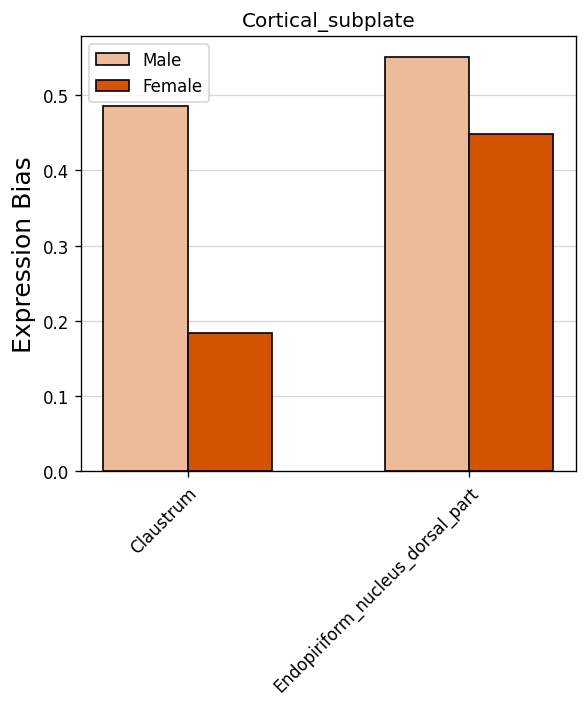

Amygdalar


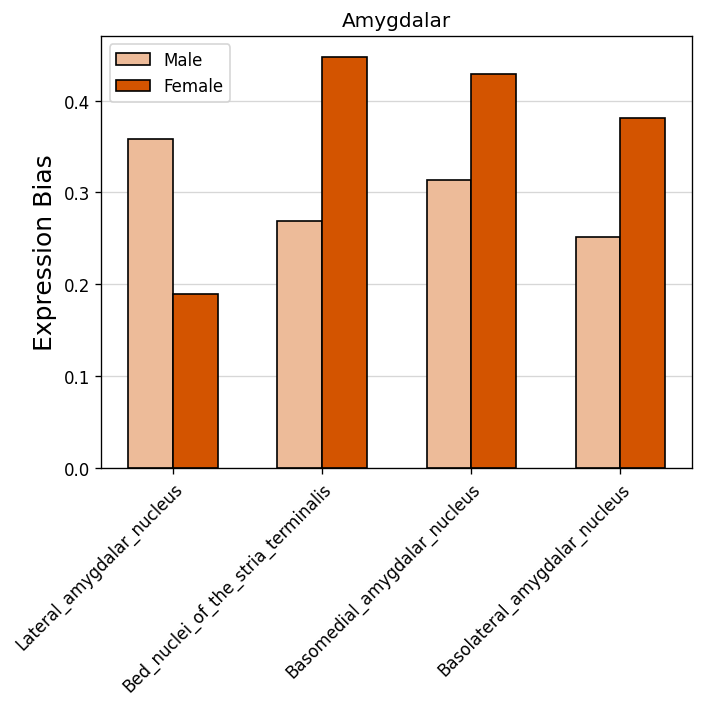

Striatum


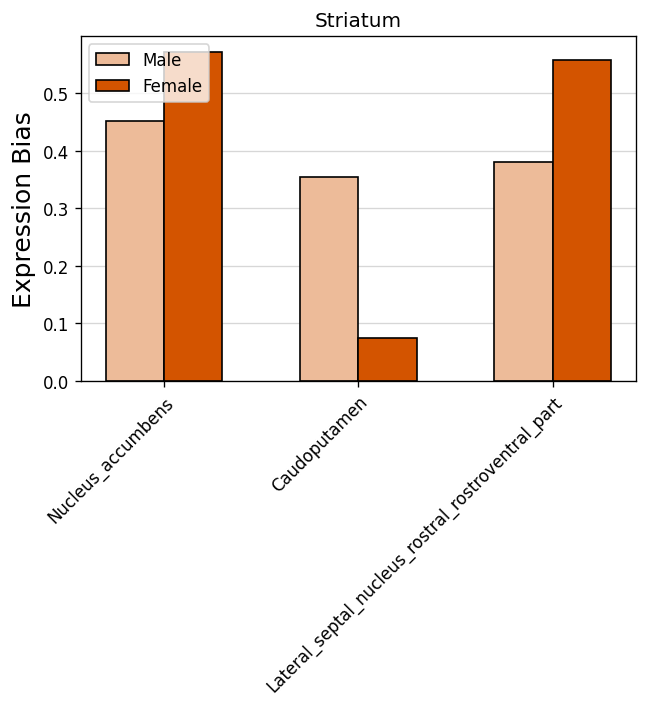

Thalamus


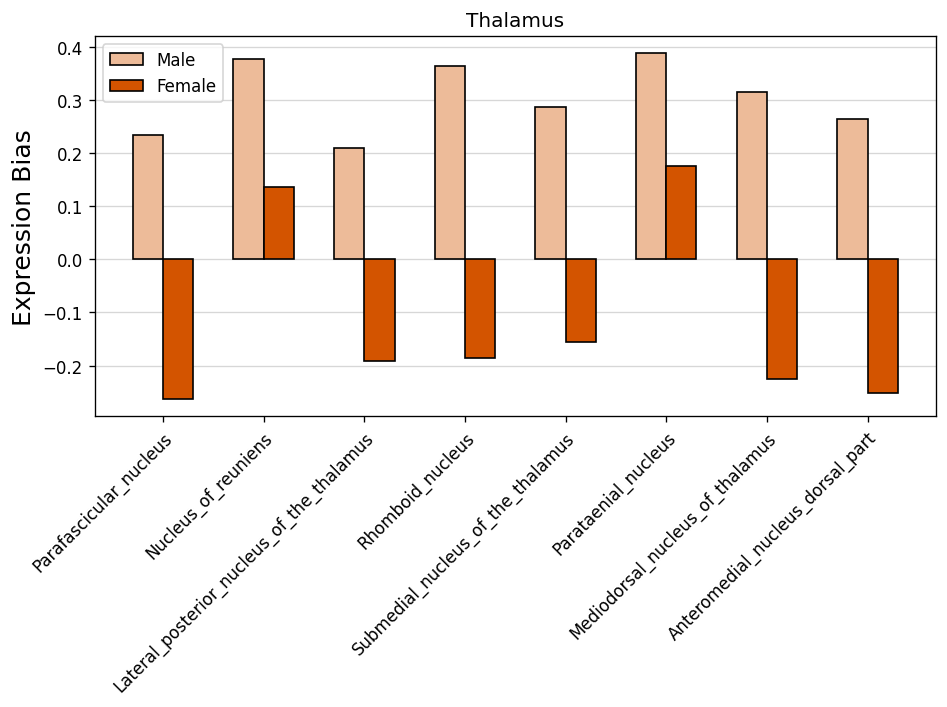

Olfactory_areas


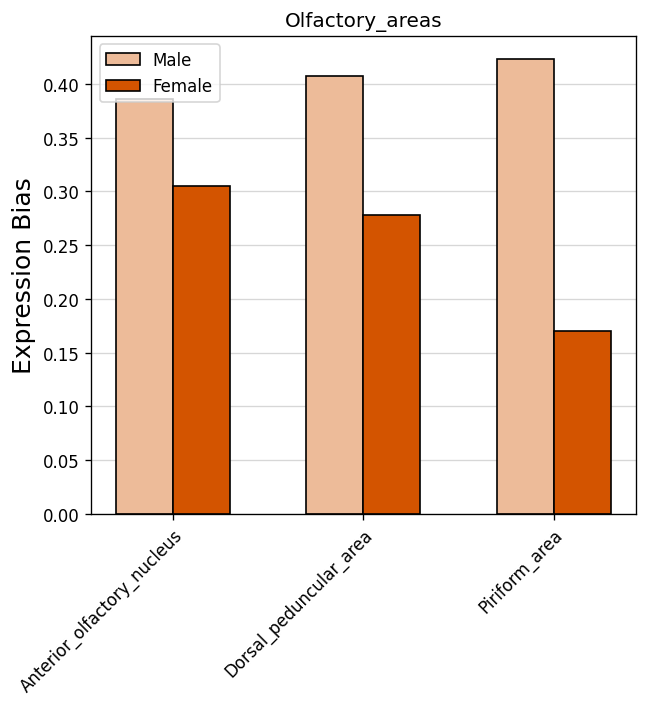

In [176]:
for REG in CIR_REGIONS:
    print(REG)
    HighIQ_dat = []
    LowIQ_dat = []
    HighIQ_dat = Male_Dmis_Cir[Male_Dmis_Cir["REGION"]==REG]
    LowIQ_dat  = Female_Dmis_Cir[Female_Dmis_Cir["REGION"]==REG]
    PlotPhenotype(HighIQ_dat, LowIQ_dat, REG)

### Permutation Test

In [236]:
Male_PermDFs, Female_PermDFs = [], []
for i in range(1,101,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Male.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Permutations/Gender_permut/Female.bias.perm.{}.csv'.format(i), 
                      index_col="STR")
    Male_PermDFs.append(df1)
    Female_PermDFs.append(df2)

In [238]:
Gender_REG_Perm_Dat = {}
for REG in CIR_REGIONS:
    Gender_REG_Perm_Dat[REG] = []
    for df1, df2 in zip(Male_PermDFs, Female_PermDFs):
        m_perm = df1[df1["REGION"]==REG]["EFFECT"].mean()
        f_perm = df2[df2["REGION"]==REG]["EFFECT"].mean()
        Gender_REG_Perm_Dat[REG].append(m_perm - f_perm)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


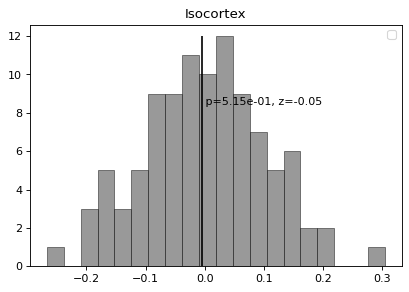

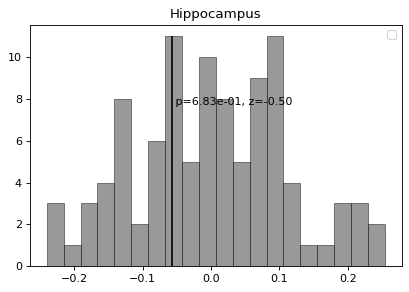

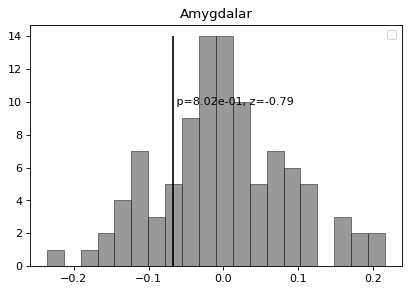

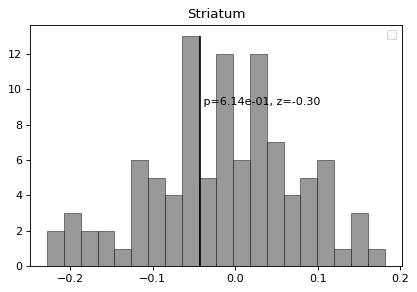

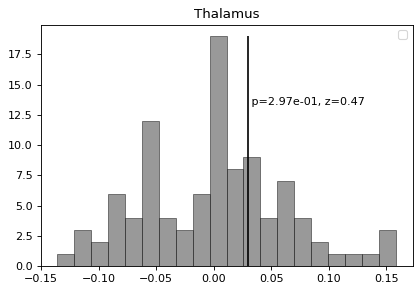

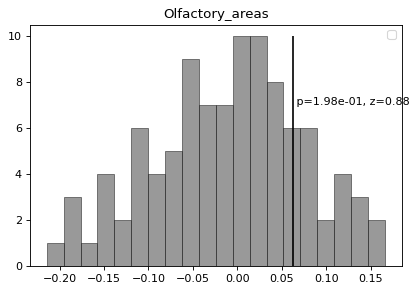

In [240]:
for i, reg in enumerate(CIR_REGIONS):
    obs = Male_ALL_dat[i] - Female_ALL_dat[i]
    null = Gender_REG_Perm_Dat[reg]
    fig, ax = plt.subplots()
    PlotPermutationP(null, obs, ax)
    plt.title(reg)

# Sex And IQ

In [56]:
ASC_HIQ_Male =   ASC_IQ_dat[(ASC_IQ_dat["Sex"]=="Male")  &(ASC_IQ_dat["IQ"]> 70)]["Phenotype_ID"].values
ASC_HIQ_Female = ASC_IQ_dat[(ASC_IQ_dat["Sex"]=="Female")&(ASC_IQ_dat["IQ"]> 70)]["Phenotype_ID"].values
ASC_LIQ_Male =   ASC_IQ_dat[(ASC_IQ_dat["Sex"]=="Male")  &(ASC_IQ_dat["IQ"]<=70)]["Phenotype_ID"].values
ASC_LIQ_Female = ASC_IQ_dat[(ASC_IQ_dat["Sex"]=="Female")&(ASC_IQ_dat["IQ"]<=70)]["Phenotype_ID"].values
                           
Spark_HIQ_Male = Spark_IQ_dat[(Spark_IQ_dat["sex"]=="Male")&
                              (Spark_IQ_dat["fsiq"]>70)]["subject_sp_id"].values
Spark_HIQ_Female = Spark_IQ_dat[(Spark_IQ_dat["sex"]=="Female")&
                              (Spark_IQ_dat["fsiq"]>70)]["subject_sp_id"].values
Spark_LIQ_Male = Spark_IQ_dat[(Spark_IQ_dat["sex"]=="Male")&
                              (Spark_IQ_dat["fsiq"]<=70)]["subject_sp_id"].values
Spark_LIQ_Female = Spark_IQ_dat[(Spark_IQ_dat["sex"]=="Female")&
                              (Spark_IQ_dat["fsiq"]<=70)]["subject_sp_id"].values

HighIQ_Male = np.concatenate([ASC_HIQ_Male, Spark_HIQ_Male])
HighIQ_Female = np.concatenate([ASC_HIQ_Female, Spark_HIQ_Female])
LowIQ_Male = np.concatenate([ASC_LIQ_Male, Spark_LIQ_Male])
LowIQ_Female = np.concatenate([ASC_LIQ_Female, Spark_LIQ_Female])

HighIQ_Male_Muts = HighConfMuts[HighConfMuts["IID"].isin(HighIQ_Male)]
HighIQ_Female_Muts = HighConfMuts[HighConfMuts["IID"].isin(HighIQ_Female)]
LowIQ_Male_Muts = HighConfMuts[HighConfMuts["IID"].isin(LowIQ_Male)]
LowIQ_Female_Muts = HighConfMuts[HighConfMuts["IID"].isin(LowIQ_Female)]
print(HighIQ_Male_Muts.shape[0], HighIQ_Female_Muts.shape[0], 
      LowIQ_Male_Muts.shape[0], LowIQ_Female_Muts.shape[0])

82 20 74 45


In [61]:
HighIQ_Male_Muts.to_csv("../dat/Unionize_bias/Pheno.HighIQ.Male.Highconf.Muts.csv", index=False)
HighIQ_Female_Muts.to_csv("../dat/Unionize_bias/Pheno.HighIQ.Female.Highconf.Muts.csv", index=False)
LowIQ_Male_Muts.to_csv("../dat/Unionize_bias/Pheno.LowIQ.Male.Highconf.Muts.csv", index=False)
LowIQ_Female_Muts.to_csv("../dat/Unionize_bias/Pheno.LowIQ.Female.Highconf.Muts.csv", index=False)

#### IQ vs Bias Correlation

In [ ]:
ASD_CircuitsSet = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/notebooks/ASD.SA.Circuits.Size46.csv",
    index_col="idx")
ASD_Circuits = ASD_CircuitsSet.loc[3, "STRs"].split(";")
#ASD_Circuits.append("Field_CA3")

CIR_REGIONS = ['Isocortex', 'Hippocampus', 
     'Cortical_subplate', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']

CIR_REGIONS_Dict = {}
for i in range(len(CIR_REGIONS)):
    CIR_REGIONS_Dict[CIR_REGIONS[i]] = []
for _str in ASD_Circuits:
    for i in range(len(CIR_REGIONS)):
        if str2reg[_str] == CIR_REGIONS[i]:
            CIR_REGIONS_Dict[CIR_REGIONS[i]].append(_str)
            break
CIR_REGIONS_Dict["Amygdalar"].append("Bed_nuclei_of_the_stria_terminalis")

In [52]:
# Pre-defined variables
CogRegs = ["Isocortex", "Hippocampus", "Cortical_subplate", "Amygdalar"]
NonCogRegs = ["Striatum", "Thalamus", "Olfactory_areas"]
CogSTRs = [s for s in ASD_Circuits if str2reg[s] in CogRegs]
NonCogSTRs = [s for s in ASD_Circuits if str2reg[s] in NonCogRegs]

In [84]:
HighConfMuts.columns.values

array(['Cohort', 'FamID', 'IID', 'Sex', 'Pheno', 'DNASource', 'VarID',
       'Chrom', 'Position', 'Ref', 'Alt', 'Context', 'GeneID', 'HGNC',
       'ExACpLI', 'LOEUFbin', 'Arisk', 'GeneEff', 'TransCount',
       'TransIDs', 'TransEffs', 'cDNAChg', 'CodonChg', 'AAChg', 'REVEL',
       'MPC', 'PrimateAI', 'CADD13', 'ExAC_ALL', 'gnomADexome_ALL', 'LoF',
       'LoF_filter', 'LoF_flags', 'pExt_GTExBrain', 'pExt_HBDR',
       'HGNCv24', 'DS_AG', 'DS_AL', 'DS_DG', 'DS_DL', 'DP_AG', 'DP_AL',
       'DP_DG', 'DP_DL'], dtype=object)

In [99]:
Mut_n_IQ = HighConfMuts[["IID", "Sex", "Pheno", "VarID", "GeneID", "HGNC", "GeneEff", 
                        "REVEL", "ExACpLI"]]
ASC_IQ_search = ASC_IQ_dat.set_index("Phenotype_ID")
Spark_IQ_search = Spark_IQ_dat.set_index("subject_sp_id")

In [100]:
for i, row in Mut_n_IQ.iterrows():
    Mut_n_IQ.loc[i, "Entrez"] = int(GeneSymbol2Entrez[row["HGNC"]])
    IID = row["IID"]
    if IID in ASC_IQ_search.index.values:
        Mut_n_IQ.loc[i, "IQ"] = ASC_IQ_search.loc[IID, "IQ"]
    elif IID in Spark_IQ_search.index.values:
        Mut_n_IQ.loc[i, "IQ"] = Spark_IQ_search.loc[IID, "fsiq"]
    else:
        Mut_n_IQ.loc[i, "IQ"] = -1
Mut_n_IQ = Mut_n_IQ[Mut_n_IQ["IQ"]!=-1]

/tmp/ipykernel_1911778/1135650283.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Mut_n_IQ.loc[i, "Entrez"] = int(GeneSymbol2Entrez[row["HGNC"]])
/tmp/ipykernel_1911778/1135650283.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Mut_n_IQ.loc[i, "IQ"] = -1


In [103]:
Male_LGD = Mut_n_IQ[(Mut_n_IQ["GeneEff"]!="missense")&(Mut_n_IQ["Sex"]=="Male")]
Male_Dmis = Mut_n_IQ[(Mut_n_IQ["GeneEff"]=="missense")&(Mut_n_IQ["Sex"]=="Male")]
Female_LGD = Mut_n_IQ[(Mut_n_IQ["GeneEff"]!="missense")&(Mut_n_IQ["Sex"]=="Female")]
Female_Dmis = Mut_n_IQ[(Mut_n_IQ["GeneEff"]=="missense")&(Mut_n_IQ["Sex"]=="Female")]

In [108]:
ExpZ2Mat

,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,Nucleus_ambiguus,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
1,0.409837,-0.581435,-0.594606,-0.800554,-0.782203,1.696205,-0.905862,NaN,-0.385306,-0.505779,...,-0.941669,1.135876,-1.144142,-0.212505,1.221017,-0.112535,0.223401,-0.177226,1.284936,0.738990
2,-0.439982,-0.589145,-0.496139,-0.521484,0.106047,-0.407245,-0.018364,-0.398513,-0.208207,-0.480868,...,-0.499681,-0.523493,-0.152573,-0.275961,-0.373536,-0.539785,-0.543094,-0.382633,0.036790,1.109502
131076,1.545036,-1.376463,-1.582020,-0.804973,-0.268058,-1.303032,-0.306551,0.192133,-0.662855,1.553128,...,-0.914177,-1.536790,-0.827520,-0.611241,-0.250607,2.079513,1.383803,1.560648,0.808778,2.126709
9,-0.074561,0.226121,0.308028,-1.071384,0.008005,-0.644131,-0.707363,-0.499201,-0.810724,-0.003223,...,-0.644883,-0.605185,-0.763023,-0.621743,0.552656,-0.695107,-0.729302,-0.584784,-0.300117,0.063816
10,-0.039672,0.225181,0.325189,-1.089473,-0.003844,-0.657787,-0.716346,-0.494861,-0.760499,0.009242,...,-0.623292,-0.604452,-0.752981,-0.634637,0.532088,-0.675380,-0.706362,-0.587613,-0.300050,0.068550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50832,-0.505986,-0.315377,-0.564709,-0.287701,-0.449209,-0.032640,-0.422483,-0.369352,-0.542068,0.334041,...,-0.133439,-0.421338,-0.531216,-0.322090,-0.604234,-0.382187,0.116398,-0.261675,0.277173,8.561470
116369,1.083623,0.598680,-0.628497,-0.153551,-1.234508,1.126539,0.440308,0.858082,0.347535,1.628297,...,0.242503,0.706557,0.068396,-1.128800,2.110822,-1.320249,-1.564371,-1.619146,-0.113831,0.474958
50834,-0.531656,-0.532651,-0.570960,0.426166,-0.610823,-0.512801,-0.676982,-0.575061,-0.388396,3.735587,...,-0.507167,-0.557451,-0.587856,-0.450022,-0.432854,-0.467218,-0.338290,-0.208726,-0.475364,0.704192
50833,-0.052294,-0.588913,-0.440035,-0.204781,-0.271222,-0.538379,-0.631846,-0.686948,-0.757116,-0.347368,...,-0.722578,-0.210363,-0.618268,1.044157,-0.481153,-0.594328,-0.538791,1.003263,-0.182040,-0.352594


In [111]:
23126 in ExpZ2Mat.index.values

False

In [127]:
def XXX(ExpZ2Mat, STRs, MutDF1, MutDF2):
    x1, y1 = [], []
    for i, row in MutDF1.iterrows():
        g = int(row["Entrez"])
        if g not in ExpZ2Mat.index.values:
            continue
        IQ = row["IQ"]
        bias = ExpZ2Mat.loc[g, STRs].mean()
        x1.append(bias)
        y1.append(IQ)
    x2, y2 = [], []
    for i, row in MutDF2.iterrows():
        g = int(row["Entrez"])
        if g not in ExpZ2Mat.index.values:
            continue
        IQ = row["IQ"]
        bias = ExpZ2Mat.loc[g, STRs].mean()
        x2.append(bias)
        y2.append(IQ)
    return np.array(x1), np.array(y1), np.array(x2), np.array(y2)

-0.3445741944892288 0.0004471415806011595
-0.17726166289041864 0.23858875596748308


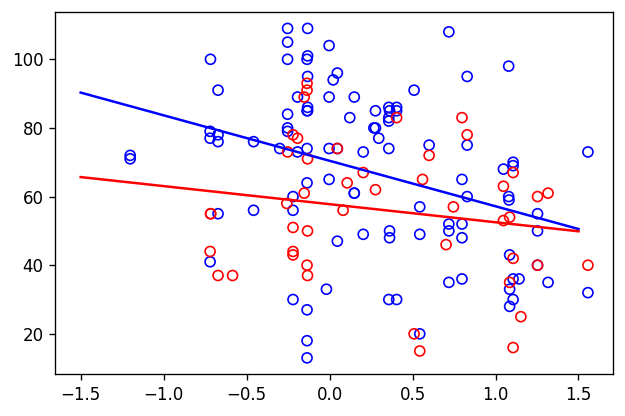

In [134]:
x1, y1, x2, y2 = XXX(ExpZ2Mat, CogSTRs, Male_LGD, Female_LGD)
plt.figure(dpi=120)
plt.scatter(x1, y1, label="male", edgecolors="blue", facecolors="None")
plt.scatter(x2, y2, label="female", edgecolors="red", facecolors="None")

xx = np.arange(-1.5, 1.6, 0.1)
ps = np.polyfit(x1, y1, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="blue")

ps = np.polyfit(x2, y2, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
r1, p1 = pearsonr(x1, y1)
print(r1, p1)
r2, p2 = pearsonr(x2, y2)
print(r2, p2)

-0.32412846132573236 0.0010025025008828141
-0.17387850671035748 0.24781385737393588


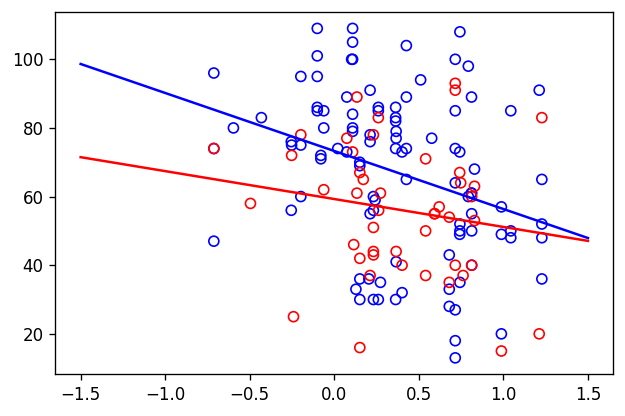

In [135]:
x1, y1, x2, y2 = XXX(ExpZ2Mat, NonCogSTRs, Male_LGD, Female_LGD)
plt.figure(dpi=120)
plt.scatter(x1, y1, label="male", edgecolors="blue", facecolors="None")
plt.scatter(x2, y2, label="female", edgecolors="red", facecolors="None")

xx = np.arange(-1.5, 1.6, 0.1)
ps = np.polyfit(x1, y1, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="blue")

ps = np.polyfit(x2, y2, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
r1, p1 = pearsonr(x1, y1)
print(r1, p1)
r2, p2 = pearsonr(x2, y2)
print(r2, p2)

0.004281035074263147 0.9754903918027462
-0.008502442678582115 0.9732890669928523


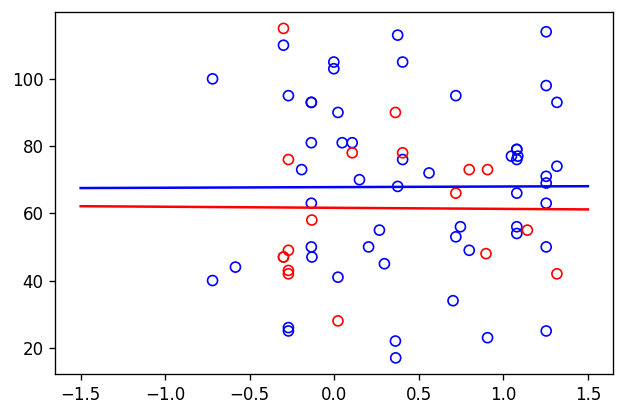

In [138]:
x1, y1, x2, y2 = XXX(ExpZ2Mat, CogSTRs, Male_Dmis, Female_Dmis)
plt.figure(dpi=120)
plt.scatter(x1, y1, label="male", edgecolors="blue", facecolors="None")
plt.scatter(x2, y2, label="female", edgecolors="red", facecolors="None")

xx = np.arange(-1.5, 1.6, 0.1)
ps = np.polyfit(x1, y1, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="blue")

ps = np.polyfit(x2, y2, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
r1, p1 = pearsonr(x1, y1)
print(r1, p1)
r2, p2 = pearsonr(x2, y2)
print(r2, p2)

0.026213814529973505 0.8507541096968776
0.3304415352407999 0.18047747857433713


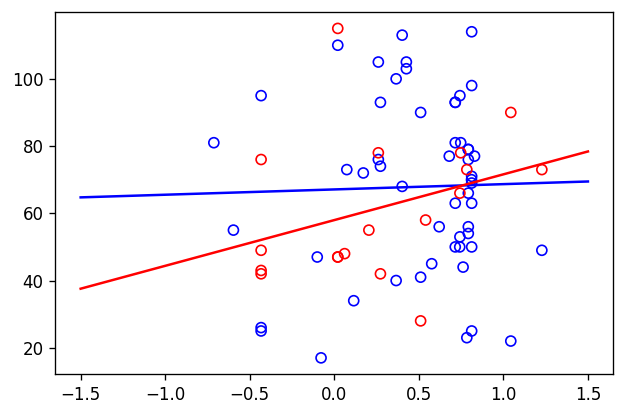

In [137]:
x1, y1, x2, y2 = XXX(ExpZ2Mat, NonCogSTRs, Male_Dmis, Female_Dmis)
plt.figure(dpi=120)
plt.scatter(x1, y1, label="male", edgecolors="blue", facecolors="None")
plt.scatter(x2, y2, label="female", edgecolors="red", facecolors="None")

xx = np.arange(-1.5, 1.6, 0.1)
ps = np.polyfit(x1, y1, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="blue")

ps = np.polyfit(x2, y2, deg=1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
r1, p1 = pearsonr(x1, y1)
print(r1, p1)
r2, p2 = pearsonr(x2, y2)
print(r2, p2)

# PDS

In [53]:
## 
PDS = pd.read_csv("../dat/Other/expr-pheno_LGD_MASTER_updated.csv")


###### Exp1

In [329]:
HighConfGenes

array(['POGZ', 'MECP2', 'SCN2A', 'PTEN', 'CHD2', 'DYRK1A', 'KDM5B',
       'FOXP1', 'KMT5B', 'ARID1B', 'ADNP', 'SYNGAP1', 'CHD8', 'SHANK3',
       'ASH1L', 'GIGYF1', 'SLC6A1', 'DNMT3A', 'GRIN2B', 'ASXL3', 'CUL3',
       'BRSK2', 'TAOK1', 'STXBP1', 'NF1', 'CTCF', 'RORB', 'MYT1L',
       'TBL1XR1', 'MED13L', 'KMT2A', 'TBR1', 'RFX3', 'ANK2', 'WAC',
       'PHF21A', 'SMARCC2', 'KDM6B', 'ARHGEF9', 'DDX3X', 'DYNC1H1',
       'ANKRD11', 'DEAF1', 'CNOT3', 'TCF20', 'SHANK2', 'TLK2', 'MARK2',
       'TCF4', 'NAA15', 'SETD5', 'CLCN4', 'KMT2C', 'EBF3', 'PPP2R5D',
       'KCNQ3', 'AUTS2', 'RAI1', 'TSC2', 'WDFY3', 'SRCAP'], dtype=object)

In [182]:
#PDS_rec = PDS[PDS["Times"]>=2]
#PDS_rec = PDS[PDS["Times"]>=1]
PDS_rec = PDS[PDS["Symbol"].isin(HighConfGenes)]

In [199]:
CogSTRs2 = IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]<0.05/46]["STR"].values
NonCogSTRs2 = IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]>0.05]["STR"].values

In [567]:
IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]<0.05/46]

,STR,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
2,Prelimbic_area,Isocortex,0.158651,0.605728,57,3,0.447078,-54,0.0009
6,Lateral_amygdalar_nucleus,Amygdalar,-0.044428,0.581396,136,6,0.625824,-130,0.0001
7,Claustrum,Cortical_subplate,0.114632,0.601793,75,4,0.487161,-71,0.0003
9,Infralimbic_area,Isocortex,0.087324,0.564669,81,7,0.477345,-74,0.0001
12,Anteromedial_visual_area,Isocortex,0.067253,0.512586,91,14,0.445333,-77,0.0002
17,Subiculum_ventral_part,Hippocampus,-0.032367,0.465211,127,25,0.497578,-102,0.0005
19,Field_CA1,Hippocampus,0.014274,0.591871,112,5,0.577598,-107,0.0003
25,Dorsal_peduncular_area,Olfactory_areas,0.016198,0.469850,110,24,0.453652,-86,0.0002
28,Anterior_cingulate_area_dorsal_part,Isocortex,0.065758,0.444821,92,28,0.379063,-64,0.0007
40,Orbital_area_medial_part,Isocortex,-0.098562,0.439206,147,30,0.537768,-117,0.0001


In [568]:
IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]> 0.05]

,STR,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
11,Dentate_gyrus,Hippocampus,0.375825,0.534774,7,12,0.158949,5,0.116688
14,Anterior_olfactory_nucleus,Olfactory_areas,0.528741,0.424888,2,34,-0.103852,32,0.765423
15,Anterior_pretectal_nucleus,Midbrain,0.471422,0.435046,5,31,-0.036376,26,0.591041
18,Retrosplenial_area_lateral_agranular_part,Isocortex,0.198464,0.419944,46,35,0.221480,-11,0.068893
21,Bed_nuclei_of_the_stria_terminalis,Pallidum,0.338946,0.480122,11,22,0.141176,11,0.093691
27,Lateral_septal_nucleus_rostral_rostroventral_part,Striatum,0.474932,0.359235,4,47,-0.115697,43,0.832617
29,Basomedial_amygdalar_nucleus,Amygdalar,0.198557,0.308510,45,59,0.109953,14,0.211179
32,Parataenial_nucleus,Thalamus,0.307828,0.449159,15,26,0.141332,11,0.160684
34,Agranular_insular_area_posterior_part,Isocortex,0.171844,0.363018,55,46,0.191174,-9,0.057294
35,Primary_somatosensory_area_trunk,Isocortex,0.150475,0.350079,60,49,0.199604,-11,0.052795


In [349]:
NonCogSTRs2.shape

(13,)

In [530]:
CIR_REGIONS_Dict["Isocortex"]

['Orbital_area_lateral_part',
 'Prelimbic_area',
 'Primary_somatosensory_area_lower_limb',
 'Orbital_area_ventrolateral_part',
 'Infralimbic_area',
 'Anteromedial_visual_area',
 'Retrosplenial_area_lateral_agranular_part',
 'Primary_visual_area',
 'Primary_motor_area',
 'Secondary_motor_area',
 'Anterior_cingulate_area_dorsal_part',
 'Posterior_parietal_association_areas',
 'Lateral_visual_area',
 'Agranular_insular_area_posterior_part',
 'Primary_somatosensory_area_trunk',
 'Gustatory_areas',
 'Agranular_insular_area_ventral_part',
 'Orbital_area_medial_part',
 'Anterior_cingulate_area_ventral_part']

In [348]:
CogSTRs2.shape

(12,)

In [345]:
XX = {}
Genes = []
PDS_values = []
CogBiases = []
NonCogBiases = []
for i, row in PDS_rec.iterrows():
    pds = row["Denom"]
    if pds != pds:
        continue
    symbol = row["Symbol"]
    if pds > 30:
        #continue
        print(symbol)
        continue
    try:
        entrez = int(GeneSymbol2Entrez[symbol])
        if entrez in XX:
            continue
        bias1 = ExpZ2Mat.loc[entrez, CogSTRs].mean()
        bias2 = ExpZ2Mat.loc[entrez, NonCogSTRs].mean()
        if bias1!= bias1 or bias2 != bias2:
            continue
        #bias1 = ExpZ2Mat.loc[entrez, CogSTRs2].mean()
        #bias2 = ExpZ2Mat.loc[entrez, NonCogSTRs2].mean()
        Genes.append(entrez)
        PDS_values.append(pds)
        CogBiases.append(bias1)
        NonCogBiases.append(bias2)
        XX[entrez] = 1
    except:
        continue

DDX3X
ANK2
ANK2
ANK2
PPP2R5D


Text(0.5, 1.0, 'r=0.38  p=0.035')

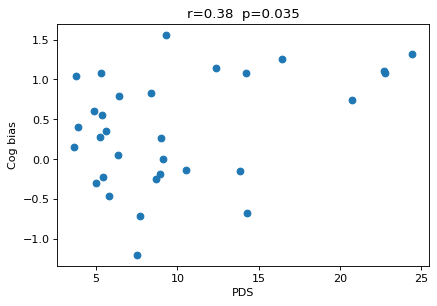

In [342]:
plt.scatter(PDS_values, CogBiases)
plt.xlabel("PDS")
plt.ylabel("Cog bias")
r, p = pearsonr(PDS_values, CogBiases)
plt.title("r=%.2f  p=%.3f"%(r,p))

Text(0.5, 1.0, 'r=0.21  p=0.256')

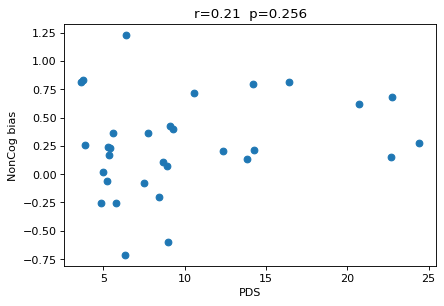

In [343]:
plt.scatter(PDS_values, NonCogBiases)
r, p = pearsonr(PDS_values, NonCogBiases)
plt.xlabel("PDS")
plt.ylabel("NonCog bias")
plt.title("r=%.2f  p=%.3f"%(r,p))

Text(0.5, 1.0, 'r=0.26  p=0.162')

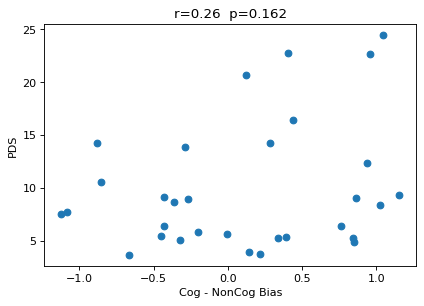

In [344]:
plt.scatter(np.array(CogBiases) - np.array(NonCogBiases), PDS_values)
r, p = pearsonr(np.array(CogBiases) - np.array(NonCogBiases), PDS_values)
plt.xlabel("Cog - NonCog Bias")
plt.ylabel("PDS")
plt.title("r=%.2f  p=%.3f"%(r,p))

In [336]:
## ANK2
## DDX3X
## PPP2R5D

##### Exp2

In [46]:
PDS2 = pd.read_csv("../../ASD_Phenotype/dat/PDS.ASC_SPARK_FSIQ.csv")
PDS2 = pd.read_csv("../../ASD_Phenotype/dat/PDS.ASC_SPARK_FSIQ.simplex+multiplex.csv")
PDS22 = pd.read_csv("../../ASD_Phenotype/dat/PDS.ASC_SPARK_FSIQ.FromJon.csv")
PDS2 = pd.read_csv("../../ASD_Phenotype/dat/PDS.ASC_SPARK_FSIQ.moregenes.csv")
#MoreGenes
PDS223 = pd.read_csv("../../ASD_Phenotype/dat/PDS.ASC_SPARK_FSIQ.FromJon.MoreGenes.csv")
PDS2.head(2)

,Unnamed: 0,Gene,PDS,P_PDS,RSQ
0,0,ANK2,9.437385,0.104597,0.403083
1,1,ARID1B,23.634218,0.010824,0.636467


In [47]:
IQ_PhenotypeDF = pd.read_csv("../dat/Unionize_bias/IQ_Bias_Diff.Pvalues.csv", index_col="STR")
IQ_PhenotypeDF = IQ_PhenotypeDF.sort_values("Pvalue")
IQ_PhenotypeDF.head(2)

,REG,HighIQ Bias,LowIQ Bias,HighIQ Rank,LowIQ Rank,Bias Diff (low-high),Rank Diff,Pvalue
STR,,,,,,,,
Lateral_amygdalar_nucleus,Amygdala,-0.044428,0.581396,136,6,0.625824,-130,0.0001
Orbital_area_medial_part,Isocortex,-0.098562,0.439206,147,30,0.537768,-117,0.0001


In [48]:
CogSTRs2 = IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]<0.05/46].index.values
NonCogSTRs2 = IQ_PhenotypeDF[IQ_PhenotypeDF["Pvalue"]>0.05].index.values
#NonCogSTRs2 = IQ_PhenotypeDF.tail(12).index.values

In [49]:
print(len(CogSTRs2), len(NonCogSTRs2))

12 13


In [50]:
PDS2[PDS2["Gene"]=="GRIN2B"]

,Unnamed: 0,Gene,PDS,P_PDS,RSQ
12,12,GRIN2B,41.930758,0.002906,0.991296


In [51]:
PDS22.loc[25,:] = [25, "GRIN2B", 41.9, 0.003, 0.99]
#PDS22["logP"] = -np.log10(PDS22["P_PDS"])
#PDS223.loc[50,:] = [50, "GRIN2B", 41.9, 0.003, 0.99]

In [52]:
set1 = set(PDS2["Gene"].values)
set2 = set(PDS22["Gene"].values)
print(set1.difference(set2))
print(set2.difference(set1))

{'PTEN', 'NRXN1', 'TRIP12', 'TCF7L2', 'DSCAM', 'CELF4', 'KDM5B', 'SHANK3', 'CTNNB1', 'SKI', 'EP300', 'GRIN2B'}
set()


In [53]:
PDS2.shape

(37, 5)

In [54]:
for i, row in PDS22.iterrows():
    #if row["P_PDS"] > 0.05:
    #    PDS2.loc[i, "PDS"] = row["PDS"] * 0.5
    if row["RSQ"] < 0:
        PDS22.loc[i, "RSQ"] = 0

In [55]:
PDS22_filt = PDS22[PDS22["P_PDS"]<0.05]

In [56]:
PDS22 = PDS22[PDS22["Gene"]!="POGZ"]

In [57]:
Genes = []
PDS_values = []
AllBiases = []
CogBiases = []
NonCogBiases = []
for i, row in PDS22.iterrows():
#for i, row in PDS22_filt.iterrows():
#for i, row in PDS2.iterrows():
    pds = row["RSQ"]
    #pds = row["logP"]
    symbol = row["Gene"]
    if symbol == "NRXN1":
        continue
    
    entrez = int(GeneSymbol2Entrez.get(symbol, -1))
    if entrez not in ExpZ2Mat.index.values:
        continue
    bias = ExpZ2Mat.loc[entrez, CIR_REGIONS_Dict["Isocortex"]].mean()
    bias1 = ExpZ2Mat.loc[entrez, CogSTRs2].mean()
    bias2 = ExpZ2Mat.loc[entrez, NonCogSTRs2].mean()
    Genes.append(entrez)
    PDS_values.append(pds)
    AllBiases.append(bias)
    CogBiases.append(bias1)
    NonCogBiases.append(bias2)
    if pds > 0.8 and bias1 - bias2 < 0:
        print(symbol, pds, bias1 - bias2)

KMT2A 0.9997935570269724 -0.1368112821824527
MYT1L 0.8703239226240663 -0.48733371553708565
NF1 0.8638652448596249 -0.1848750247116065
PHF21A 0.9541763489594296 -0.12429206942120666
WDFY3 0.9331315749943304 -0.8618087028681898


In [58]:
def ScatterNFit(X,Y, xlabel, ylabel, title=""):
    plt.scatter(X, Y, facecolors='none', edgecolors='black')
    ps = np.polyfit(X, Y, deg=1)
    xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
    plt.plot(xx, ps[1]+ps[0]*xx, color="red")
    plt.xlabel("Cog Bias")
    plt.ylabel("PDS")
    r, p = pearsonr(PDS_values, CogBiases)
    #plt.title("r=%.2f  p=%.3f"%(r,p))
    plt.title("")
    plt.show()

In [59]:
0.05/46

0.0010869565217391304

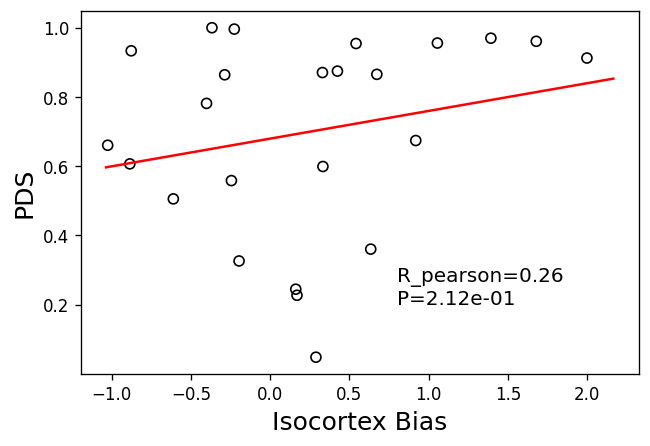

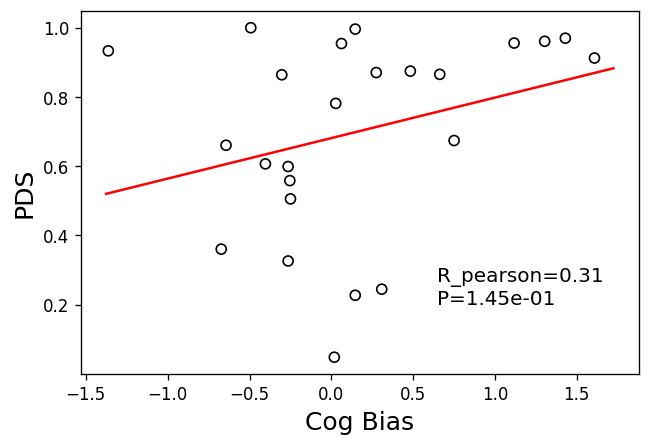

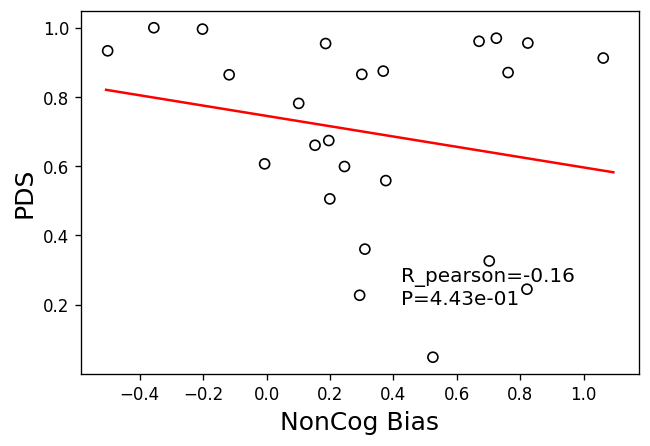

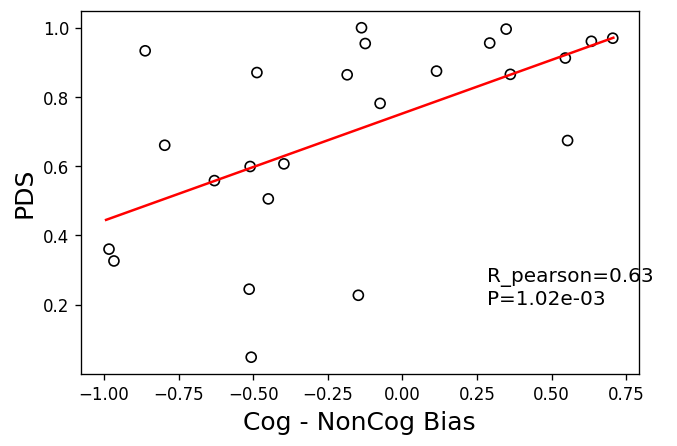

In [60]:
X, Y = AllBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Isocortex Bias", fontsize=15)
#plt.ylabel("PDS_RSQ", fontsize=15)
plt.ylabel("PDS", fontsize=15)
r, p = spearmanr(X, Y)
#print("R_pearson=%.2f  \nP=%.3f"%(r,p))
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = CogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog Bias", fontsize=15)
#plt.ylabel("PDS_RSQ", fontsize=15)
plt.ylabel("PDS", fontsize=15)
r, p = spearmanr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = NonCogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("NonCog Bias", fontsize=15)
#plt.ylabel("PDS_RSQ", fontsize=15)
plt.ylabel("PDS", fontsize=15)
r, p = spearmanr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = np.array(CogBiases) - np.array(NonCogBiases), PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog - NonCog Bias", fontsize=15)
#plt.ylabel("PDS_RSQ", fontsize=15)
plt.ylabel("PDS", fontsize=15)
r, p = spearmanr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

0.3069565217391304 0.1445678681051738


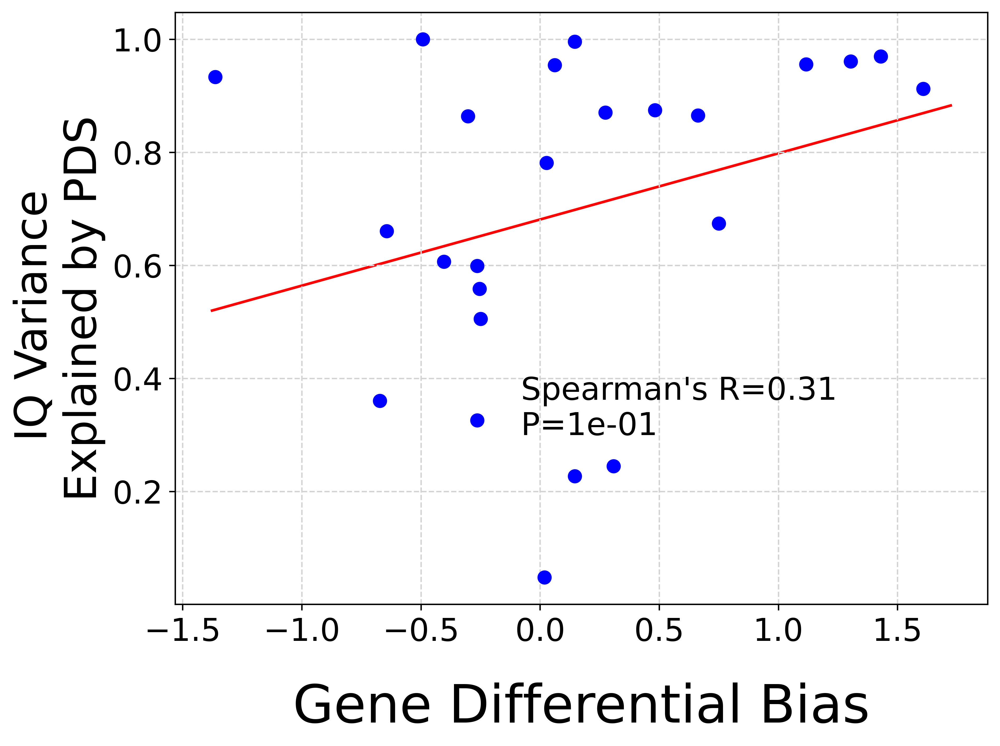

In [61]:
import matplotlib.pyplot as plt
import numpy as np

X = np.array(CogBiases) 
Y = PDS_values

fig, ax = plt.subplots(dpi=480, figsize=(8, 6))
ax.scatter(X, Y, facecolors='blue', edgecolors='blue', s=50, zorder=100)

ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
ax.plot(xx, ps[1]+ps[0]*xx, color="red", zorder=0)
ax.set_xlabel("Gene Differential Bias", fontsize=30)
ax.set_ylabel("IQ Variance \nExplained by PDS", fontsize=25)
r, p = pearsonr(X, Y)
r1, p1 = spearmanr(X, Y)
print(r1, p1)
#plt.text(max(X)*0.4, max(Y)*0.2, s="Pearson R=%.2f  \nP=%.1e"%(r,p), fontsize=12)
ax.text(max(X)*-0.05, max(Y)*0.3, s="Spearman's R=%.2f  \nP=%.0e"%(r1,p1), fontsize=18)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.xaxis.labelpad = 20

# Add grid lines
ax.grid(True, linestyle='--', color='lightgray')

# Save the plot to a file
plt.savefig('../figs/main/Fig5C.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.tight_layout()
plt.show()


0.6278260869565216 0.001021588885038587


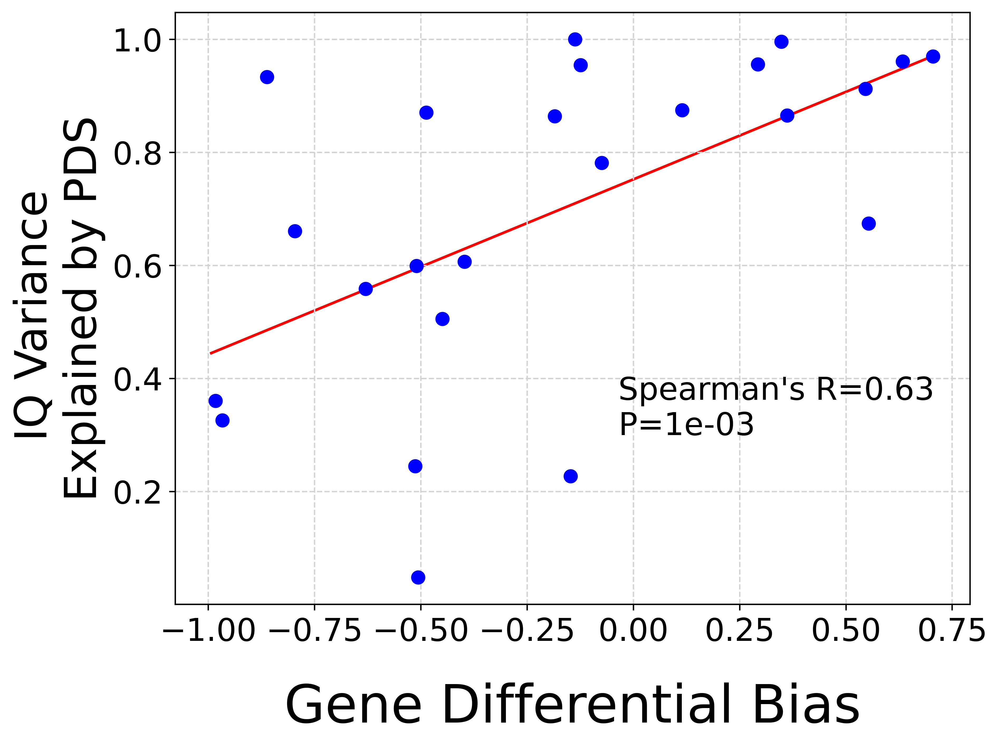

In [62]:
import matplotlib.pyplot as plt
import numpy as np

X = np.array(CogBiases) - np.array(NonCogBiases)
Y = PDS_values

fig, ax = plt.subplots(dpi=480, figsize=(8, 6))
ax.scatter(X, Y, facecolors='blue', edgecolors='blue', s=50, zorder=100)

ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
ax.plot(xx, ps[1]+ps[0]*xx, color="red", zorder=0)
ax.set_xlabel("Gene Differential Bias", fontsize=30)
ax.set_ylabel("IQ Variance \nExplained by PDS", fontsize=25)
r, p = pearsonr(X, Y)
r1, p1 = spearmanr(X, Y)
print(r1, p1)
#plt.text(max(X)*0.4, max(Y)*0.2, s="Pearson R=%.2f  \nP=%.1e"%(r,p), fontsize=12)
ax.text(max(X)*-0.05, max(Y)*0.3, s="Spearman's R=%.2f  \nP=%.0e"%(r1,p1), fontsize=18)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.xaxis.labelpad = 20

# Add grid lines
ax.grid(True, linestyle='--', color='lightgray')

# Save the plot to a file
plt.savefig('../figs/main/Fig5C.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.tight_layout()
plt.show()


In [63]:
PDS22["Bias.IQ.Sensitive"] = np.array(CogBiases)
PDS22["Bias.IQ.NoSensitive"] = np.array(NonCogBiases)
PDS22["Bias.Differetial"] = np.array(CogBiases) - np.array(NonCogBiases)

In [64]:
PDS22.to_excel("../dat/Supplementary_table_4.xlsx")

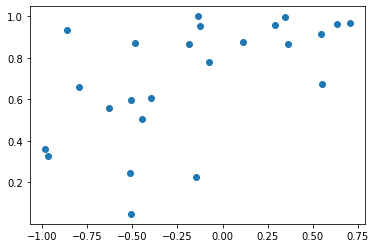

In [65]:
plt.scatter(PDS22["Bias.Differetial"], PDS22["RSQ"], )

In [44]:
spearmanr(PDS22["Bias.Differetial"], PDS22["RSQ"])

SpearmanrResult(correlation=0.633076923076923, pvalue=0.0006823166416151625)

In [213]:
entrez = 9378
bias1 = ExpZ2Mat.loc[entrez, CogSTRs2].mean()
bias2 = ExpZ2Mat.loc[entrez, NonCogSTRs2].mean()
print(bias1, bias2)

0.8367422081648707 0.29582984686881475


#### Neuro Norm Z2

In [577]:
#ExpZ2Mat_NN
# ExpLMat
XX = {}
Genes = []
PDS_values = []
AllBiases = []
CogBiases = []
NonCogBiases = []
for i, row in PDS2.iterrows():
    #pds = row["PDS"]
    pds = row["RSQ"]
    if pds != pds:
        continue
    symbol = row["Gene"]
    #if pds > 30:
        #continue
    #    print(symbol)
    #    continue
    try:
        entrez = int(GeneSymbol2Entrez[symbol])
        if entrez in XX:
            continue
        bias = ExpZ2Mat_NN.loc[entrez, CIR_REGIONS_Dict["Isocortex"]].mean()
        bias1 = ExpZ2Mat_NN.loc[entrez, CogSTRs2].mean()
        bias2 = ExpZ2Mat_NN.loc[entrez, NonCogSTRs2].mean()
        Genes.append(entrez)
        PDS_values.append(pds)
        AllBiases.append(bias)
        CogBiases.append(bias1)
        NonCogBiases.append(bias2)
        XX[entrez] = 1
    except:
        continue

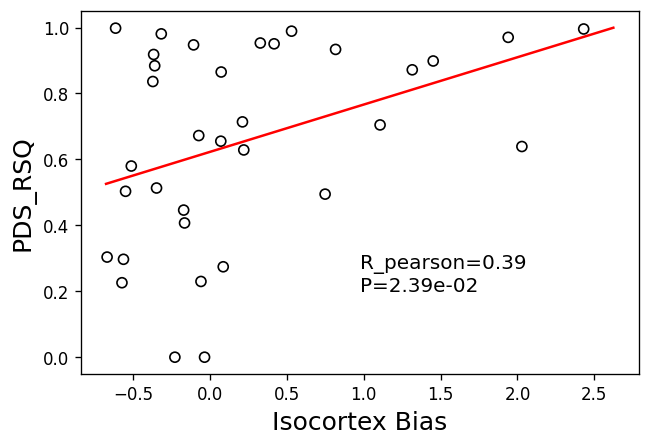

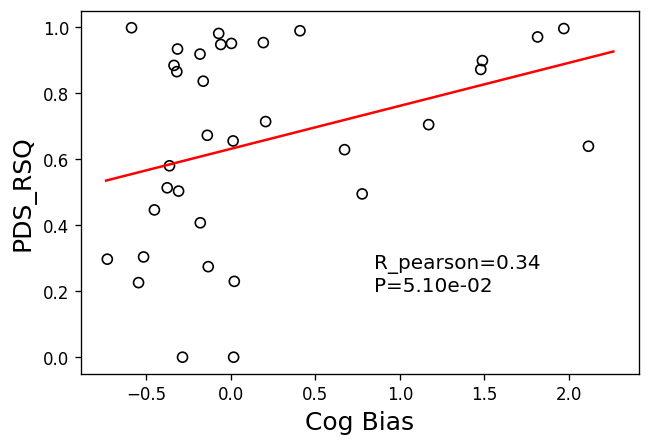

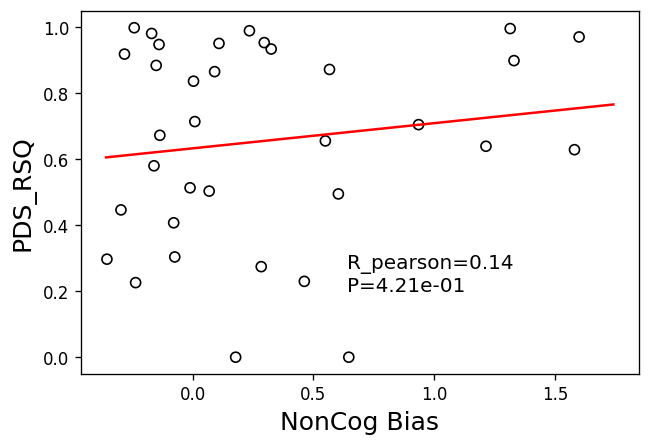

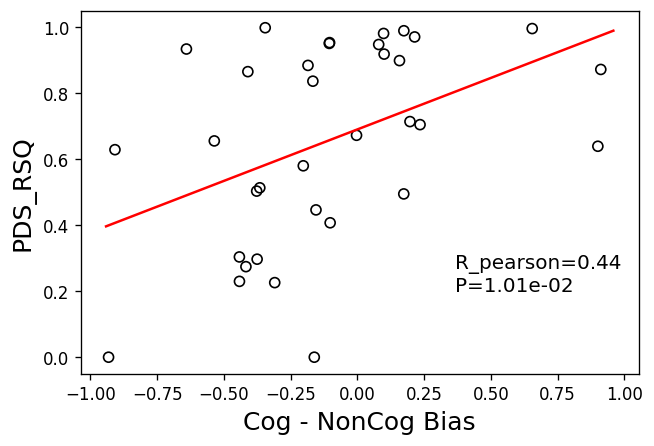

In [579]:
X, Y = AllBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Isocortex Bias", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
#print("R_pearson=%.2f  \nP=%.3f"%(r,p))
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = CogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog Bias", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = NonCogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("NonCog Bias", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = np.array(CogBiases) - np.array(NonCogBiases), PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog - NonCog Bias", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

#### ExpL

In [556]:
# ExpLMat
XX = {}
Genes = []
PDS_values = []
AllBiases = []
CogBiases = []
NonCogBiases = []
for i, row in PDS2.iterrows():
    #pds = row["PDS"]
    pds = row["RSQ"]
    if pds != pds:
        continue
    symbol = row["Gene"]
    #if pds > 30:
        #continue
    #    print(symbol)
    #    continue
    try:
        entrez = int(GeneSymbol2Entrez[symbol])
        if entrez in XX:
            continue
        #bias1 = ExpZ2Mat.loc[entrez, CogSTRs].mean()
        #bias2 = ExpZ2Mat.loc[entrez, NonCogSTRs].mean()
        #if bias1!= bias1 or bias2 != bias2:
        #    continue
        #bias = ExpZ2Mat.loc[entrez, ASD_Circuits].mean() #
        bias = ExpLMat.loc[entrez, CIR_REGIONS_Dict["Isocortex"]].mean()
        bias1 = ExpLMat.loc[entrez, CogSTRs2].mean()
        bias2 = ExpLMat.loc[entrez, NonCogSTRs2].mean()
        Genes.append(entrez)
        PDS_values.append(pds)
        AllBiases.append(bias)
        CogBiases.append(bias1)
        NonCogBiases.append(bias2)
        XX[entrez] = 1
    except:
        continue

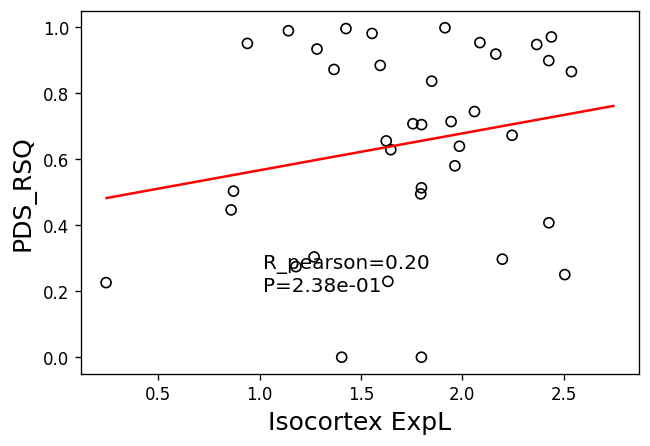

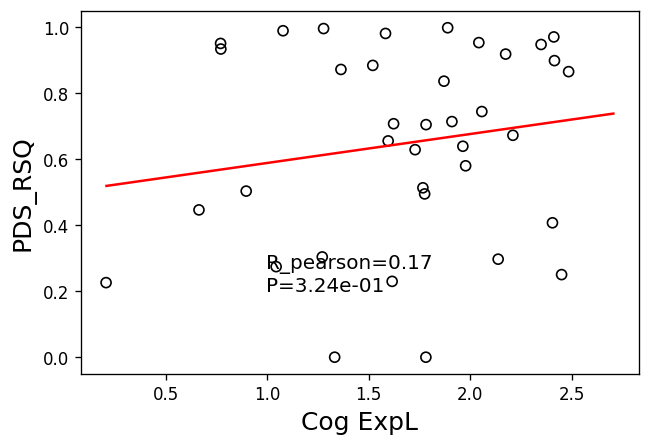

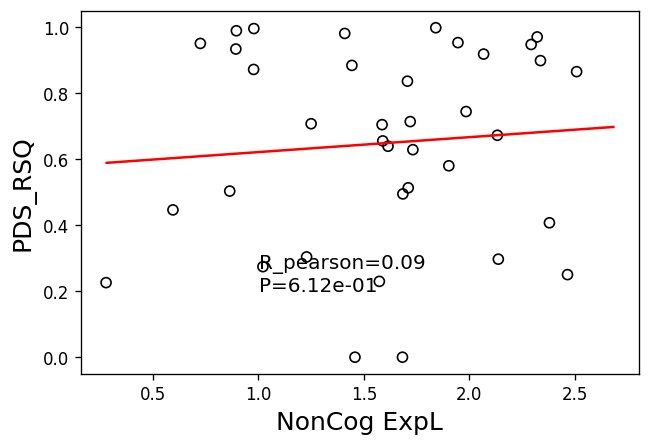

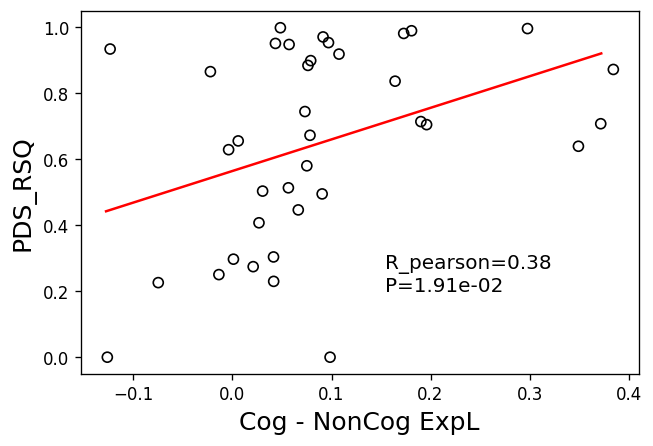

In [557]:
X, Y = AllBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Isocortex ExpL", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
#print("R_pearson=%.2f  \nP=%.3f"%(r,p))
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = CogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog ExpL", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = NonCogBiases, PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("NonCog ExpL", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

X, Y = np.array(CogBiases) - np.array(NonCogBiases), PDS_values
plt.figure(dpi=120)
plt.scatter(X, Y, facecolors='none', edgecolors='black')
ps = np.polyfit(X, Y, deg=1)
xx = np.arange(min(X)*1.01, max(X)*1.1, 0.1)
plt.plot(xx, ps[1]+ps[0]*xx, color="red")
plt.xlabel("Cog - NonCog ExpL", fontsize=15)
plt.ylabel("PDS_RSQ", fontsize=15)
r, p = pearsonr(X, Y)
plt.text(max(X)*0.4, max(Y)*0.2, s="R_pearson=%.2f  \nP=%.2e"%(r,p), fontsize=12)
#plt.ylim(0, 90)
plt.show()

#### Bias Difference Comparison

In [62]:
HighIQ_Male_GW = Mut2GeneDF(HighIQ_Male_Muts)
HighIQ_Male_Spec = AvgSTRZ_Weighted(ExpZ2Mat, HighIQ_Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_Male_spec.bias.csv")
HighIQ_Female_GW = Mut2GeneDF(HighIQ_Female_Muts)
HighIQ_Female_Spec = AvgSTRZ_Weighted(ExpZ2Mat, HighIQ_Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_Female_spec.bias.csv")
LowIQ_Male_GW = Mut2GeneDF(LowIQ_Male_Muts)
LowIQ_Male_Spec = AvgSTRZ_Weighted(ExpZ2Mat, LowIQ_Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_Male_spec.bias.csv")
LowIQ_Female_GW = Mut2GeneDF(LowIQ_Female_Muts)
LowIQ_Female_Spec = AvgSTRZ_Weighted(ExpZ2Mat, LowIQ_Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_Female_spec.bias.csv")

HighIQ_Male_Spec = HighIQ_Male_Spec.set_index("STR")
HighIQ_Female_Spec = HighIQ_Female_Spec.set_index("STR")
LowIQ_Male_Spec = LowIQ_Male_Spec.set_index("STR")
LowIQ_Female_Spec = LowIQ_Female_Spec.set_index("STR")

In [63]:
HighIQ_Male_Spec = HighIQ_Male_Spec.loc[ASD_Circuits,:]
HighIQ_Female_Spec = HighIQ_Female_Spec.loc[ASD_Circuits,:]
LowIQ_Male_Spec = LowIQ_Male_Spec.loc[ASD_Circuits,:]
LowIQ_Female_Spec = LowIQ_Female_Spec.loc[ASD_Circuits,:]

HighIQ_Male_Spec.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HighIQ_Female_Spec.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LowIQ_Male_Spec.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LowIQ_Female_Spec.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [64]:
CIR_REGIONS = ['Isocortex', 'Hippocampus', 
     'Cortical_subplate', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']
HIQ_Male_dat = []
HIQ_Female_dat = []
LIQ_Male_dat = []
LIQ_Female_dat = []
for REG in CIR_REGIONS:
    HIQ_Male_dat.append(HighIQ_Male_Spec[HighIQ_Male_Spec["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_dat.append(HighIQ_Female_Spec[HighIQ_Female_Spec["REGION"]==REG]["EFFECT"].mean())
    LIQ_Male_dat.append(LowIQ_Male_Spec[LowIQ_Male_Spec["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_dat.append(LowIQ_Female_Spec[LowIQ_Female_Spec["REGION"]==REG]["EFFECT"].mean())
HIQ_Male_dat = np.array(HIQ_Male_dat)
HIQ_Female_dat = np.array(HIQ_Female_dat)
LIQ_Male_dat = np.array(LIQ_Male_dat)
LIQ_Female_dat = np.array(LIQ_Female_dat)

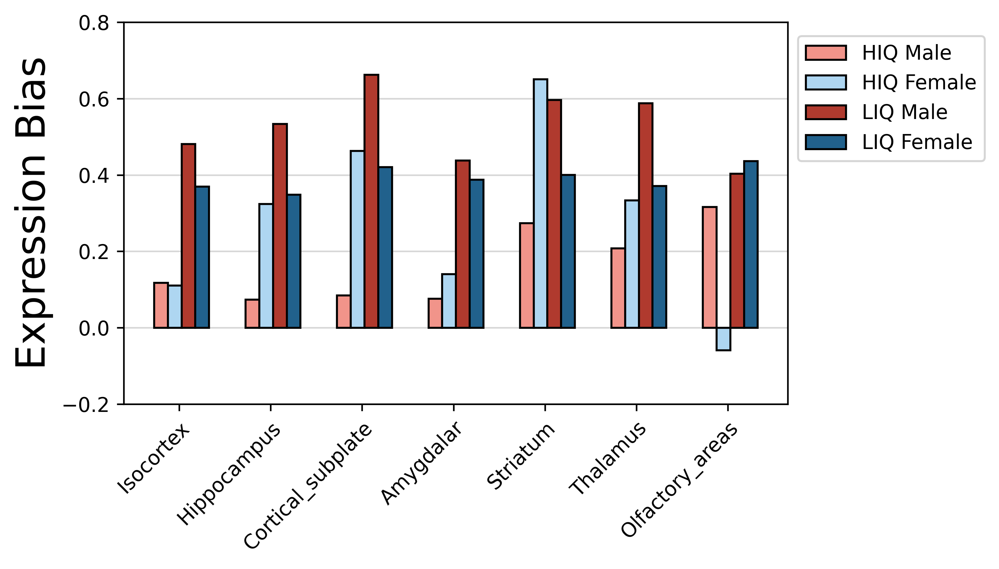

In [67]:
sort_idx = np.argsort(HIQ_Male_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_dat[sort_idx], color="#F1948A", width=0.15, label="HIQ Male", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_dat[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_dat[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_dat[sort_idx], color="#21618C", width=0.15, label="LIQ Female", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
plt.tight_layout()
ax.set_ylim(-0.2, 0.8)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

In [127]:
def PlotPhenotype(HIQ_Male_dat, HIQ_Female_dat, LIQ_Male_dat, LIQ_Female_dat, REG):
    X = np.arange(HIQ_Male_dat.shape[0])
    fig, ax = plt.subplots(dpi=120, figsize = (8+ LowIQ_dat.shape[0]/2, 6))
    ax.bar(X - 0.2, HIQ_Male_dat["EFFECT"], color="#F1948A", width=0.15, label="HIQ Male", 
           edgecolor ='black')
    ax.bar(X - 0.05, HIQ_Female_dat["EFFECT"], color="#AED6F1", width=0.15, label="HIQ Female", 
       edgecolor ='black', hatch="")

    ax.bar(X + 0.1, LIQ_Male_dat["EFFECT"], color="#B03A2E", width=0.15, label="LIQ Male", 
           edgecolor ='black')
    ax.bar(X + 0.25, LIQ_Female_dat["EFFECT"], color="#21618C", width=0.15, label="LIQ Female", 
       edgecolor ='black', hatch="")

    ax.set_xlabel('', fontweight ='bold', fontsize = 20)
    ax.set_ylabel('Expression Bias', fontsize = 20)
    plt.xticks(X, HIQ_Male_dat.index.values, rotation=45, fontsize=10, ha='right', rotation_mode="anchor")

    ax.legend(loc="upper left")
    plt.tight_layout()
    #ax.set_ylim(-0.1, 0.95)
    ax.grid(True, axis="y", alpha=0.5)
    ax.set_axisbelow(True)     
    plt.title(REG)
    plt.show()  

Isocortex


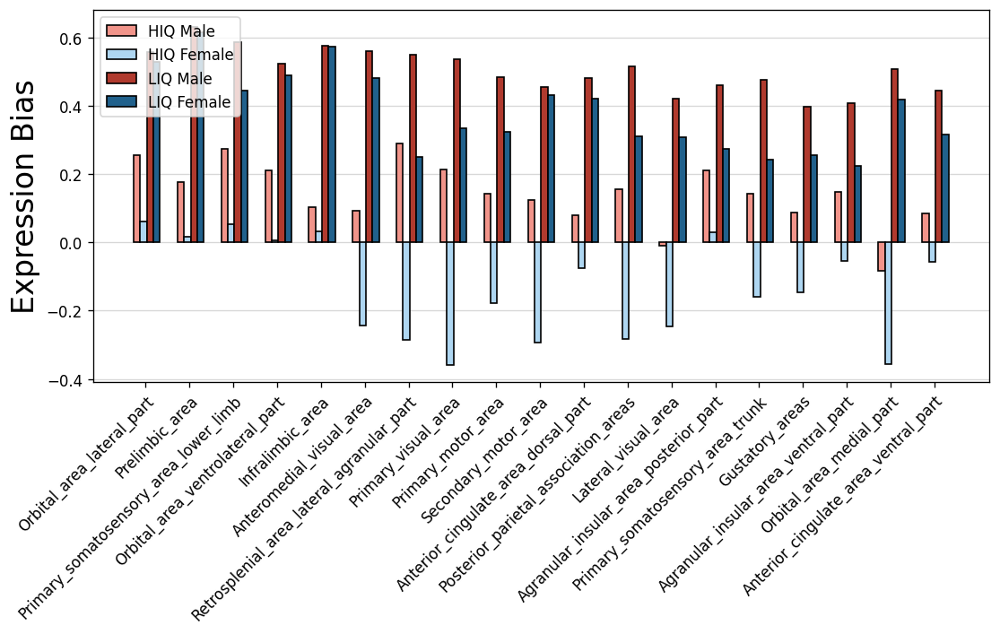

Hippocampus


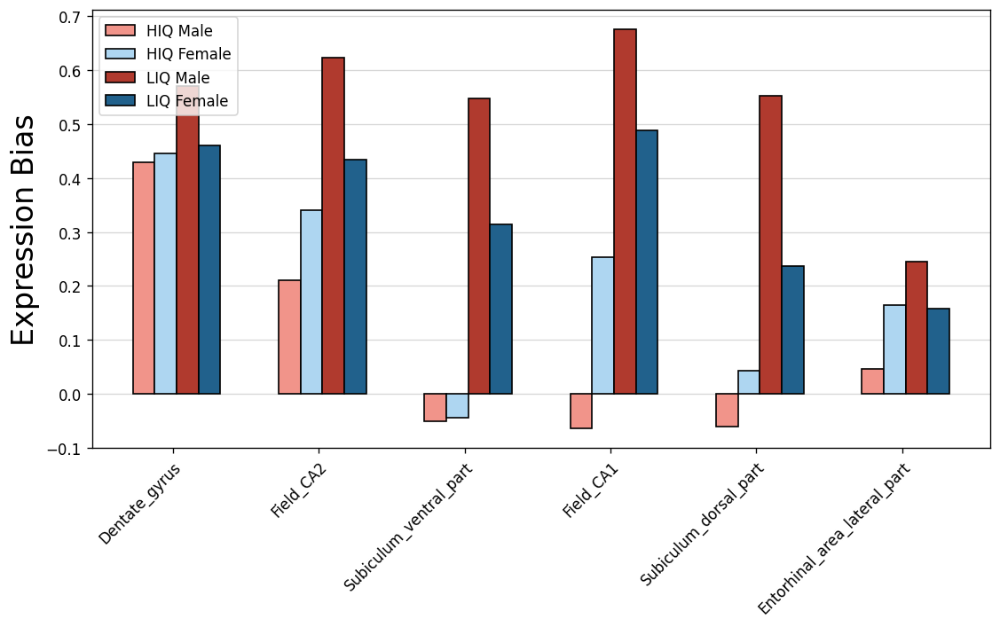

Cortical_subplate


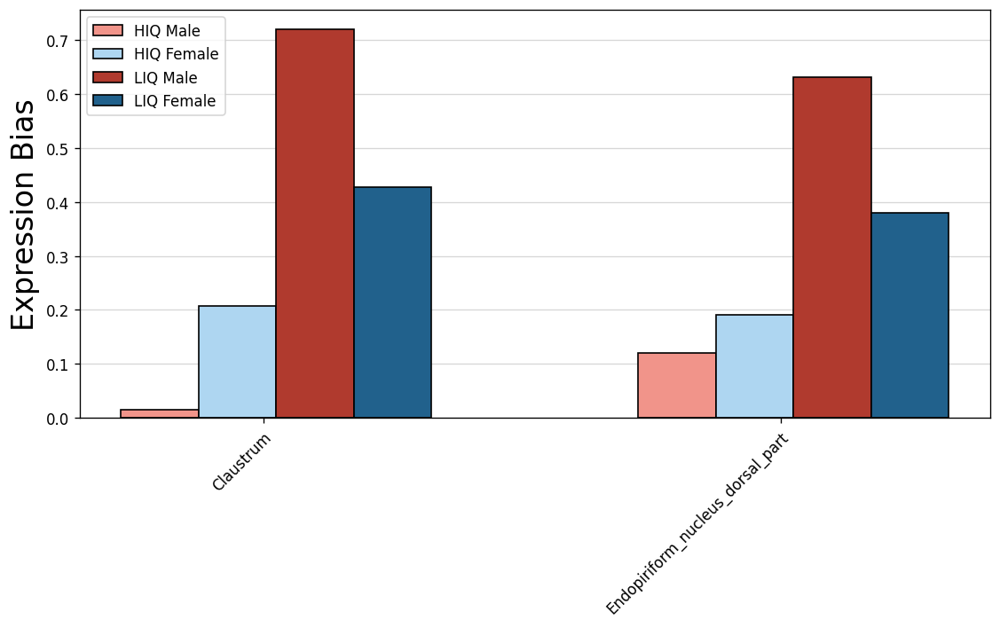

Amygdalar


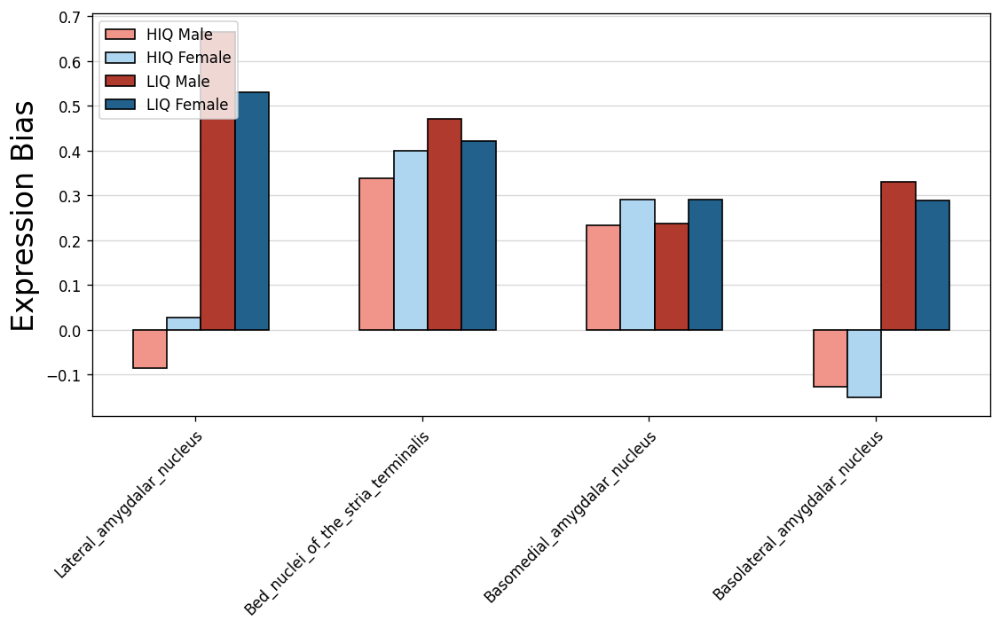

Striatum


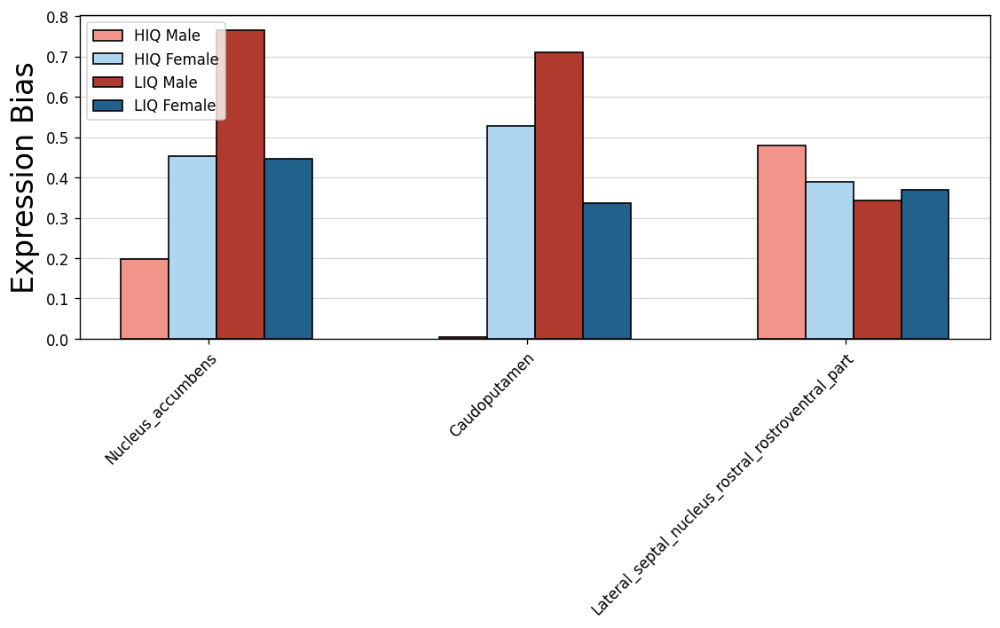

Thalamus


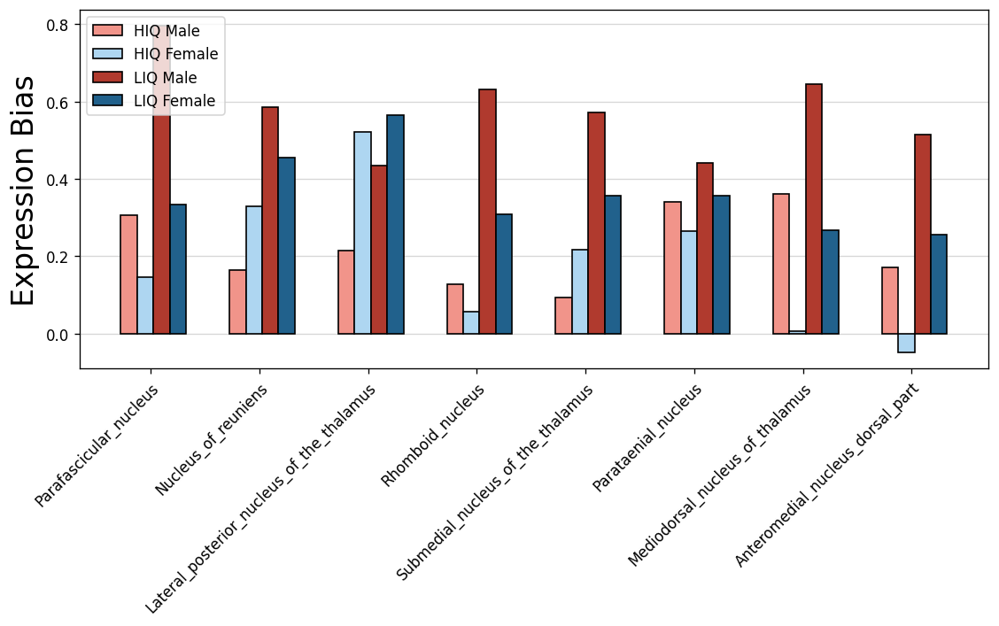

Olfactory_areas


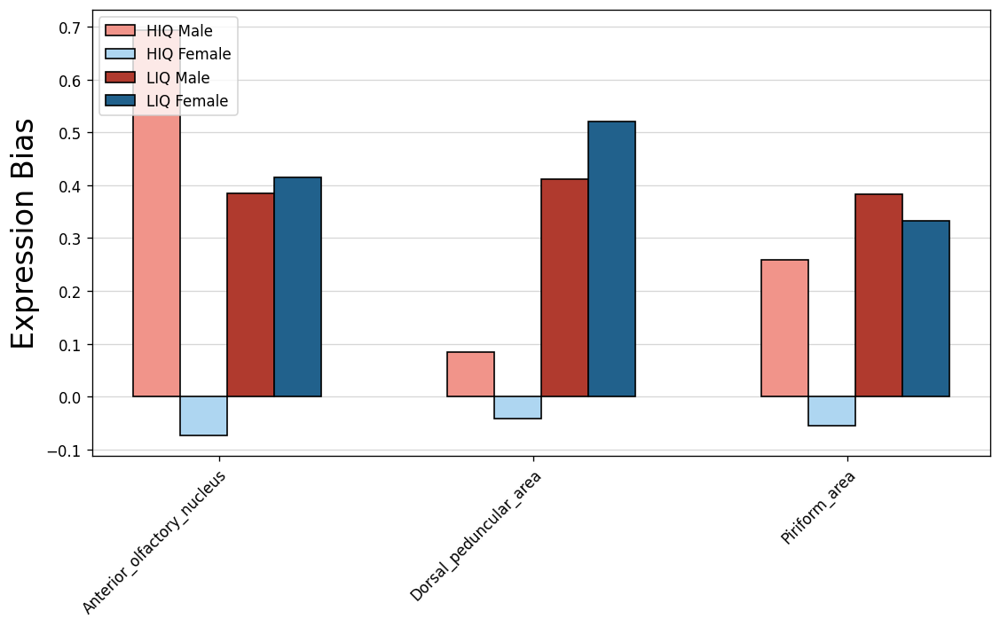

In [74]:
for REG in CIR_REGIONS:
    print(REG)
    HIQ_Male_dat = []
    HIQ_Female_dat = []
    LIQ_Male_dat = []
    LIQ_Female_dat = []
    HIQ_Male_dat = HighIQ_Male_Spec[HighIQ_Male_Spec["REGION"]==REG]
    HIQ_Female_dat = HighIQ_Female_Spec[HighIQ_Female_Spec["REGION"]==REG]
    LIQ_Male_dat = LowIQ_Male_Spec[LowIQ_Male_Spec["REGION"]==REG]
    LIQ_Female_dat = LowIQ_Female_Spec[LowIQ_Female_Spec["REGION"]==REG]
    PlotPhenotype(HIQ_Male_dat, HIQ_Female_dat, LIQ_Male_dat, LIQ_Female_dat, REG)

# Sex And MutType

In [49]:
HIQ_Male_GW = Mut2GeneDF(HighIQ_Male_Muts, LGD=True, Dmis=True) 
HIQ_Male_LGD_GW = Mut2GeneDF(HighIQ_Male_Muts, LGD=True, Dmis=False) 
HIQ_Male_Dmis_GW = Mut2GeneDF(HighIQ_Male_Muts, LGD=False, Dmis=True) 
HIQ_Female_GW = Mut2GeneDF(HighIQ_Female_Muts, LGD=True, Dmis=True) 
HIQ_Female_LGD_GW = Mut2GeneDF(HighIQ_Female_Muts, LGD=True, Dmis=False) 
HIQ_Female_Dmis_GW = Mut2GeneDF(HighIQ_Female_Muts, LGD=False, Dmis=True) 

HIQ_Male_ALL = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Male.ALL.bias.csv")
HIQ_Male_LGD = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Male_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Male.LGD.bias.csv")
HIQ_Male_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Male_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Male.Dmis.bias.csv")

HIQ_Female_ALL = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Female.ALL.bias.csv")
HIQ_Female_LGD = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Female_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Female.LGD.bias.csv")
HIQ_Female_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, HIQ_Female_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ.Female.Dmis.bias.csv")

HIQ_Male_ALL = HIQ_Male_ALL.set_index("STR")
HIQ_Male_LGD = HIQ_Male_LGD.set_index("STR")
HIQ_Male_Dmis = HIQ_Male_Dmis.set_index("STR")
HIQ_Female_ALL = HIQ_Female_ALL.set_index("STR")
HIQ_Female_LGD = HIQ_Female_LGD.set_index("STR")
HIQ_Female_Dmis = HIQ_Female_Dmis.set_index("STR")

In [50]:
LIQ_Male_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=True, Dmis=True) 
LIQ_Male_LGD_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=True, Dmis=False) 
LIQ_Male_Dmis_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=False, Dmis=True) 
LIQ_Female_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=True, Dmis=True) 
LIQ_Female_LGD_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=True, Dmis=False) 
LIQ_Female_Dmis_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=False, Dmis=True) 

LIQ_Male_ALL = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.ALL.bias.csv")
LIQ_Male_LGD = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.LGD.bias.csv")
LIQ_Male_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.Dmis.bias.csv")

LIQ_Female_ALL = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.ALL.bias.csv")
LIQ_Female_LGD = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.LGD.bias.csv")
LIQ_Female_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.Dmis.bias.csv")

LIQ_Male_ALL = LIQ_Male_ALL.set_index("STR")
LIQ_Male_LGD = LIQ_Male_LGD.set_index("STR")
LIQ_Male_Dmis = LIQ_Male_Dmis.set_index("STR")
LIQ_Female_ALL = LIQ_Female_ALL.set_index("STR")
LIQ_Female_LGD = LIQ_Female_LGD.set_index("STR")
LIQ_Female_Dmis = LIQ_Female_Dmis.set_index("STR")

In [51]:
HIQ_Male_ALL = HIQ_Male_ALL.loc[ASD_Circuits,:]
HIQ_Male_LGD = HIQ_Male_LGD.loc[ASD_Circuits,:]
HIQ_Male_Dmis = HIQ_Male_Dmis.loc[ASD_Circuits,:]
HIQ_Female_ALL = HIQ_Female_ALL.loc[ASD_Circuits,:]
HIQ_Female_LGD = HIQ_Female_LGD.loc[ASD_Circuits,:]
HIQ_Female_Dmis = HIQ_Female_Dmis.loc[ASD_Circuits,:]

HIQ_Male_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Male_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Male_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [52]:
LIQ_Male_ALL = LIQ_Male_ALL.loc[ASD_Circuits,:]
LIQ_Male_LGD = LIQ_Male_LGD.loc[ASD_Circuits,:]
LIQ_Male_Dmis = LIQ_Male_Dmis.loc[ASD_Circuits,:]
LIQ_Female_ALL = LIQ_Female_ALL.loc[ASD_Circuits,:]
LIQ_Female_LGD = LIQ_Female_LGD.loc[ASD_Circuits,:]
LIQ_Female_Dmis = LIQ_Female_Dmis.loc[ASD_Circuits,:]

LIQ_Male_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Male_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Male_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [53]:
HIQ_Male_BootDFs_ALL = []
HIQ_Male_BootDFs_LGD = []
HIQ_Male_BootDFs_Dmis = []
HIQ_Female_BootDFs_ALL = []
HIQ_Female_BootDFs_LGD = []
HIQ_Female_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Male/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Male/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Male/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    HIQ_Male_BootDFs_ALL.append(df1)
    HIQ_Male_BootDFs_LGD.append(df2)
    HIQ_Male_BootDFs_Dmis.append(df3)
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Female/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Female/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.HIQ.Female/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    HIQ_Female_BootDFs_ALL.append(df1)
    HIQ_Female_BootDFs_LGD.append(df2)
    HIQ_Female_BootDFs_Dmis.append(df3)

In [54]:
LIQ_Male_BootDFs_ALL = []
LIQ_Male_BootDFs_LGD = []
LIQ_Male_BootDFs_Dmis = []
LIQ_Female_BootDFs_ALL = []
LIQ_Female_BootDFs_LGD = []
LIQ_Female_BootDFs_Dmis = []
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Male/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Male/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Male/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    LIQ_Male_BootDFs_ALL.append(df1)
    LIQ_Male_BootDFs_LGD.append(df2)
    LIQ_Male_BootDFs_Dmis.append(df3)
for i in range(1,1001,1):
    df1 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Female/boot.bias.ALL.{}.csv'.format(i), index_col="STR")
    df2 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Female/boot.bias.LGD.{}.csv'.format(i), index_col="STR")
    df3 = pd.read_csv('../dat/Unionize_bias/Bootstrap/ASD.LIQ.Female/boot.bias.Dmis.{}.csv'.format(i), index_col="STR")
    LIQ_Female_BootDFs_ALL.append(df1)
    LIQ_Female_BootDFs_LGD.append(df2)
    LIQ_Female_BootDFs_Dmis.append(df3)

In [55]:
HIQ_Male_ALL_dat = []
HIQ_Male_LGD_dat = []
HIQ_Male_Dmis_dat = []
HIQ_Female_ALL_dat = []
HIQ_Female_LGD_dat = []
HIQ_Female_Dmis_dat = []
HIQ_Male_ALL_err = []
HIQ_Male_LGD_err = []
HIQ_Male_Dmis_err = []
HIQ_Female_ALL_err = []
HIQ_Female_LGD_err = []
HIQ_Female_Dmis_err = []
for REG in CIR_REGIONS:
    HIQ_Male_ALL_dat.append(HIQ_Male_ALL[HIQ_Male_ALL["REGION"]==REG]["EFFECT"].mean())
    HIQ_Male_LGD_dat.append(HIQ_Male_LGD[HIQ_Male_LGD["REGION"]==REG]["EFFECT"].mean())
    HIQ_Male_Dmis_dat.append(HIQ_Male_Dmis[HIQ_Male_Dmis["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_ALL_dat.append(HIQ_Female_ALL[HIQ_Female_ALL["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_LGD_dat.append(HIQ_Female_LGD[HIQ_Female_LGD["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_Dmis_dat.append(HIQ_Female_Dmis[HIQ_Female_Dmis["REGION"]==REG]["EFFECT"].mean())
    
    HIQ_Male_ALL_err.append(np.std(GetBootsDist(HIQ_Male_BootDFs_ALL, CIR_REGIONS_Dict[REG])))
    HIQ_Male_LGD_err.append(np.std(GetBootsDist(HIQ_Male_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    HIQ_Male_Dmis_err.append(np.std(GetBootsDist(HIQ_Male_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))
    HIQ_Female_ALL_err.append(np.std(GetBootsDist(HIQ_Female_BootDFs_ALL, CIR_REGIONS_Dict[REG])))
    HIQ_Female_LGD_err.append(np.std(GetBootsDist(HIQ_Female_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    HIQ_Female_Dmis_err.append(np.std(GetBootsDist(HIQ_Female_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))

HIQ_Male_ALL_dat = np.array(HIQ_Male_ALL_dat)
HIQ_Male_LGD_dat = np.array(HIQ_Male_LGD_dat)     
HIQ_Male_Dmis_dat = np.array(HIQ_Male_Dmis_dat)
HIQ_Female_ALL_dat = np.array(HIQ_Female_ALL_dat)     
HIQ_Female_LGD_dat = np.array(HIQ_Female_LGD_dat)     
HIQ_Female_Dmis_dat = np.array(HIQ_Female_Dmis_dat)     

HIQ_Male_ALL_err = np.array(HIQ_Male_ALL_err)
HIQ_Male_LGD_err = np.array(HIQ_Male_LGD_err)     
HIQ_Male_Dmis_err = np.array(HIQ_Male_Dmis_err)
HIQ_Female_ALL_err = np.array(HIQ_Female_ALL_err)     
HIQ_Female_LGD_err = np.array(HIQ_Female_LGD_err)     
HIQ_Female_Dmis_err = np.array(HIQ_Female_Dmis_err)

In [56]:
LIQ_Male_ALL_dat = []
LIQ_Male_LGD_dat = []
LIQ_Male_Dmis_dat = []
LIQ_Female_ALL_dat = []
LIQ_Female_LGD_dat = []
LIQ_Female_Dmis_dat = []
LIQ_Male_ALL_err = []
LIQ_Male_LGD_err = []
LIQ_Male_Dmis_err = []
LIQ_Female_ALL_err = []
LIQ_Female_LGD_err = []
LIQ_Female_Dmis_err = []
for REG in CIR_REGIONS:
    LIQ_Male_ALL_dat.append(LIQ_Male_ALL[LIQ_Male_ALL["REGION"]==REG]["EFFECT"].mean())
    LIQ_Male_LGD_dat.append(LIQ_Male_LGD[LIQ_Male_LGD["REGION"]==REG]["EFFECT"].mean())
    LIQ_Male_Dmis_dat.append(LIQ_Male_Dmis[LIQ_Male_Dmis["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_ALL_dat.append(LIQ_Female_ALL[LIQ_Female_ALL["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_LGD_dat.append(LIQ_Female_LGD[LIQ_Female_LGD["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_Dmis_dat.append(LIQ_Female_Dmis[LIQ_Female_Dmis["REGION"]==REG]["EFFECT"].mean())
    
    LIQ_Male_ALL_err.append(np.std(GetBootsDist(LIQ_Male_BootDFs_ALL, CIR_REGIONS_Dict[REG])))
    LIQ_Male_LGD_err.append(np.std(GetBootsDist(LIQ_Male_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    LIQ_Male_Dmis_err.append(np.std(GetBootsDist(LIQ_Male_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))
    LIQ_Female_ALL_err.append(np.std(GetBootsDist(LIQ_Female_BootDFs_ALL, CIR_REGIONS_Dict[REG])))
    LIQ_Female_LGD_err.append(np.std(GetBootsDist(LIQ_Female_BootDFs_LGD, CIR_REGIONS_Dict[REG])))
    LIQ_Female_Dmis_err.append(np.std(GetBootsDist(LIQ_Female_BootDFs_Dmis, CIR_REGIONS_Dict[REG])))

LIQ_Male_ALL_dat = np.array(LIQ_Male_ALL_dat)
LIQ_Male_LGD_dat = np.array(LIQ_Male_LGD_dat)     
LIQ_Male_Dmis_dat = np.array(LIQ_Male_Dmis_dat)
LIQ_Female_ALL_dat = np.array(LIQ_Female_ALL_dat)     
LIQ_Female_LGD_dat = np.array(LIQ_Female_LGD_dat)     
LIQ_Female_Dmis_dat = np.array(LIQ_Female_Dmis_dat)     

LIQ_Male_ALL_err = np.array(LIQ_Male_ALL_err)
LIQ_Male_LGD_err = np.array(LIQ_Male_LGD_err)     
LIQ_Male_Dmis_err = np.array(LIQ_Male_Dmis_err)
LIQ_Female_ALL_err = np.array(LIQ_Female_ALL_err)     
LIQ_Female_LGD_err = np.array(LIQ_Female_LGD_err)     
LIQ_Female_Dmis_err = np.array(LIQ_Female_Dmis_err)

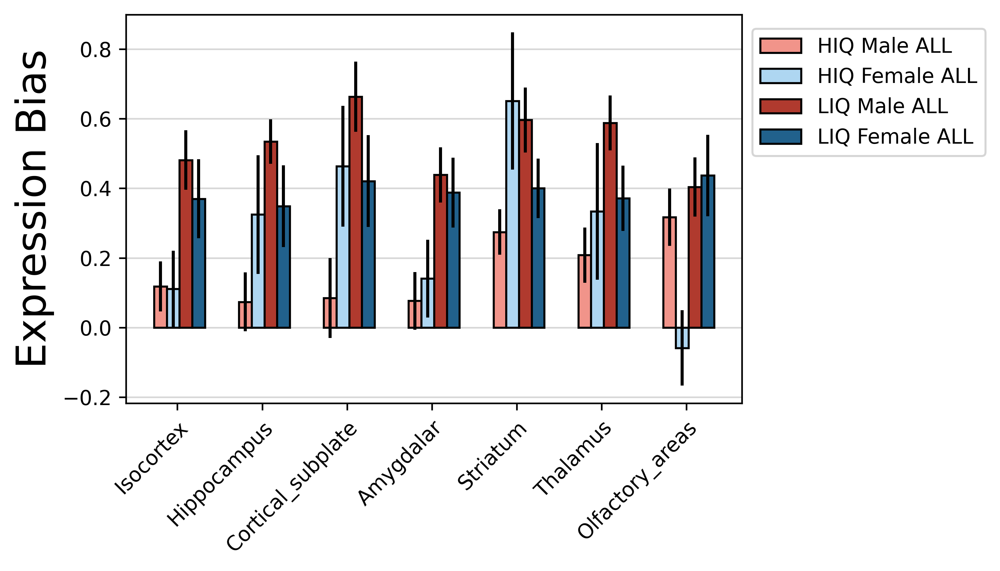

In [71]:
sort_idx = np.argsort(HIQ_Male_ALL_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_ALL_dat[sort_idx], yerr=HIQ_Male_ALL_err[sort_idx], color="#F1948A", width=0.15, label="HIQ Male ALL", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_ALL_dat[sort_idx], yerr=HIQ_Female_ALL_err[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female ALL", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_ALL_dat[sort_idx], yerr=LIQ_Male_ALL_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male ALL", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_ALL_dat[sort_idx], yerr=LIQ_Female_ALL_err[sort_idx], color="#21618C", width=0.15, label="LIQ Female ALL", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

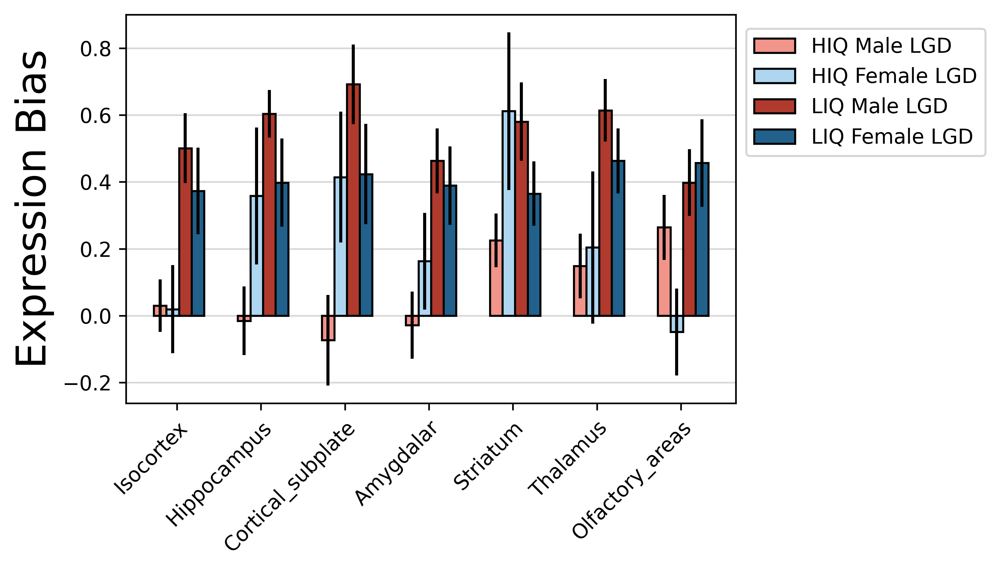

In [69]:
sort_idx = np.argsort(HIQ_Male_LGD_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_LGD_dat[sort_idx], yerr=HIQ_Male_LGD_err[sort_idx], color="#F1948A", width=0.15, label="HIQ Male LGD", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_LGD_dat[sort_idx], yerr=HIQ_Female_LGD_err[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female LGD", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_LGD_dat[sort_idx], yerr=LIQ_Male_LGD_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male LGD", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_LGD_dat[sort_idx], yerr=LIQ_Female_LGD_err[sort_idx], color="#21618C", width=0.15, label="LIQ Female LGD", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

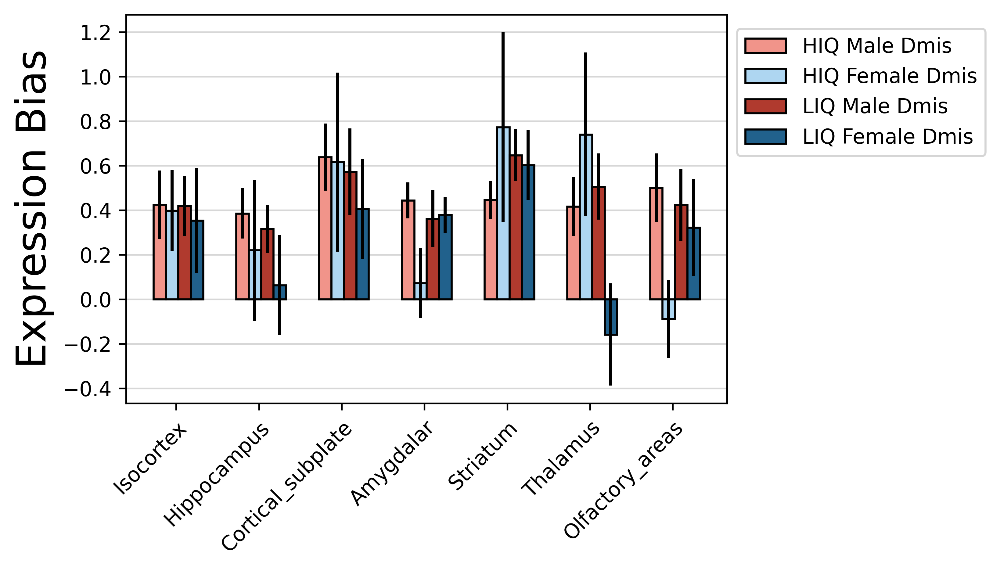

In [70]:
sort_idx = np.argsort(HIQ_Male_LGD_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_Dmis_dat[sort_idx], yerr=HIQ_Male_Dmis_err[sort_idx], color="#F1948A", width=0.15, label="HIQ Male Dmis", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_Dmis_dat[sort_idx], yerr=HIQ_Female_Dmis_err[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female Dmis", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_Dmis_dat[sort_idx], yerr=LIQ_Male_Dmis_err[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male Dmis", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_Dmis_dat[sort_idx], yerr=LIQ_Female_Dmis_err[sort_idx], color="#21618C", width=0.15, label="LIQ Female Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

### Test residue

In [82]:
ExpZ2Mat_Res = pd.read_csv("Z2.Residue.csv", index_col=0)

In [83]:
HIQ_Male_ALL = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Male_GW, 
                                 Method = 1)
HIQ_Male_LGD = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Male_LGD_GW, 
                                 Method = 1)
HIQ_Male_Dmis = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Male_Dmis_GW, 
                                 Method = 1)

HIQ_Female_ALL = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Female_GW, 
                                 Method = 1)
HIQ_Female_LGD = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Female_LGD_GW, 
                                 Method = 1)
HIQ_Female_Dmis = AvgSTRZ_Weighted(ExpZ2Mat_Res, HIQ_Female_Dmis_GW, 
                                 Method = 1)

HIQ_Male_ALL = HIQ_Male_ALL.set_index("STR")
HIQ_Male_LGD = HIQ_Male_LGD.set_index("STR")
HIQ_Male_Dmis = HIQ_Male_Dmis.set_index("STR")
HIQ_Female_ALL = HIQ_Female_ALL.set_index("STR")
HIQ_Female_LGD = HIQ_Female_LGD.set_index("STR")
HIQ_Female_Dmis = HIQ_Female_Dmis.set_index("STR")

In [84]:
LIQ_Male_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=True, Dmis=True) 
LIQ_Male_LGD_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=True, Dmis=False) 
LIQ_Male_Dmis_GW = Mut2GeneDF(LowIQ_Male_Muts, LGD=False, Dmis=True) 
LIQ_Female_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=True, Dmis=True) 
LIQ_Female_LGD_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=True, Dmis=False) 
LIQ_Female_Dmis_GW = Mut2GeneDF(LowIQ_Female_Muts, LGD=False, Dmis=True) 

LIQ_Male_ALL = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.ALL.bias.csv")
LIQ_Male_LGD = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.LGD.bias.csv")
LIQ_Male_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Male_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Male.Dmis.bias.csv")

LIQ_Female_ALL = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.ALL.bias.csv")
LIQ_Female_LGD = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_LGD_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.LGD.bias.csv")
LIQ_Female_Dmis = AvgSTRZ_Weighted(ExpZ2Mat, LIQ_Female_Dmis_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ.Female.Dmis.bias.csv")

LIQ_Male_ALL = LIQ_Male_ALL.set_index("STR")
LIQ_Male_LGD = LIQ_Male_LGD.set_index("STR")
LIQ_Male_Dmis = LIQ_Male_Dmis.set_index("STR")
LIQ_Female_ALL = LIQ_Female_ALL.set_index("STR")
LIQ_Female_LGD = LIQ_Female_LGD.set_index("STR")
LIQ_Female_Dmis = LIQ_Female_Dmis.set_index("STR")

In [85]:
HIQ_Male_ALL = HIQ_Male_ALL.loc[ASD_Circuits,:]
HIQ_Male_LGD = HIQ_Male_LGD.loc[ASD_Circuits,:]
HIQ_Male_Dmis = HIQ_Male_Dmis.loc[ASD_Circuits,:]
HIQ_Female_ALL = HIQ_Female_ALL.loc[ASD_Circuits,:]
HIQ_Female_LGD = HIQ_Female_LGD.loc[ASD_Circuits,:]
HIQ_Female_Dmis = HIQ_Female_Dmis.loc[ASD_Circuits,:]

HIQ_Male_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Male_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Male_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
HIQ_Female_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [86]:
LIQ_Male_ALL = LIQ_Male_ALL.loc[ASD_Circuits,:]
LIQ_Male_LGD = LIQ_Male_LGD.loc[ASD_Circuits,:]
LIQ_Male_Dmis = LIQ_Male_Dmis.loc[ASD_Circuits,:]
LIQ_Female_ALL = LIQ_Female_ALL.loc[ASD_Circuits,:]
LIQ_Female_LGD = LIQ_Female_LGD.loc[ASD_Circuits,:]
LIQ_Female_Dmis = LIQ_Female_Dmis.loc[ASD_Circuits,:]

LIQ_Male_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Male_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Male_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_ALL.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_LGD.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"
LIQ_Female_Dmis.loc["Bed_nuclei_of_the_stria_terminalis", "REGION"] = "Amygdalar"

In [87]:
HIQ_Male_ALL_dat = []
HIQ_Male_LGD_dat = []
HIQ_Male_Dmis_dat = []
HIQ_Female_ALL_dat = []
HIQ_Female_LGD_dat = []
HIQ_Female_Dmis_dat = []
for REG in CIR_REGIONS:
    HIQ_Male_ALL_dat.append(HIQ_Male_ALL[HIQ_Male_ALL["REGION"]==REG]["EFFECT"].mean())
    HIQ_Male_LGD_dat.append(HIQ_Male_LGD[HIQ_Male_LGD["REGION"]==REG]["EFFECT"].mean())
    HIQ_Male_Dmis_dat.append(HIQ_Male_Dmis[HIQ_Male_Dmis["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_ALL_dat.append(HIQ_Female_ALL[HIQ_Female_ALL["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_LGD_dat.append(HIQ_Female_LGD[HIQ_Female_LGD["REGION"]==REG]["EFFECT"].mean())
    HIQ_Female_Dmis_dat.append(HIQ_Female_Dmis[HIQ_Female_Dmis["REGION"]==REG]["EFFECT"].mean())

HIQ_Male_ALL_dat = np.array(HIQ_Male_ALL_dat)
HIQ_Male_LGD_dat = np.array(HIQ_Male_LGD_dat)     
HIQ_Male_Dmis_dat = np.array(HIQ_Male_Dmis_dat)
HIQ_Female_ALL_dat = np.array(HIQ_Female_ALL_dat)     
HIQ_Female_LGD_dat = np.array(HIQ_Female_LGD_dat)     
HIQ_Female_Dmis_dat = np.array(HIQ_Female_Dmis_dat)     

In [88]:
LIQ_Male_ALL_dat = []
LIQ_Male_LGD_dat = []
LIQ_Male_Dmis_dat = []
LIQ_Female_ALL_dat = []
LIQ_Female_LGD_dat = []
LIQ_Female_Dmis_dat = []
for REG in CIR_REGIONS:
    LIQ_Male_ALL_dat.append(LIQ_Male_ALL[LIQ_Male_ALL["REGION"]==REG]["EFFECT"].mean())
    LIQ_Male_LGD_dat.append(LIQ_Male_LGD[LIQ_Male_LGD["REGION"]==REG]["EFFECT"].mean())
    LIQ_Male_Dmis_dat.append(LIQ_Male_Dmis[LIQ_Male_Dmis["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_ALL_dat.append(LIQ_Female_ALL[LIQ_Female_ALL["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_LGD_dat.append(LIQ_Female_LGD[LIQ_Female_LGD["REGION"]==REG]["EFFECT"].mean())
    LIQ_Female_Dmis_dat.append(LIQ_Female_Dmis[LIQ_Female_Dmis["REGION"]==REG]["EFFECT"].mean())

LIQ_Male_ALL_dat = np.array(LIQ_Male_ALL_dat)
LIQ_Male_LGD_dat = np.array(LIQ_Male_LGD_dat)     
LIQ_Male_Dmis_dat = np.array(LIQ_Male_Dmis_dat)
LIQ_Female_ALL_dat = np.array(LIQ_Female_ALL_dat)     
LIQ_Female_LGD_dat = np.array(LIQ_Female_LGD_dat)     
LIQ_Female_Dmis_dat = np.array(LIQ_Female_Dmis_dat)     

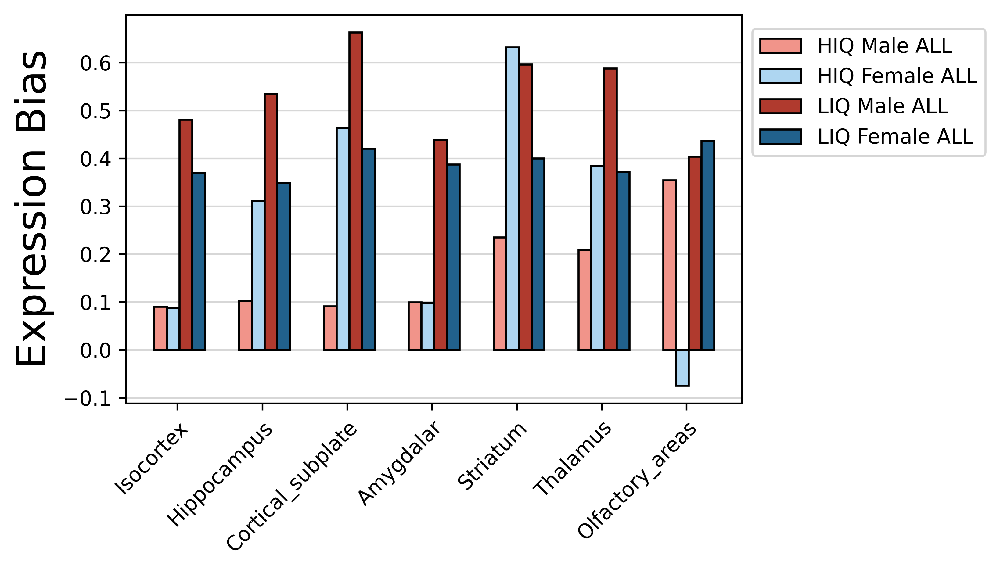

In [89]:
sort_idx = np.argsort(HIQ_Male_ALL_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_ALL_dat[sort_idx], color="#F1948A", width=0.15, label="HIQ Male ALL", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_ALL_dat[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female ALL", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_ALL_dat[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male ALL", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_ALL_dat[sort_idx], color="#21618C", width=0.15, label="LIQ Female ALL", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

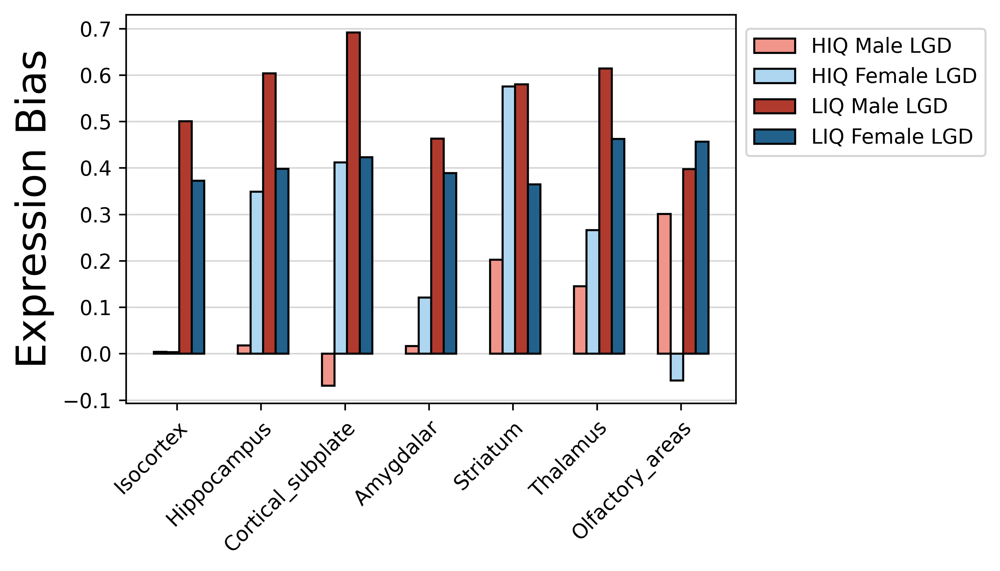

In [90]:
sort_idx = np.argsort(HIQ_Male_LGD_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_LGD_dat[sort_idx], color="#F1948A", width=0.15, label="HIQ Male LGD", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_LGD_dat[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female LGD", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_LGD_dat[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male LGD", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_LGD_dat[sort_idx], color="#21618C", width=0.15, label="LIQ Female LGD", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

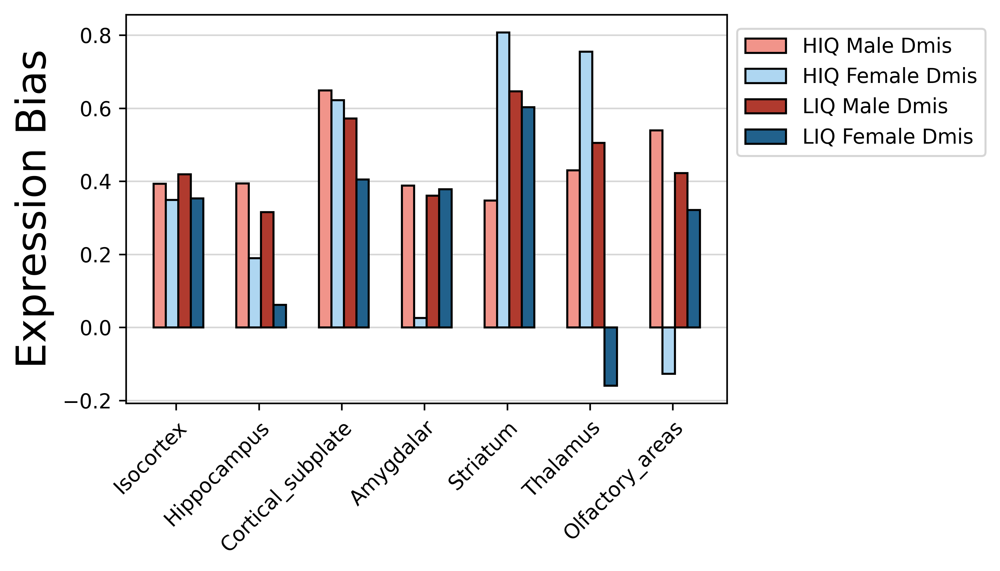

In [91]:
sort_idx = np.argsort(HIQ_Male_LGD_dat)
sort_idx = np.arange(7)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.2, HIQ_Male_Dmis_dat[sort_idx], color="#F1948A", width=0.15, label="HIQ Male Dmis", 
       edgecolor ='black')
ax.bar(X - 0.05, HIQ_Female_Dmis_dat[sort_idx], color="#AED6F1", width=0.15, label="HIQ Female Dmis", 
   edgecolor ='black', hatch="")

ax.bar(X + 0.1, LIQ_Male_Dmis_dat[sort_idx], color="#B03A2E", width=0.15, label="LIQ Male Dmis", 
       edgecolor ='black')
ax.bar(X + 0.25, LIQ_Female_Dmis_dat[sort_idx], color="#21618C", width=0.15, label="LIQ Female Dmis", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
  
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.8))
    
    
plt.tight_layout()
#ax.set_ylim(-0.2, 0.6)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)      

# Cell Types

In [197]:
CT_Z2_MAT = pd.read_csv("../dat/HumanCellType_Z2bias.csv", index_col=0)
CT_Z2_MAT2 = pd.read_csv("../dat/HumanCellType_Z2bias.brainspanMatch.csv", index_col=0)
Anno = pd.read_excel("../../data/HumanBrainCellType/annotation.xlsx", index_col="Cluster")

In [107]:
#set([x for x in Anno["Supercluster"].values if x==x])

In [108]:
CT_Z2_MAT.index = [int(GeneSymbol2Entrez.get(g, 0)) for g in CT_Z2_MAT.index.values]
#CT_Z2_MAT = CT_Z2_MAT[CT_Z2_MAT.index!=0]
CT_Z2_MAT.shape

(18852, 361)

In [199]:
def AnnotateCTDat(df, Anno):
    for i, row in df.iterrows():
        df.loc[i, "Supercluster"] = Anno.loc[int(i), "Supercluster"]
        df.loc[i, "Subtype"] = Anno.loc[int(i), "Subtype auto-annotation"]
        df.loc[i, "Neurotransmitter"] = Anno.loc[int(i), "Neurotransmitter auto-annotation"]
        df.loc[i, "Top three regions"] = Anno.loc[int(i), "Top three regions"]
        df.loc[i, "Top three dissections"] = Anno.loc[int(i), "Top three dissections"]
        df.loc[i, "Number of cells"] = Anno.loc[int(i), "Number of cells"] #Top three dissections
    return df

### High vs Low IQ

In [118]:
CT_HighIQ = AvgCTZ_Weighted(CT_Z2_MAT, HIQ_GW, Method = 1)
CT_HighIQ = CT_HighIQ.set_index("STR")
CT_HighIQ = AnnotateCTDat(CT_HighIQ, Anno)
CT_HighIQ.to_csv("test.ct.hiq.bias.csv")

CT_LowIQ = AvgCTZ_Weighted(CT_Z2_MAT, LIQ_GW, Method = 1)
CT_LowIQ = CT_LowIQ.set_index("STR")
CT_LowIQ = AnnotateCTDat(CT_LowIQ, Anno)
CT_LowIQ.to_csv("test.ct.liq.bias.csv")

In [200]:
CT_HighIQ = AvgCTZ_Weighted(CT_Z2_MAT2, HIQ_GW, Method = 1)
CT_HighIQ = CT_HighIQ.set_index("STR")
CT_HighIQ = AnnotateCTDat(CT_HighIQ, Anno)
CT_HighIQ.to_csv("test.ct.hiq.bias.v2.csv")

CT_LowIQ = AvgCTZ_Weighted(CT_Z2_MAT2, LIQ_GW, Method = 1)
CT_LowIQ = CT_LowIQ.set_index("STR")
CT_LowIQ = AnnotateCTDat(CT_LowIQ, Anno)
CT_LowIQ.to_csv("test.ct.liq.bias.v2.csv")

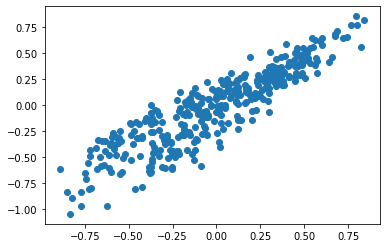

In [201]:
res = CT_LowIQ.join(CT_HighIQ, how = 'inner', lsuffix="_liq", rsuffix="_hiq")
res["l-h Diff"] = res["EFFECT_liq"] - res["EFFECT_hiq"]
res.to_csv("CT_IQ.csv")
plt.scatter(res["EFFECT_liq"].values, res["EFFECT_hiq"].values)

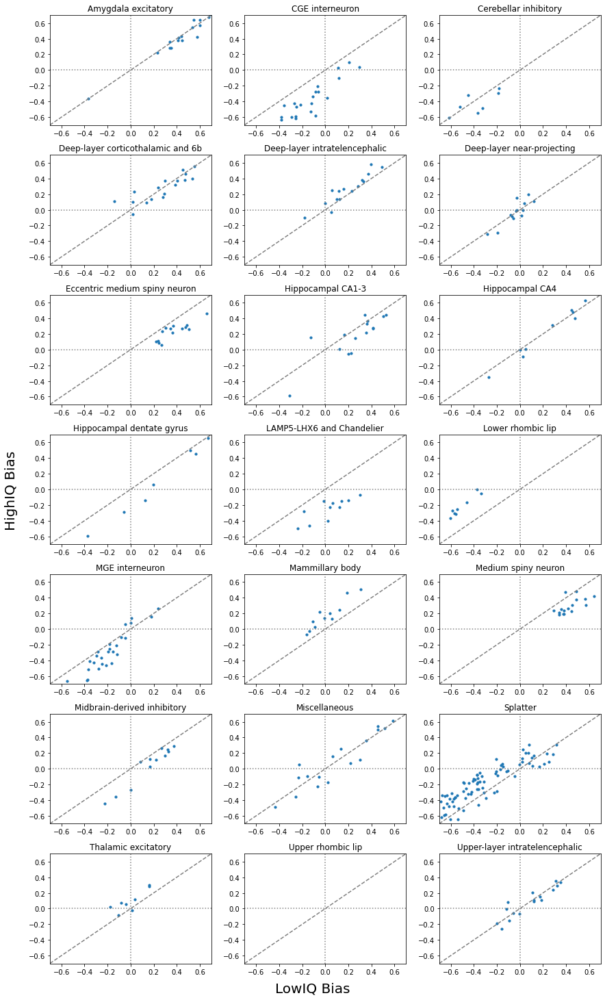

In [202]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = sorted(list(set(CT_HighIQ["Supercluster"])))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res[res["Supercluster_hiq"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_liq"].values, tmp["EFFECT_hiq"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'LowIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'HighIQ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_IQDIFF_Human_CT.v2.pdf", bbox_inches="tight")

### Split Mut Type

In [90]:
CT_HighIQ_Dmis = AvgCTZ_Weighted(CT_Z2_MAT, HIQ_GW_Dmis, Method = 1)
CT_HighIQ_Dmis = CT_HighIQ_Dmis.set_index("STR")
CT_HighIQ_Dmis = AnnotateCTDat(CT_HighIQ_Dmis, Anno)
CT_HighIQ_Dmis.to_csv("test.ct.hiq.Dmis.bias.csv")

CT_LowIQ_Dmis = AvgCTZ_Weighted(CT_Z2_MAT, LIQ_GW_Dmis, Method = 1)
CT_LowIQ_Dmis = CT_LowIQ_Dmis.set_index("STR")
CT_LowIQ_Dmis = AnnotateCTDat(CT_LowIQ_Dmis, Anno)
CT_LowIQ_Dmis.to_csv("test.ct.liq.Dmis.bias.csv")

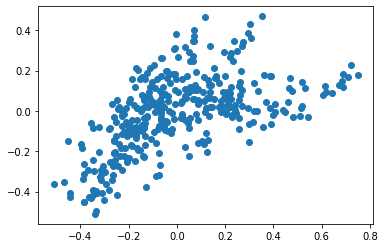

In [91]:
res = CT_LowIQ_Dmis.join(CT_HighIQ_Dmis, how = 'inner', lsuffix="_liq", rsuffix="_hiq")
res.to_csv("CT_IQ.Dmis.csv")
plt.scatter(res["EFFECT_liq"].values, res["EFFECT_hiq"].values)

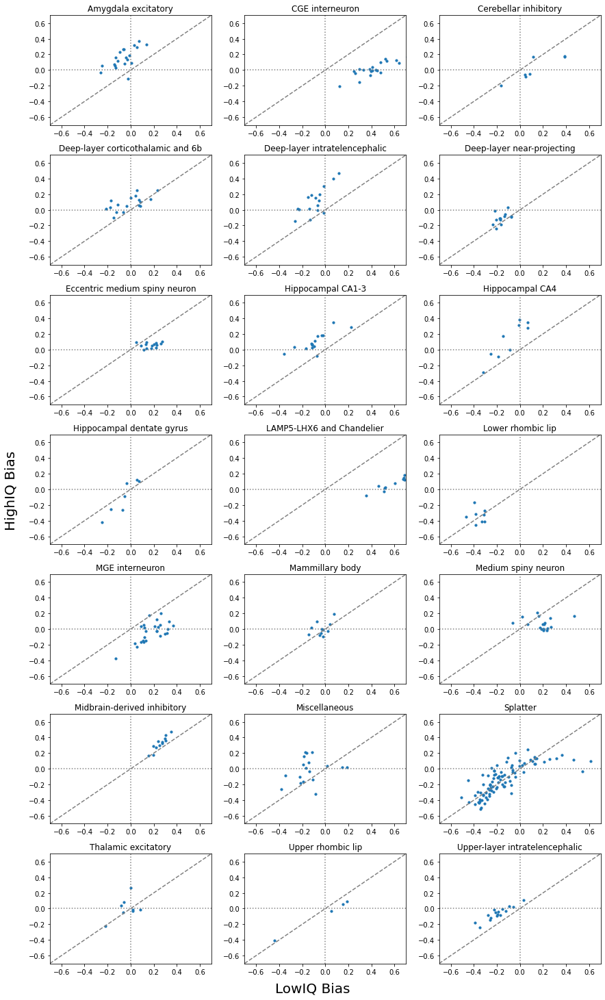

In [101]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = sorted(list(set(CT_HighIQ_Dmis["Supercluster"])))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res[res["Supercluster_hiq"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_liq"].values, tmp["EFFECT_hiq"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'LowIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'HighIQ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_IQDIFF_Human_CT.Dmis.pdf", bbox_inches="tight")

In [102]:
CT_HighIQ_LGD = AvgCTZ_Weighted(CT_Z2_MAT, HIQ_GW_LGD, Method = 1)
CT_HighIQ_LGD = CT_HighIQ_LGD.set_index("STR")
CT_HighIQ_LGD = AnnotateCTDat(CT_HighIQ_LGD, Anno)
CT_HighIQ_LGD.to_csv("test.ct.hiq.LGD.bias.csv")

CT_LowIQ_LGD = AvgCTZ_Weighted(CT_Z2_MAT, LIQ_GW_LGD, Method = 1)
CT_LowIQ_LGD = CT_LowIQ_LGD.set_index("STR")
CT_LowIQ_LGD = AnnotateCTDat(CT_LowIQ_LGD, Anno)
CT_LowIQ_LGD.to_csv("test.ct.liq.LGD.bias.csv")

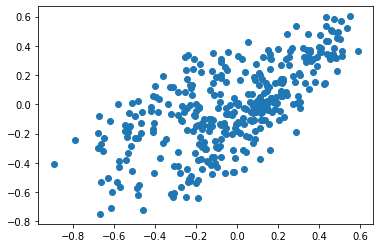

In [103]:
res = CT_LowIQ_LGD.join(CT_HighIQ_LGD, how = 'inner', lsuffix="_liq", rsuffix="_hiq")
res.to_csv("CT_IQ.LGD.csv")
plt.scatter(res["EFFECT_liq"].values, res["EFFECT_hiq"].values)

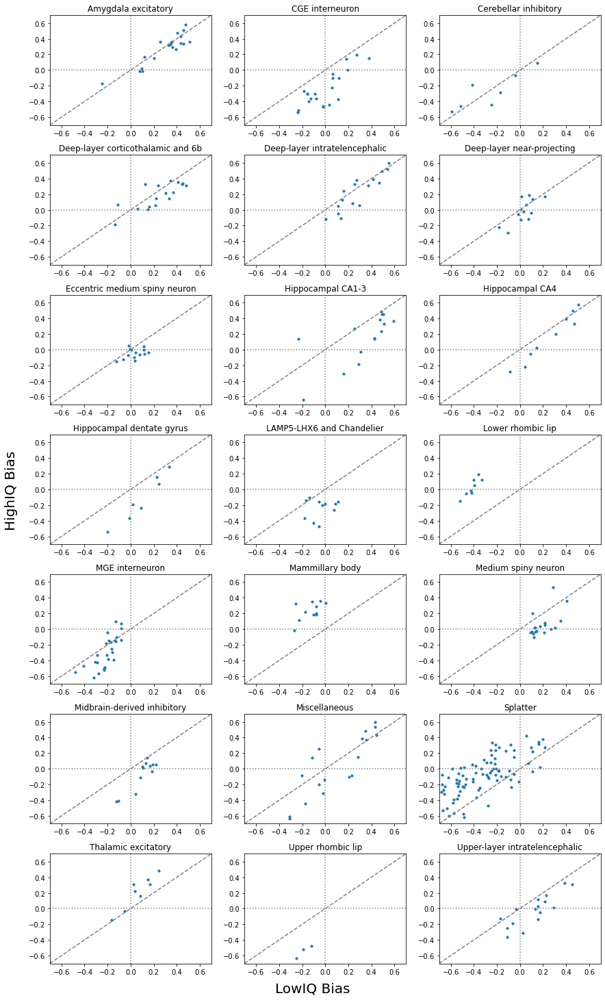

In [104]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = sorted(list(set(CT_HighIQ_LGD["Supercluster"])))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res[res["Supercluster_hiq"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_liq"].values, tmp["EFFECT_hiq"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'LowIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'HighIQ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_IQDIFF_Human_CT.LGD.pdf", bbox_inches="tight")

In [226]:
## SCZ to HighIQ
SCZ_Z2 = pd.read_csv("test.ct.scz.z2.bias.csv", index_col="STR")
SCZ_Z2.index = SCZ_Z2.index.astype(str)

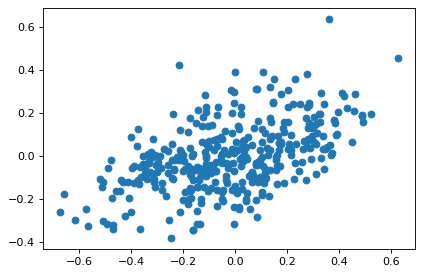

In [227]:
res2 = CT_HighIQ_Z2.join(SCZ_Z2, how = 'inner', lsuffix="_hiq", rsuffix="_scz")
plt.scatter(res2["EFFECT_hiq"].values, res2["EFFECT_scz"].values)

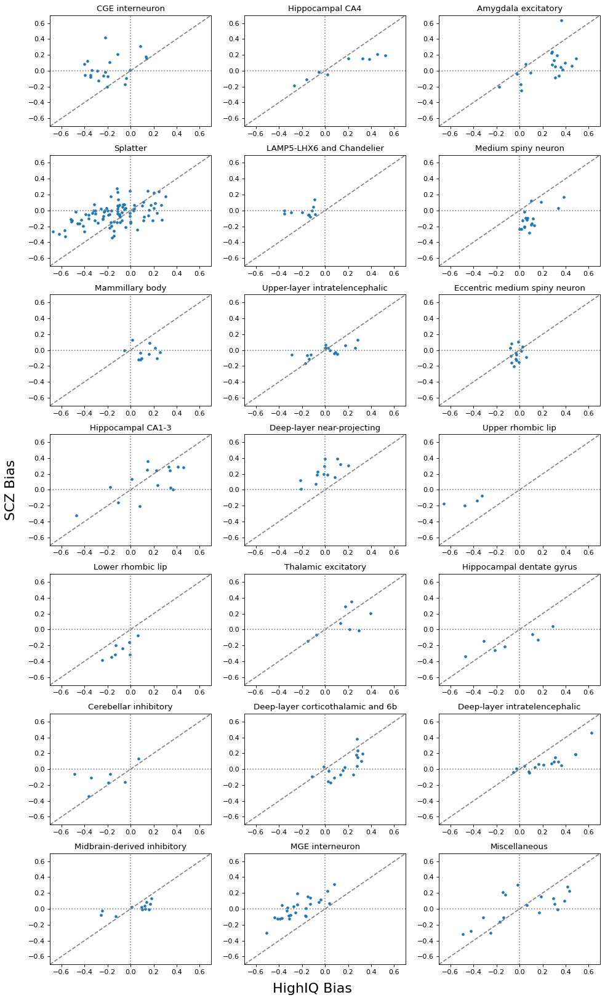

In [231]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = list(set(CT_LowIQ_Z2["Supercluster"]))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res2[res2["Supercluster_hiq"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_hiq"].values, tmp["EFFECT_scz"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'HighIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'SCZ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_HIQ_SCZ_Human_CT.pdf", bbox_inches="tight")

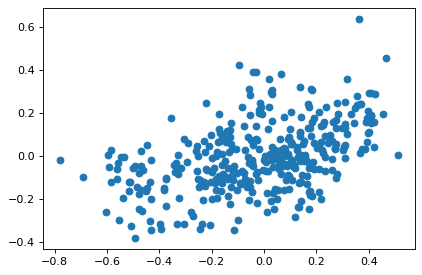

In [233]:
res3 = CT_LowIQ_Z2.join(SCZ_Z2, how = 'inner', lsuffix="_liq", rsuffix="_scz")
plt.scatter(res2["EFFECT_liq"].values, res2["EFFECT_scz"].values)

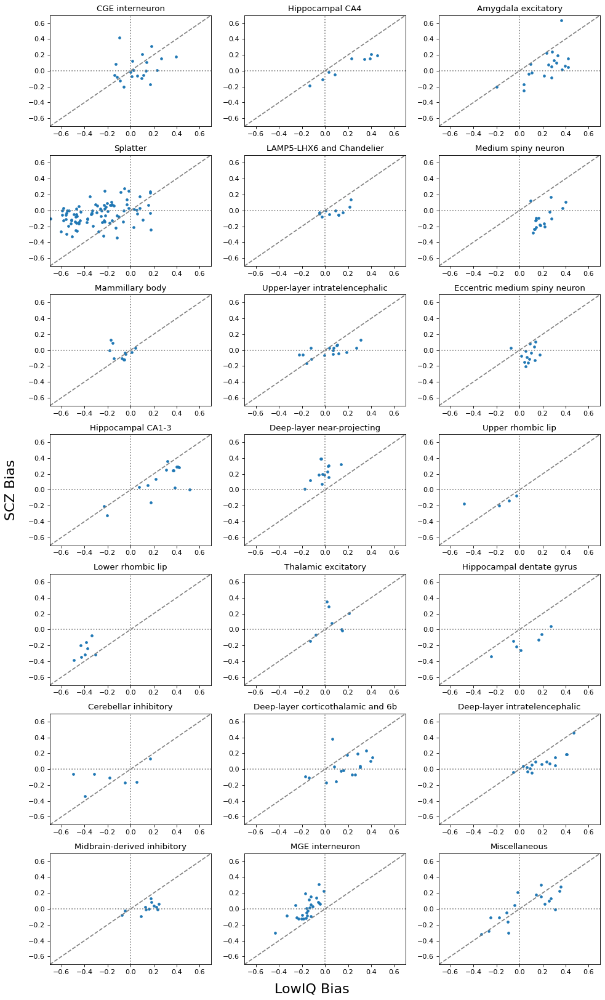

In [235]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = list(set(CT_LowIQ_Z2["Supercluster"]))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res3[res3["Supercluster_liq"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_liq"].values, tmp["EFFECT_scz"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'LowIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'SCZ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_LIQ_SCZ_Human_CT.pdf", bbox_inches="tight")

In [237]:
ASD_Z2 = pd.read_csv("test.ct.z2.bias.csv", index_col="STR")
ASD_Z2.index = ASD_Z2.index.astype(str)

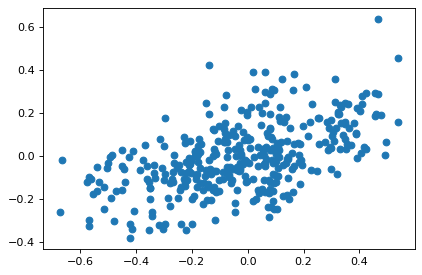

In [238]:
res4 = ASD_Z2.join(SCZ_Z2, how = 'inner', lsuffix="_asd", rsuffix="_scz")
plt.scatter(res4["EFFECT_asd"].values, res4["EFFECT_scz"].values)

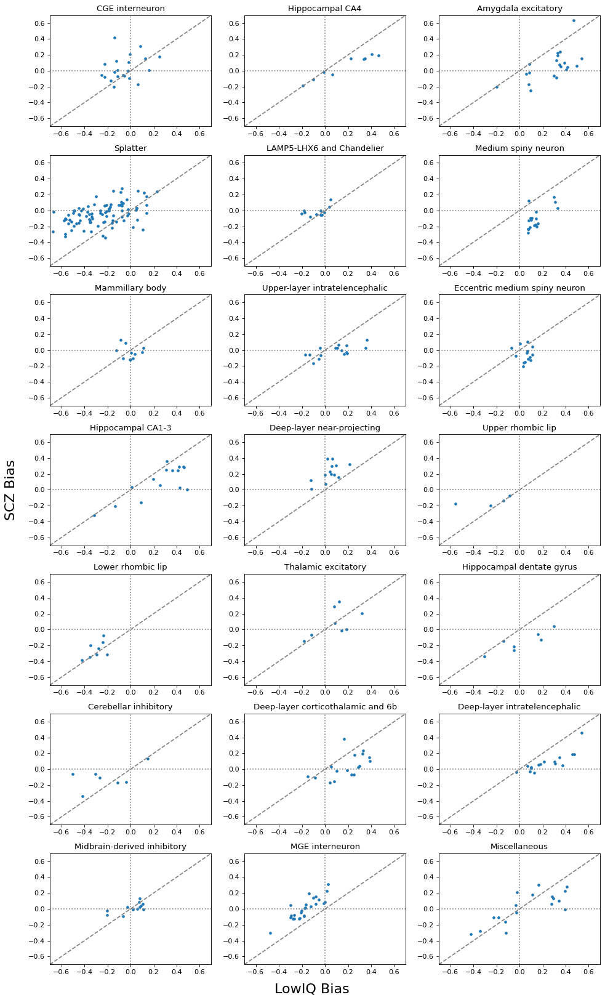

In [240]:
#len(SuperClusters) # 5*5
fig = plt.figure(figsize=(12, 20), constrained_layout=False)
spec = fig.add_gridspec(ncols=3, nrows=7)

SuperClusters = list(set(CT_LowIQ_Z2["Supercluster"]))
idx = 0
for a in range(7):
    for b in range(3):
        ax0 = fig.add_subplot(spec[a, b])
        tmp = res4[res4["Supercluster_asd"]==SuperClusters[idx]]
        ax0.scatter(tmp["EFFECT_asd"].values, tmp["EFFECT_scz"].values, s=10, )
        ax0.set_title(SuperClusters[idx])
        ax0.plot([-0.7,0.7],[-0.7,0.7], color="grey", ls="dashed")
        ax0.plot([0,0],[-0.7,0.7], color="grey", ls="dotted")
        ax0.plot([-0.7,0.7],[0,0], color="grey", ls="dotted")
        #ax0.set_xlabel("ASD bias")
        #ax0.set_ylabel("SCZ bias")
        ax0.set_xlim((-0.7, 0.7))
        ax0.set_ylim((-0.7, 0.7))
        if idx == 20:
            break
        idx += 1
plt.tight_layout()
fig.text(0.5, -0.01, 'LowIQ Bias', ha='center', fontsize=20)
fig.text(-0.02, 0.5, 'SCZ Bias', va='center', rotation='vertical', fontsize=20)
plt.savefig("../figs/ASD_ASD_SCZ_Human_CT.pdf", bbox_inches="tight")

In [241]:
res4

,EFFECT_asd,Rank_asd,Supercluster_asd,Subtype_asd,Neurotransmitter_asd,Top three regions_asd,Top three dissections_asd,Number of cells_asd,EFFECT_scz,Rank_scz,Supercluster_scz,Subtype_scz,Neurotransmitter_scz,Top three regions_scz,Top three dissections_scz,Number of cells_scz
STR,,,,,,,,,,,,,,,,
173,0.538329,1,Amygdala excitatory,NaN,VGLUT1 VGLUT2,"Hippocampus: 55.8%, Amygdala: 36.5%, Cerebral ...","Human Sub: 55.8%, Human BM: 30.5%, Human CMN: ...",233.0,0.156640,57,Amygdala excitatory,NaN,VGLUT1 VGLUT2,"Hippocampus: 55.8%, Amygdala: 36.5%, Cerebral ...","Human Sub: 55.8%, Human BM: 30.5%, Human CMN: ...",233.0
136,0.537587,2,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 54.6%, Cerebral cortex: 36.2%, Hypot...","Human CoA: 54.6%, Human AON: 28.3%, Human HTHs...",152.0,0.455550,2,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 54.6%, Cerebral cortex: 36.2%, Hypot...","Human CoA: 54.6%, Human AON: 28.3%, Human HTHs...",152.0
161,0.495363,3,Amygdala excitatory,NaN,VGLUT1 VGLUT2,"Amygdala: 66.2%, Cerebral cortex: 31.6%, Hippo...","Human CMN: 57.7%, Human Pir: 21.2%, Human A35-...",7442.0,0.062534,109,Amygdala excitatory,NaN,VGLUT1 VGLUT2,"Amygdala: 66.2%, Cerebral cortex: 31.6%, Hippo...","Human CMN: 57.7%, Human Pir: 21.2%, Human A35-...",7442.0
189,0.490137,4,Hippocampal CA1-3,NaN,VGLUT1,"Hippocampus: 73.4%, Amygdala: 24.4%, Hypothala...","Human CA1: 38.1%, Human CA1U-CA2U-CA3U: 30.7%,...",349.0,0.005390,160,Hippocampal CA1-3,NaN,VGLUT1,"Hippocampus: 73.4%, Amygdala: 24.4%, Hypothala...","Human CA1: 38.1%, Human CA1U-CA2U-CA3U: 30.7%,...",349.0
145,0.475975,5,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Cerebral cortex: 65.1%, Hippocampus: 19.6%, Am...","Human MEC: 29.7%, Human LEC: 27.4%, Human Sub:...",4953.0,0.188139,46,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Cerebral cortex: 65.1%, Hippocampus: 19.6%, Am...","Human MEC: 29.7%, Human LEC: 27.4%, Human Sub:...",4953.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,-0.568659,357,Splatter,NaN,GABA,"Thalamus: 81.4%, Amygdala: 5.6%, Pons: 5.3%","Human LG: 42.0%, Human ANC: 34.7%, Human BNST:...",3366.0,-0.298368,348,Splatter,NaN,GABA,"Thalamus: 81.4%, Amygdala: 5.6%, Pons: 5.3%","Human LG: 42.0%, Human ANC: 34.7%, Human BNST:...",3366.0
360,-0.568889,358,Splatter,NaN,GABA,"Midbrain: 99.1%, Pons: 0.8%, Thalamus: 0.1%","Human SC: 87.1%, Human IC: 10.6%, Human PTR: 0.6%",1215.0,-0.327239,356,Splatter,NaN,GABA,"Midbrain: 99.1%, Pons: 0.8%, Thalamus: 0.1%","Human SC: 87.1%, Human IC: 10.6%, Human PTR: 0.6%",1215.0
358,-0.576367,359,Splatter,NaN,GABA,"Midbrain: 91.5%, Thalamus: 7.8%, Pons: 0.4%","Human SC: 30.4%, Human PTR: 26.0%, Human PAG: ...",3175.0,-0.123692,284,Splatter,NaN,GABA,"Midbrain: 91.5%, Thalamus: 7.8%, Pons: 0.4%","Human SC: 30.4%, Human PTR: 26.0%, Human PAG: ...",3175.0
